In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import transforms

import numpy as np
import os

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF
import matplotlib.pyplot as plt

from typing import Optional

# Models

In [51]:
class CNPEncoder(nn.Module):

  def __init__(self, in_dim: int, hidden_dim: int, n_layers: int):
    super(CNPEncoder, self).__init__()

    encoder_layers = [nn.Linear(in_dim, hidden_dim), nn.ReLU()]
    for i in range(n_layers-2):
      encoder_layers.append(nn.Linear(hidden_dim, hidden_dim))
      encoder_layers.append(nn.ReLU())
    encoder_layers.append(nn.Linear(hidden_dim, hidden_dim))

    self.encoder = nn.Sequential(*encoder_layers)

  def forward(self, x_c, y_c):
    """ Encoder context set into a single representation
    Args:
      x_c: tensor of dim (batch_size, n_context, x_dim)
      y_c: tensor of dim (batch_size, n_context, y_dim)
    """
    xy_c = torch.cat((x_c, y_c), dim=-1)
    r = torch.mean(self.encoder(xy_c), dim=1, keepdims=True)
    return r


class CNPDecoder(nn.Module):

  def __init__(
      self,
      in_dim: int,
      hidden_dim: int,
      out_dim: int,
      n_layers: int,
      sigma_min: Optional[float]
      ):
    super(CNPDecoder, self).__init__()

    decoder_layers = [nn.Linear(in_dim, hidden_dim), nn.ReLU()]
    for i in range(n_layers-2):
      decoder_layers.append(nn.Linear(hidden_dim, hidden_dim))
      decoder_layers.append(nn.ReLU())
    decoder_layers.append(nn.Linear(hidden_dim, out_dim))
    self.decoder = nn.Sequential(*decoder_layers)

    self.sigma_transform = (lambda sigma: sigma_min + (1-sigma_min)*F.softplus(sigma)) if sigma_min else (lambda sigma: F.softplus(sigma))

  def forward(self, r, x_t):
    """Produce predictions for mean and variance at target locations x_t given representation r of context set
    Args:
        r : representation of context set, tensor of dim (batch_size, 1  r_dim)
        x_t : target inputs, tensor of dim (batch_size, n_target, x_dim)
    """
    q_t = torch.cat((torch.cat((r,)*x_t.shape[1], dim=1), x_t), dim=-1)
    h_t = self.decoder(q_t)
    mu_t, sigma_t = h_t[:,:,range(0, h_t.shape[-1], 2)], h_t[:,:,range(1, h_t.shape[-1], 2)]
    sigma_t = self.sigma_transform(sigma_t)

    return mu_t, sigma_t


class CNP(nn.Module):

  def __init__(
      self,
      x_dim: int,
      y_dim: int,
      encoder_dim: int,
      encoder_layers: int,
      decoder_dim: int,
      decoder_layers: int,
      sigma_min: Optional[float]
      ):
    super(CNP, self).__init__()
    self.encoder = CNPEncoder(x_dim+y_dim, encoder_dim, encoder_layers)
    self.decoder = CNPDecoder(x_dim+encoder_dim, decoder_dim, 2*y_dim, decoder_layers, sigma_min=sigma_min)

  def forward(self, x_c: torch.tensor, y_c: torch.tensor, x_t: torch.tensor):
    r = self.encoder(x_c, y_c)
    mu_t, sigma_t = self.decoder(r, x_t)
    return mu_t, sigma_t

# 1D Regression

In [ ]:
class GPDataset(torch.utils.data.Dataset):

  def __init__(self, size, x_min, x_max, train, kernel):
    self.size = size
    self.train = train
    self.gp = GaussianProcessRegressor(kernel=kernel)

    grid = (x_max - x_min) * torch.rand(size=(size,100)) - x_max
    self.data = [
        (grid[idx,:].view(-1,1), torch.tensor(self.gp.sample_y(grid[idx,:].view(-1,1), random_state=(2*idx if self.train else 2*idx+1)), dtype=torch.float32)) for idx in range(size)
    ]

  def __len__(self):
    return self.size

  def __getitem__(self, idx):
    return self.data[idx]

In [ ]:
gp_train_dataset = GPDataset(size=50000, x_min=-2, x_max=2, train=True, kernel=RBF(length_scale=0.4))
gp_train_dataloader = torch.utils.data.DataLoader(dataset=gp_train_dataset, batch_size=16, shuffle=True)
gp_test_dataset = GPDataset(size=50, x_min=-2, x_max=2, train=False, kernel=RBF(length_scale=0.4))
gp_test_dataloader = torch.utils.data.DataLoader(dataset=gp_train_dataset, batch_size=16, shuffle=True)

KeyboardInterrupt: 

In [ ]:
model = CNP(x_dim=1, y_dim=1, encoder_dim=128, encoder_layers=3, decoder_dim=128, decoder_layers=5, sigma_min=0.1)
optimiser = torch.optim.Adam(model.parameters(), lr=5e-4)
nll = torch.nn.GaussianNLLLoss()

In [ ]:
min_c, max_c = 1, 99
min_t, max_t = 1, 20
num_epochs = 500
gp = GaussianProcessRegressor(kernel=RBF(length_scale=0.4))
for epoch in range(num_epochs):
    running_loss = 0
    for (X, Y) in gp_train_dataloader:
        num_c = torch.randint(low=min_c, high=max_c, size=(1,)).item()
        num_t = torch.randint(low=min_t, high=max_t, size=(1,)).item()
        idxs = torch.randperm(X.shape[1])
        idxs_c, idxs_t = idxs[:num_c], idxs[num_c:]
        x_c, y_c, x_t, y_t = X[:,idxs_c,:], Y[:,idxs_c,:], X[:,:,:], Y[:,:,:]
        optimiser.zero_grad()
        mu_t, sigma_t = model(x_c, y_c, x_t)
        loss = - torch.distributions.normal.Normal(mu_t, sigma_t).log_prob(value=y_t).mean()
        running_loss += loss.item()
        loss.backward()
        optimiser.step()
    if epoch % 1 == 0:
      print(f"Loss at epoch {epoch}:", running_loss/len(gp_train_dataloader))
      X = torch.linspace(-2,2,200).view(1,200,1)
      Y = torch.tensor(gp.sample_y(X.view(-1,1)), dtype=torch.float).view(1,-1,1)
      idxs = torch.randperm(200)
      num_c = torch.randint(low=min_t, high=max_t, size=(1,)).item()
      idxs_c, idxs_t = idxs[:num_c], idxs[num_c:]
      x_c, y_c, x_t, y_t = X[:,idxs_c,:], Y[:,idxs_c,:], X[:,:,:], Y[:,:,:]
      mu_t, sigma_t = model(x_c, y_c, X)
      plt.plot(X.view(-1), Y.view(-1), label=r"$f(x) = x \sin(x)$", linestyle="dotted")
      plt.scatter(x_c.view(-1), y_c.view(-1), label="Observations")
      plt.plot(X.view(-1), mu_t.detach().view(-1), label="Mean prediction")
      plt.fill_between(
          X.ravel(),
          mu_t.detach().view(-1) - sigma_t.detach().view(-1),
          mu_t.detach().view(-1) +  sigma_t.detach().view(-1),
          alpha=0.5,
          label=r"95% confidence interval",
      )
      plt.show()

# MNIST

In [ ]:
mnist_train_data = torchvision.datasets.MNIST(
    root="mnist_trainc",
    train=True,
    download=True,
    transform=torchvision.transforms.Compose([
                               torchvision.transforms.Resize((32,32)),
                               torchvision.transforms.ToTensor()
                             ]))
mnist_test_data = torchvision.datasets.MNIST(
    root="mnist_testc",
    train=False,
    download=True,
    transform=torchvision.transforms.Compose([
                               torchvision.transforms.Resize((32,32)),
                               torchvision.transforms.ToTensor()
                             ]))
batch_size = 32
train_subset, val_subset = torch.utils.data.random_split(
        mnist_train_data, [57500, 2500], generator=torch.Generator().manual_seed(1))
mnist_trainloader = torch.utils.data.DataLoader(dataset=train_subset, shuffle=True, batch_size=batch_size)
mnist_valloader = torch.utils.data.DataLoader(dataset=val_subset, shuffle=False, batch_size=batch_size)
mnist_testloader = torch.utils.data.DataLoader(dataset=mnist_test_data, shuffle=False, batch_size=batch_size)

In [ ]:
def plot_mnist_data(imgs, xs, mu_t, sigma_t):
  x1s, x2s = xs[:,0], xs[:,1]
  fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4)
  imgs = imgs.to("cpu")
  background = torch.ones((32,32,3)).to(imgs.device)
  background[x1s, x2s, :] = imgs[0,:,x1s, x2s].transpose(0,1)
  ax1.imshow(background)
  ax2.imshow(imgs[0,:,:,:].permute(1, 2, 0), cmap="gray")
  ax3.imshow(mu_t.cpu().detach().view(-1,32,32,1)[0,:,:,:], cmap="gray")
  ax4.imshow(sigma_t.cpu().detach().view(-1,32,32,1)[0,:,:,:], cmap="gray")
  plt.show()

def plot_mnist_data_range(imgs, model, ns, coords):
  for n in ns:
    xs = coords[torch.randperm(coords.shape[0])[:n],:]
    x_c = torch.stack([xs]*imgs.shape[0]) / 28 # normalise inputs
    x_t = torch.stack([coords]*imgs.shape[0]) / 28
    x1s, x2s = xs[:,0], xs[:,1]
    y_c = imgs[:,:,x1s,x2s].transpose(1,2)
    y_t = imgs[:,:,coords[:,0], coords[:,1]].transpose(1,2)
    x_c, x_t, y_c, y_t = x_c.to(device), x_t.to(device), y_c.to(device), y_t.to(device)
    mu_t, sigma_t = model(x_c, y_c, x_t)
    plot_mnist_data(imgs, xs, mu_t, sigma_t)

def get_exponential_decay_gamma(scheduling_factor, max_epochs):
    return (1 / scheduling_factor) ** (1 / max_epochs)

In [ ]:
model = CNP(x_dim=2, y_dim=1, encoder_dim=128, encoder_layers=3, decoder_dim=128, decoder_layers=5, sigma_min=0.1)
#optimiser = torch.optim.Adam(model.parameters(), lr=5e-4)
optimiser = torch.optim.Adam(model.parameters(), lr=1e-3)
clip_value = 10
sched = torch.optim.lr_scheduler.ExponentialLR(optimiser, get_exponential_decay_gamma(10,50))
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
model = model.to(device)
sum(p.numel() for p in model.parameters())

100098

Loss at epoch 0: -0.687730679731105


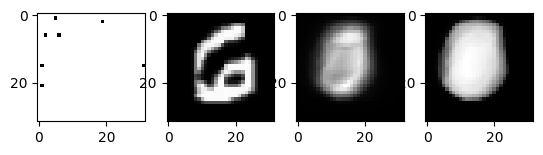

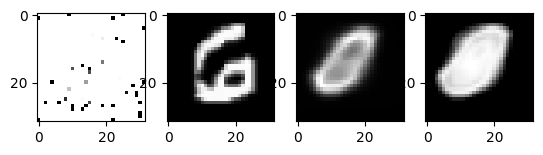

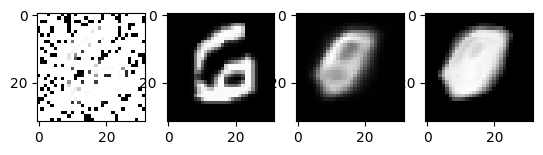

Loss at epoch 1: -0.6939926332730383


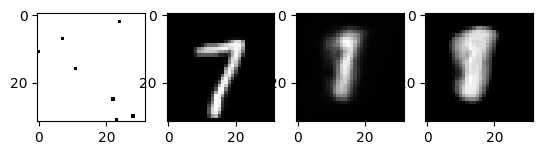

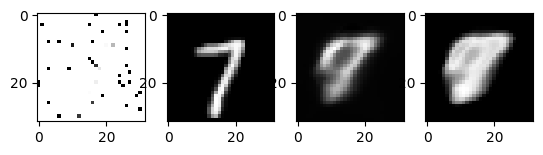

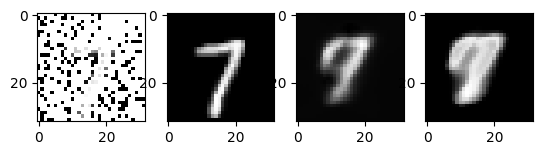

Loss at epoch 2: -0.691080940668624


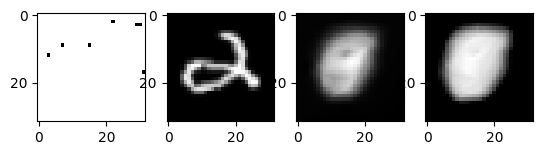

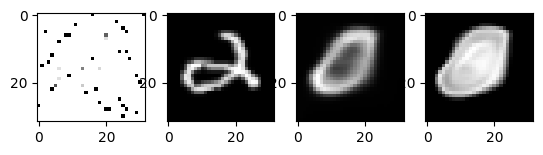

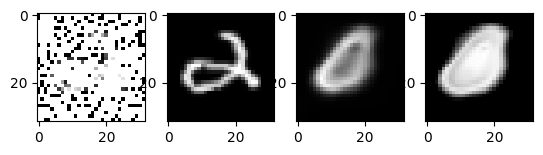

Loss at epoch 3: -0.699944251942001


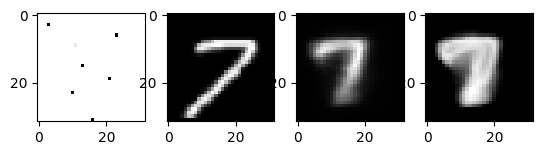

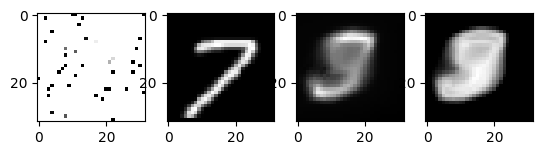

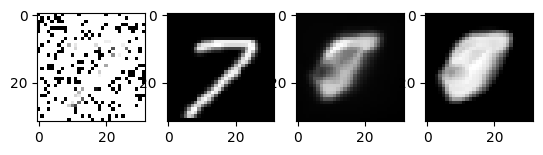

Loss at epoch 4: -0.7015427760593282


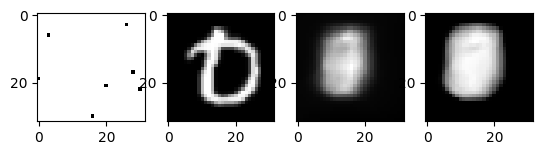

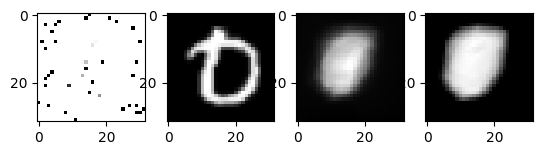

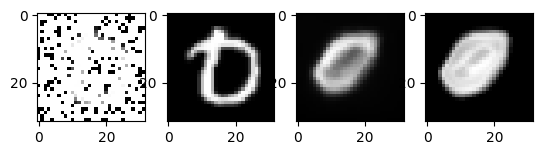

Loss at epoch 5: -0.7072046980506423


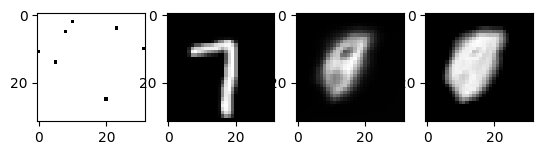

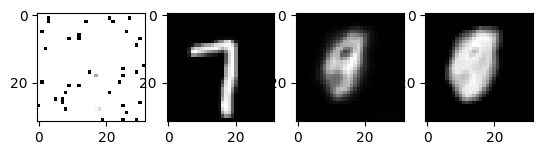

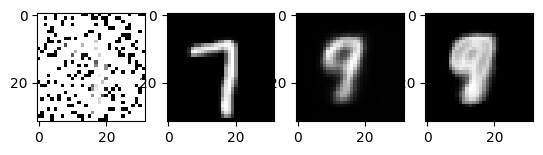

Loss at epoch 6: -0.7093944263809843


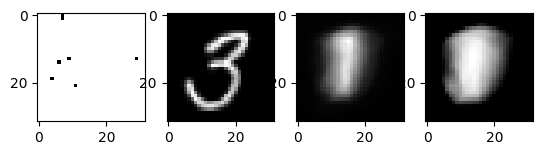

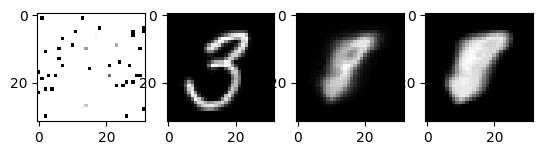

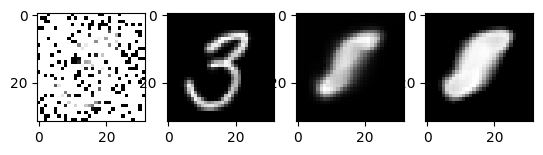

Loss at epoch 7: -0.7122959529501104


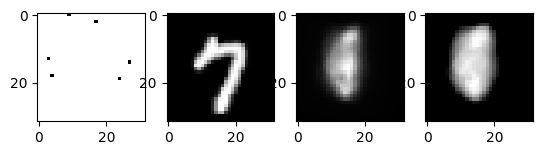

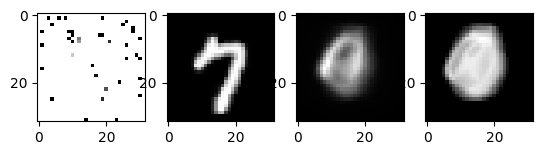

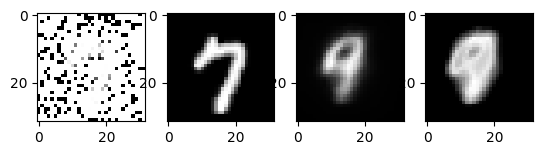

Loss at epoch 8: -0.718019747176831


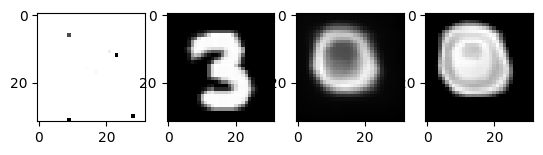

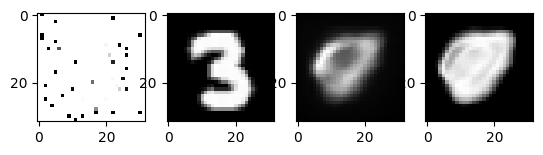

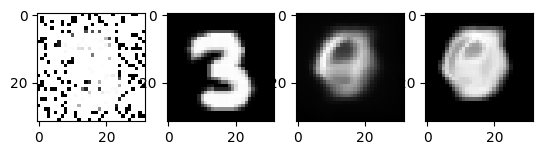

Loss at epoch 9: -0.7108430867516122


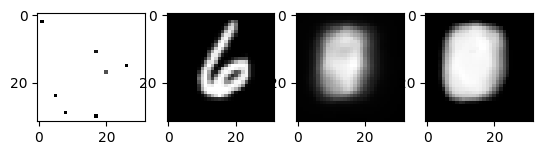

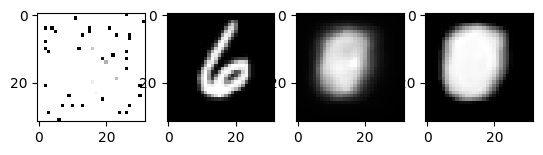

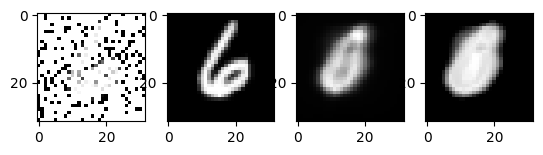

Loss at epoch 10: -0.711741268663819


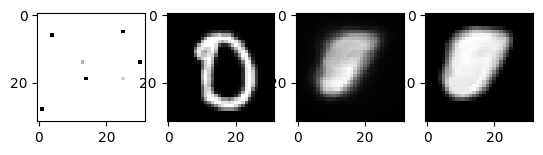

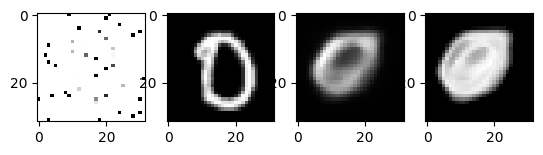

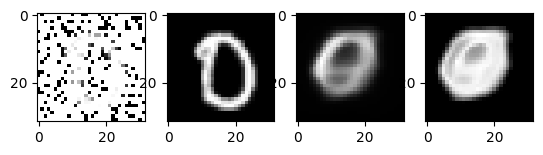

Loss at epoch 11: -0.7104139867164588


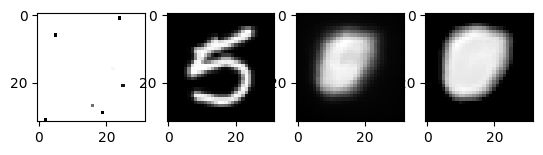

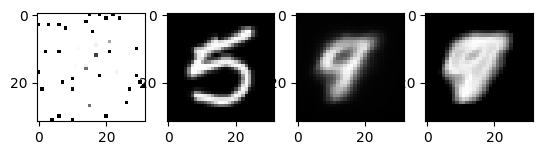

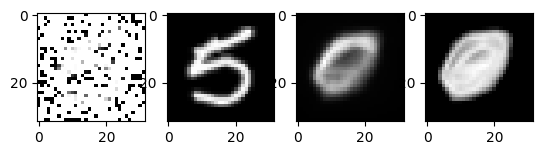

Loss at epoch 12: -0.7199023045064611


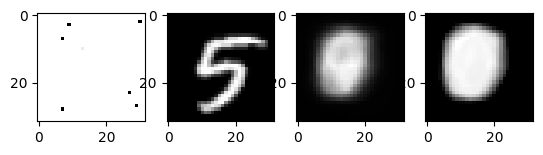

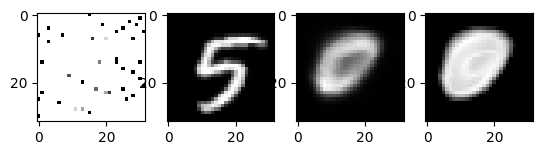

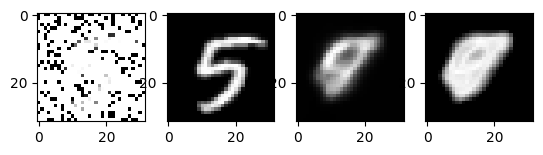

Loss at epoch 13: -0.7250287187019852


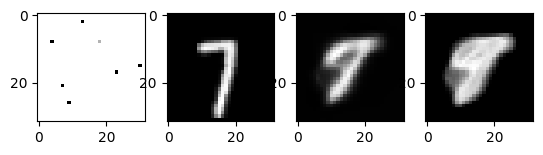

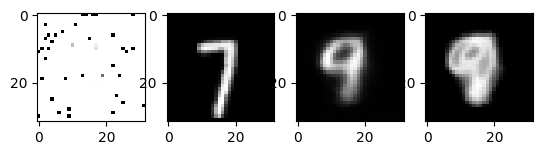

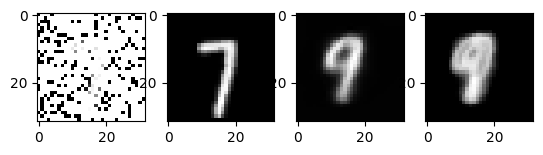

Loss at epoch 14: -0.7272174295118834


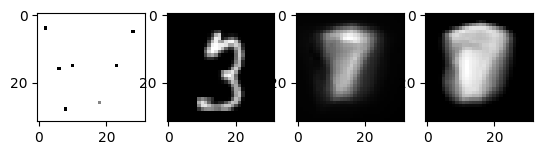

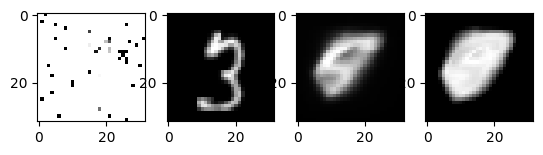

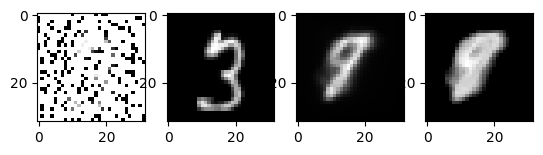

Loss at epoch 15: -0.7328372830011958


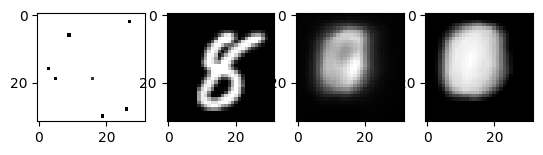

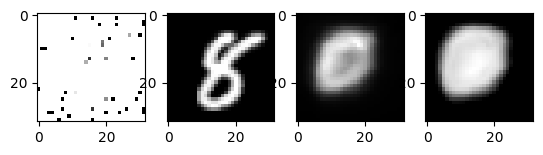

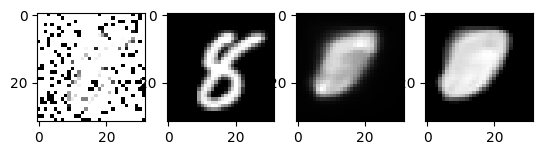

Loss at epoch 16: -0.7381353978405545


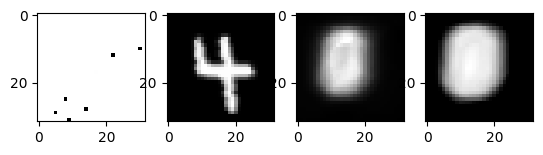

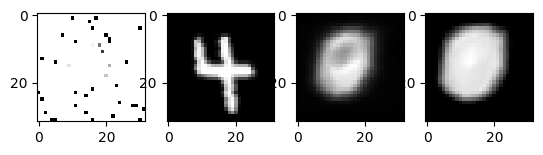

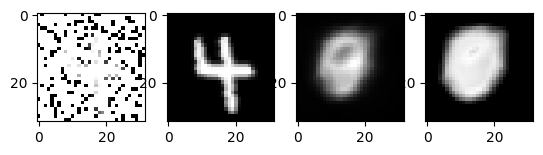

Loss at epoch 17: -0.7370790788882066


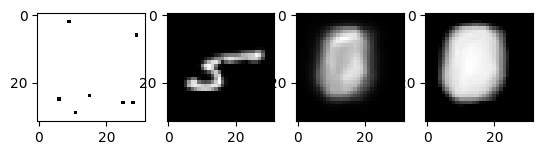

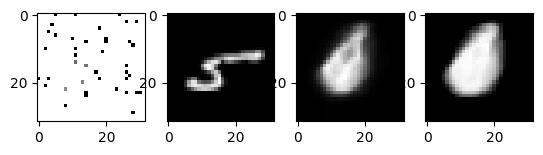

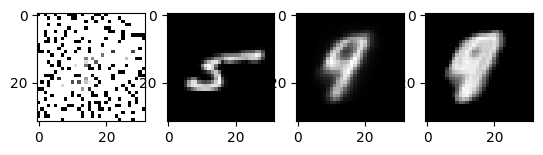

Loss at epoch 18: -0.7398065631016135


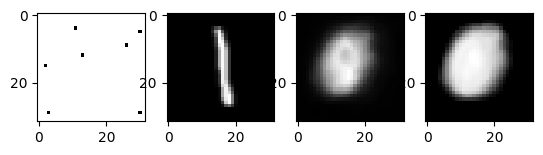

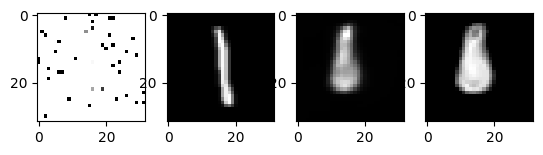

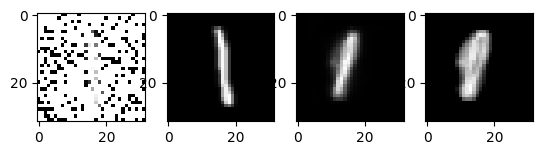

KeyboardInterrupt: 

In [ ]:
num_epochs = 50
coords = torch.tensor([(x1, x2) for x1 in range(32) for x2 in range(32)])
n_context_low = 1
n_context_high = len(coords) // 2

for epoch in range(num_epochs):
    running_loss = 0
    for (imgs, labs) in mnist_trainloader:

        n_context = torch.randint(low=n_context_low, high=n_context_high, size=(1,)).item()
        xs = coords[torch.randperm(coords.shape[0])[:n_context],:]
        x_c = torch.stack([xs]*imgs.shape[0]) / 32 # normalise inputs
        x_t = torch.stack([coords]*imgs.shape[0]) / 32
        x1s, x2s = xs[:,0], xs[:,1]
        y_c = imgs[:,:,x1s,x2s].transpose(1,2)
        y_t = imgs[:,:,coords[:,0], coords[:,1]].transpose(1,2)
        x_c, x_t, y_c, y_t = x_c.to(device), x_t.to(device), y_c.to(device), y_t.to(device)

        optimiser.zero_grad()
        mu_t, sigma_t = model(x_c, y_c, x_t)
        loss = - torch.distributions.normal.Normal(mu_t, sigma_t).log_prob(value=y_t).mean()
        running_loss += loss.item()
        loss.backward()
        optimiser.step()

    if epoch % 1 == 0:
        print(f"Loss at epoch {epoch}:", running_loss/len(mnist_trainloader))
        plot_mnist_data_range(imgs, model, [7,40,200], coords)

# On The Grid ConvCNP

In [ ]:
class DepthSepConv(nn.Module):

  def __init__(self, in_channels, out_channels, kernel_size):
    super(DepthSepConv, self).__init__()
    self.depthwise_conv = nn.Conv2d(in_channels=in_channels, out_channels=in_channels, groups=in_channels, kernel_size=kernel_size, padding=kernel_size//2, bias=False)
    self.pointwise_conv = nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False)

  def forward(self, h):
    return self.pointwise_conv(self.depthwise_conv(h))

class ResDepthSepConvBlock(nn.Module):

  def __init__(self, in_channels, out_channels, kernel_size, n_layers):
    super(ResDepthSepConvBlock, self).__init__()
    self.n_layers = n_layers
    if self.n_layers == 2:
      self.norm1 = nn.BatchNorm2d(in_channels)
      self.depthwise_conv1 = nn.Conv2d(in_channels=in_channels, out_channels=in_channels, groups=in_channels, kernel_size=kernel_size, padding=kernel_size//2)
      self.pointwise_conv1 = nn.Conv2d(in_channels, in_channels, kernel_size=1)
    self.norm2 = nn.BatchNorm2d(in_channels)
    self.depthwise_conv2 = nn.Conv2d(in_channels=in_channels, out_channels=in_channels, groups=in_channels, kernel_size=kernel_size, padding=kernel_size//2)
    self.pointwise_conv2 = nn.Conv2d(in_channels, out_channels, kernel_size=1)

  def forward(self, h):
    if self.n_layers == 2:
      h = F.relu(self.norm1(h))
      h = self.pointwise_conv1(self.depthwise_conv1(h))
    h = F.relu(self.norm2(h))
    h = self.pointwise_conv1(self.depthwise_conv1(h))
    return h

In [ ]:
class GridConvCNPEncoder(nn.Module):

  def __init__(self, out_channels, encoder_channels, encoder_layers, coords):
    super(GridConvCNPEncoder, self).__init__()
    self.coords = coords
    self.conv = nn.Conv2d(out_channels, out_channels, groups=out_channels, kernel_size=11, padding=11//2, bias=False)
    self.resizer = nn.Linear(2*out_channels,encoder_channels)
    #cnn = []
    cnn = []
    for i in range(encoder_layers):
      cnn += [ResDepthSepConvBlock(encoder_channels, encoder_channels,9, 2)]
    self.cnn = nn.Sequential(*cnn)


  def forward(self, imgs, xs):

    x1s, x2s = xs[:,0], xs[:,1]
    density, signal = torch.zeros_like(imgs), torch.zeros_like(imgs)
    density[:,:,x1s,x2s] = 1
    signal[:,:,x1s,x2s] = imgs[:,:,x1s,x2s]

    signal = self.conv(signal)
    density = self.conv(density)
    h = torch.cat([signal, density], dim=1)
    h = self.resizer(h.permute(0,2,3,1)).permute(0,3,1,2)
    r = self.cnn(h).permute(0,2,3,1)

    return r


class GridConvCNPDecoder(nn.Module):

  def __init__(self, in_dim, hidden_dim, out_dim, n_layers, sigma_min):
    super(GridConvCNPDecoder, self).__init__()
    self.out_dim = out_dim

    decoder_layers = [nn.Linear(in_dim, hidden_dim), nn.ReLU()]
    for i in range(n_layers-1):
      decoder_layers.append(nn.Linear(hidden_dim, hidden_dim))
      decoder_layers.append(nn.ReLU())
    decoder_layers.append(nn.Linear(hidden_dim, out_dim))
    self.decoder = nn.Sequential(*decoder_layers)
    self.sigma_transform = (lambda sigma: sigma_min + (1-sigma_min)*F.softplus(sigma)) if sigma_min else (lambda sigma: F.softplus(sigma))

  def forward(self, r):
    h_t = self.decoder(r)
    mu_t, sigma_t = h_t.split(self.out_dim//2, dim=-1)
    sigma_t = self.sigma_transform(sigma_t)

    return mu_t, sigma_t

class GridConvCNP(nn.Module):

  def __init__(
      self,
      x_channels: int,
      y_channels: int,
      encoder_channels: int,
      encoder_layers: int,
      decoder_dim: int,
      decoder_layers: int,
      sigma_min: Optional[float],
      coords
      ):
    super(GridConvCNP, self).__init__()
    self.encoder = GridConvCNPEncoder(y_channels, encoder_channels, encoder_layers, coords)
    self.decoder = GridConvCNPDecoder(encoder_channels, decoder_dim, 2*y_channels, decoder_layers, sigma_min)

  def forward(self, imgs, xs):
    r = self.encoder(imgs, xs)
    mu_t, sigma_t = self.decoder(r)
    return mu_t, sigma_t

### ConvCNP MNIST

In [ ]:
mnist_train_data = torchvision.datasets.MNIST(
    root="mnist_trainc",
    train=True,
    download=True,
    transform=torchvision.transforms.Compose([
                               torchvision.transforms.Resize((32,32)),
                               torchvision.transforms.ToTensor()
                             ]))
mnist_test_data = torchvision.datasets.MNIST(
    root="mnist_testc",
    train=False,
    download=True,
    transform=torchvision.transforms.Compose([
                               torchvision.transforms.Resize((32,32)),
                               torchvision.transforms.ToTensor()
                             ]))

100%|██████████| 9912422/9912422 [00:00<00:00, 211017440.65it/s]

Extracting mnist_trainc/MNIST/raw/train-images-idx3-ubyte.gz to mnist_trainc/MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 17429596.23it/s]


Extracting mnist_trainc/MNIST/raw/train-labels-idx1-ubyte.gz to mnist_trainc/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 85980051.18it/s]

Extracting mnist_trainc/MNIST/raw/t10k-images-idx3-ubyte.gz to mnist_trainc/MNIST/raw


100%|██████████| 4542/4542 [00:00<00:00, 4757874.32it/s]


Extracting mnist_trainc/MNIST/raw/t10k-labels-idx1-ubyte.gz to mnist_trainc/MNIST/raw



100%|██████████| 9912422/9912422 [00:00<00:00, 244796283.78it/s]


Extracting mnist_testc/MNIST/raw/train-images-idx3-ubyte.gz to mnist_testc/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 30170783.02it/s]


Extracting mnist_testc/MNIST/raw/train-labels-idx1-ubyte.gz to mnist_testc/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 92876883.78it/s]

Extracting mnist_testc/MNIST/raw/t10k-images-idx3-ubyte.gz to mnist_testc/MNIST/raw


100%|██████████| 4542/4542 [00:00<00:00, 7957614.36it/s]

Extracting mnist_testc/MNIST/raw/t10k-labels-idx1-ubyte.gz to mnist_testc/MNIST/raw



In [ ]:
batch_size = 32
train_subset, val_subset = torch.utils.data.random_split(
        mnist_train_data, [57500, 2500], generator=torch.Generator().manual_seed(1))
mnist_trainloader = torch.utils.data.DataLoader(dataset=train_subset, shuffle=True, batch_size=batch_size)
mnist_valloader = torch.utils.data.DataLoader(dataset=val_subset, shuffle=False, batch_size=256)
mnist_testloader = torch.utils.data.DataLoader(dataset=mnist_test_data, shuffle=False, batch_size=256)

In [ ]:
def plot_mnist_data(imgs, xs, mu_t, sigma_t):
  x1s, x2s = xs[:,0], xs[:,1]
  fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4)
  imgs = imgs.to("cpu")
  background = torch.ones((32,32,3)).to(imgs.device)
  background[x1s, x2s, :] = imgs[0,:,x1s, x2s].transpose(0,1)
  ax1.imshow(background)
  ax2.imshow(imgs[0,:,:,:].permute(1, 2, 0), cmap="gray")
  ax3.imshow(mu_t.cpu().detach()[0,:,:,:], cmap="gray")
  ax4.imshow(sigma_t.cpu().detach()[0,:,:,:], cmap="gray")
  plt.show()

def plot_mnist_data_range(imgs, model, ns):
  for n in ns:
    xs = coords[torch.randperm(coords.shape[0])[:n],:]
    imgs = imgs.to(device)
    y_t = imgs.permute(0,2,3,1)
    mu_t, sigma_t = model(imgs, xs)
    plot_mnist_data(imgs, xs, mu_t, sigma_t)

def get_exponential_decay_gamma(scheduling_factor, max_epochs):
    return (1 / scheduling_factor) ** (1 / max_epochs)

In [ ]:
coords = torch.tensor([(x1, x2) for x1 in range(32) for x2 in range(32)])
model = GridConvCNP(1, 1, 128, 5, 128, 4, 0.1, coords)
optimiser = torch.optim.Adam(model.parameters(), lr=1e-3)
clip_value = 10
sched = torch.optim.lr_scheduler.ExponentialLR(optimiser, get_exponential_decay_gamma(10,50))
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
model = model.to(device)
sum(p.numel() for p in model.parameters())

339451

Loss at epoch 0: -1.1503976821899413
Loss at epoch 0: -0.9941366534803475


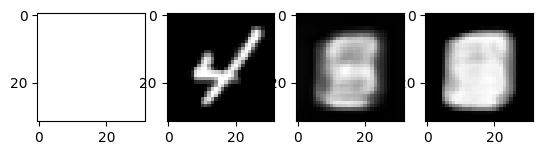

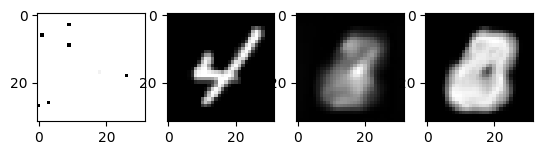

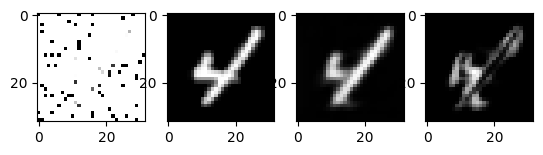

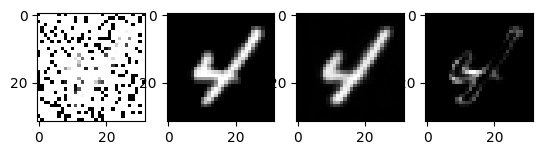

Loss at epoch 0: -1.1382326737046242
Loss at epoch 1: -1.225165843963623
Loss at epoch 1: -1.1623609066507057


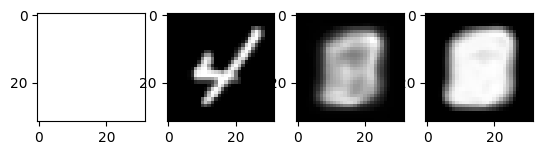

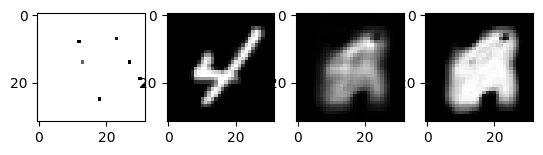

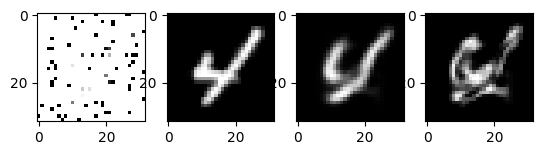

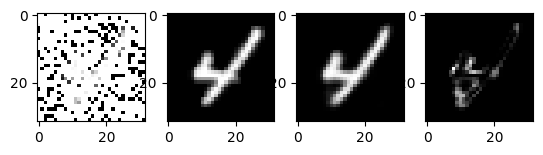

Loss at epoch 1: -1.133533002436161
Loss at epoch 2: -1.249799621105194
Loss at epoch 2: -1.1786172130768606


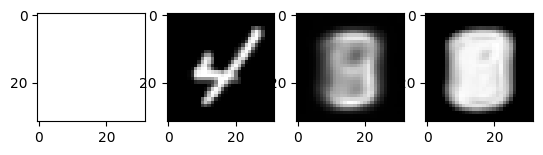

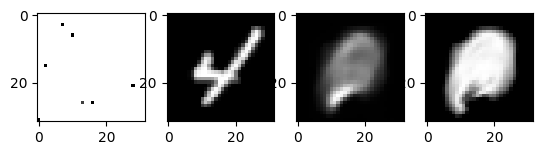

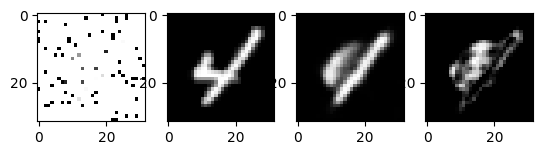

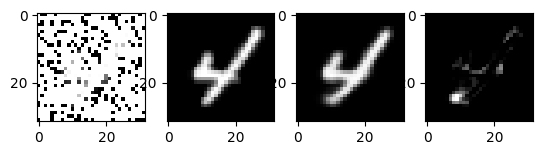

Loss at epoch 2: -1.191369667649269
Loss at epoch 3: -1.27850661277771
Loss at epoch 3: -1.191451965170432


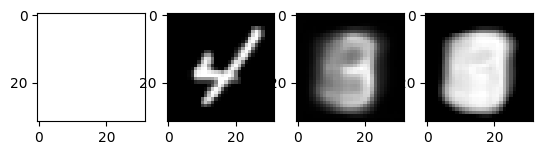

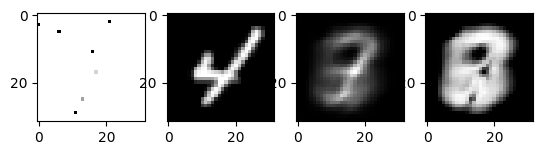

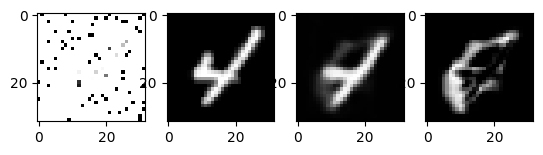

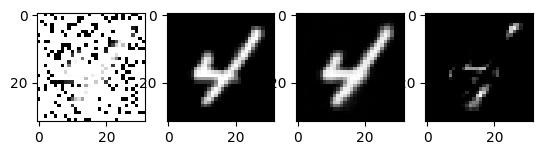

Loss at epoch 3: -1.2147340148687362
Loss at epoch 4: -1.1893761873245239
Loss at epoch 4: -1.207235698890341


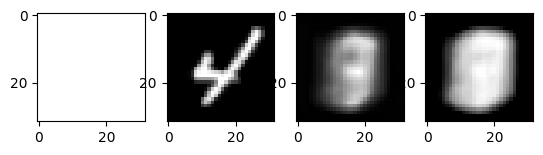

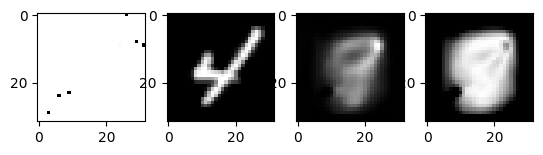

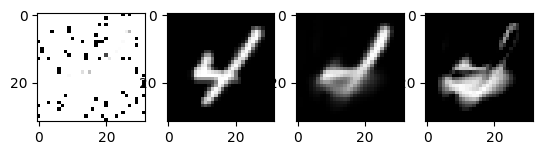

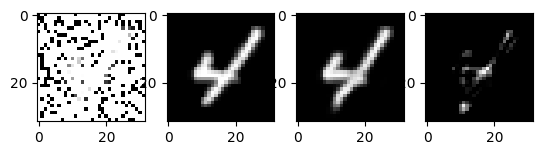

Loss at epoch 4: -1.2342260122299193
Loss at epoch 5: -1.2093961119651795
Loss at epoch 5: -1.2035360782758089


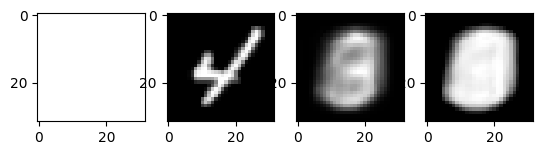

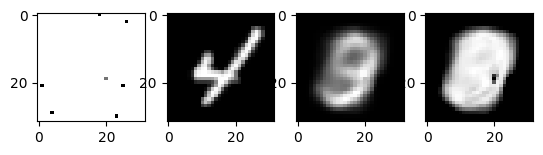

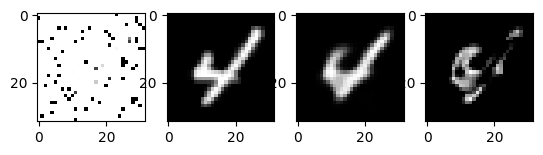

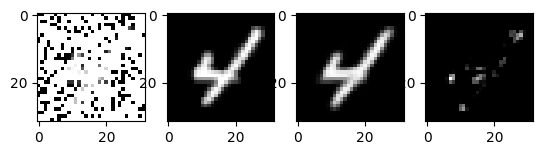

Loss at epoch 5: -1.2126911208033562
Loss at epoch 6: -1.2312787771224976
Loss at epoch 6: -1.2130767028565266


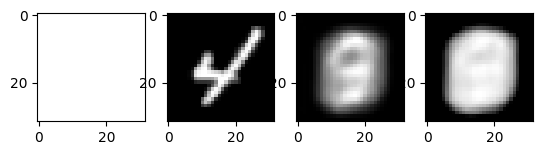

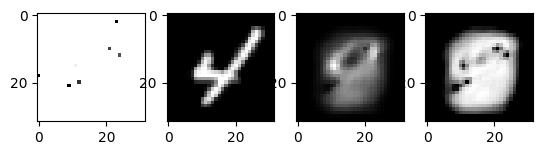

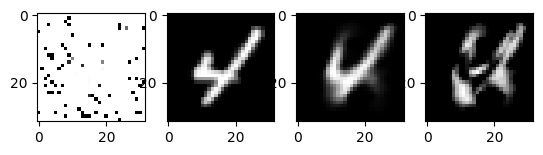

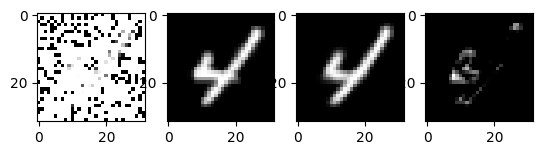

Loss at epoch 6: -1.2542455181479455
Loss at epoch 7: -1.2103673815727234
Loss at epoch 7: -1.2123872856332252


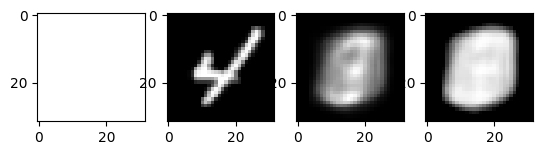

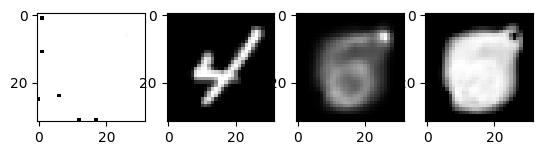

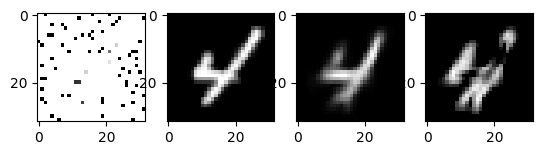

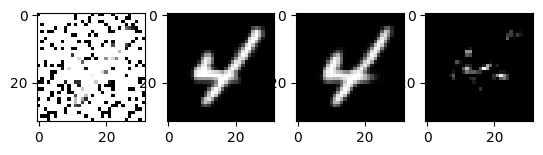

Loss at epoch 7: -1.2503977835178375
Loss at epoch 8: -1.274222457408905
Loss at epoch 8: -1.2223801552818163


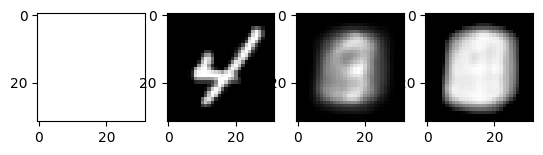

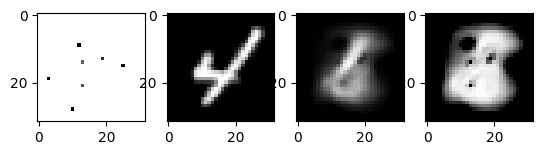

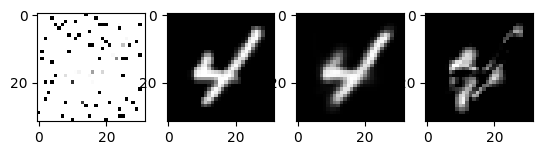

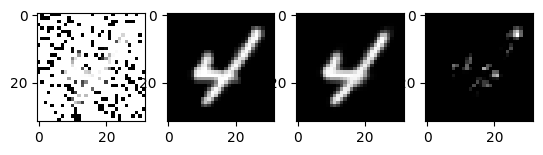

Loss at epoch 8: -1.2753594726324082
Loss at epoch 9: -1.2932876825332642
Loss at epoch 9: -1.2267599780491876


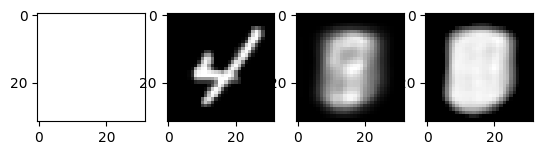

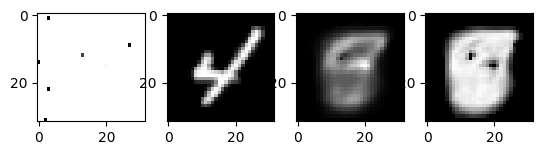

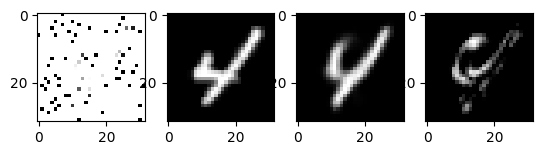

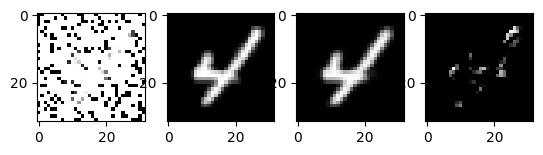

Loss at epoch 9: -1.2504501596093178
Loss at epoch 10: -1.2638243675231933
Loss at epoch 10: -1.2244748587932066


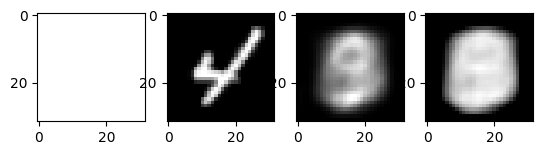

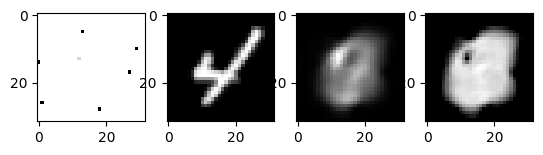

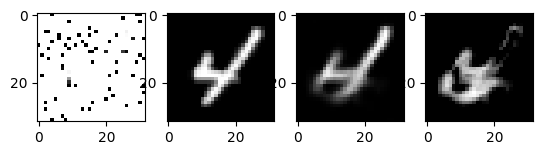

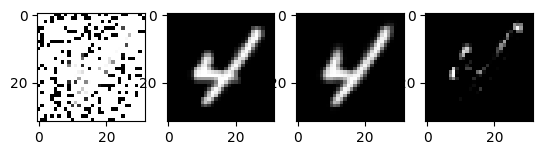

Loss at epoch 10: -1.2136285245418548
Loss at epoch 11: -1.1743763446807862
Loss at epoch 11: -1.2306423847981804


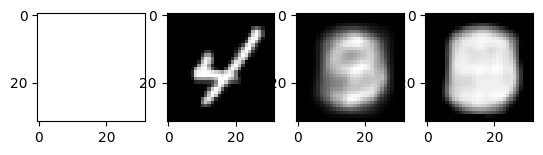

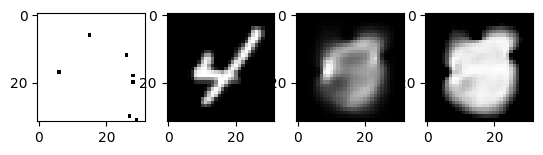

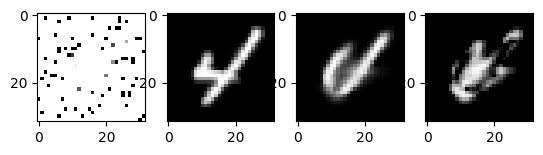

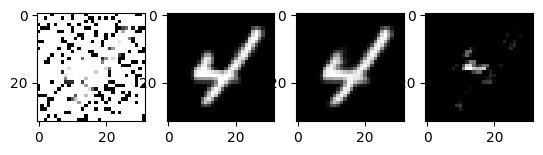

Loss at epoch 11: -1.273475779592991
Loss at epoch 12: -1.2837752103805542
Loss at epoch 12: -1.2259437892094678


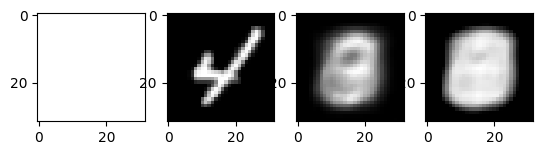

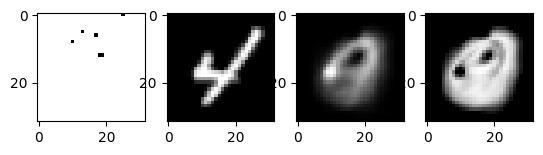

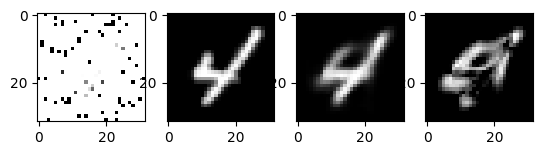

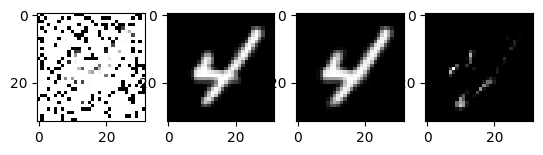

Loss at epoch 12: -1.2655193030834198
Loss at epoch 13: -1.1376576364040374
Loss at epoch 13: -1.234845352259091


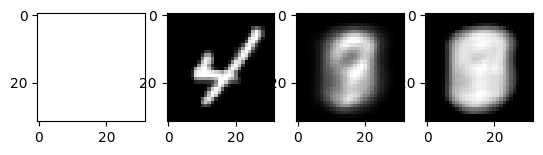

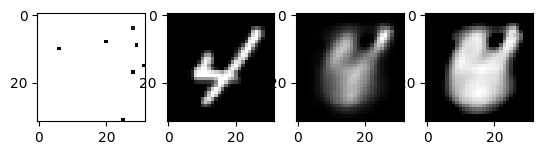

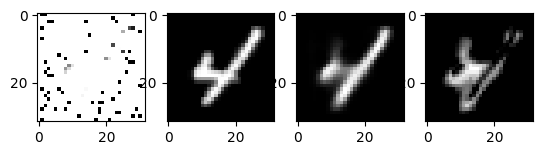

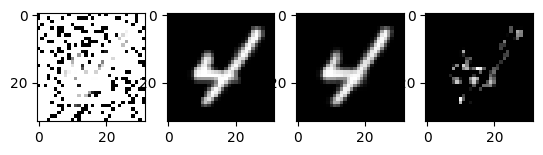

Loss at epoch 13: -1.2510151237249374
Loss at epoch 14: -1.2594300985336304
Loss at epoch 14: -1.2380739148617057


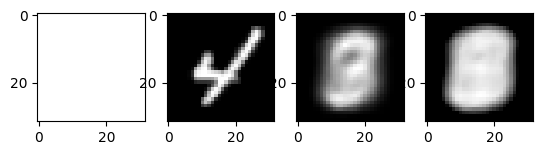

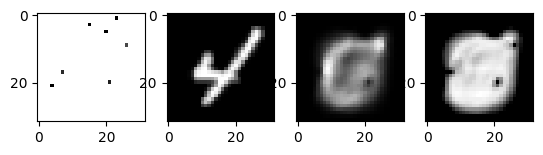

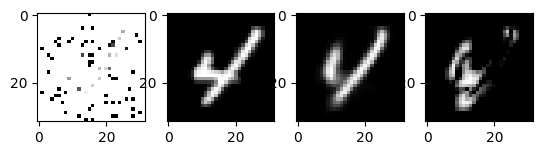

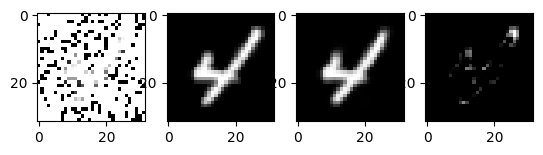

Loss at epoch 14: -1.2550821244716643
Loss at epoch 15: -1.2193966507911682
Loss at epoch 15: -1.2368937639242819


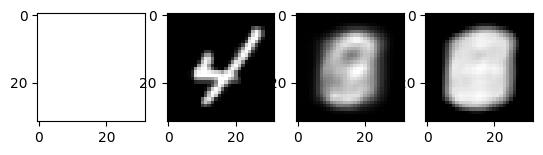

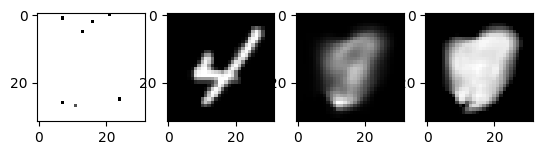

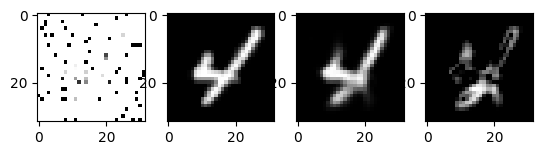

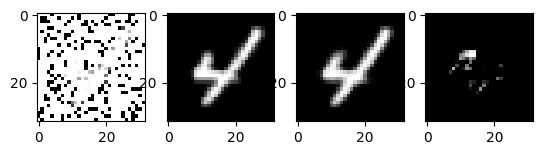

Loss at epoch 15: -1.2346735551953316
Loss at epoch 16: -1.2778771758079528
Loss at epoch 16: -1.2355549272292843


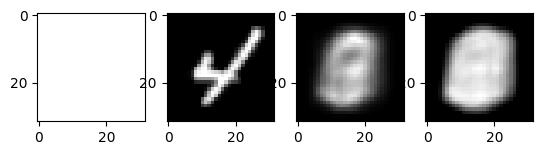

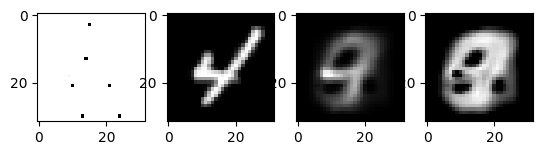

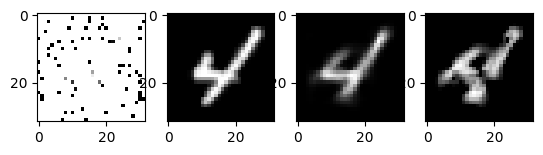

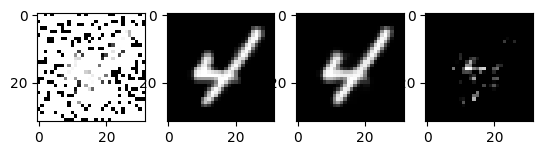

Loss at epoch 16: -1.2481745809316636
Loss at epoch 17: -1.3246086597442628
Loss at epoch 17: -1.2425289526042769


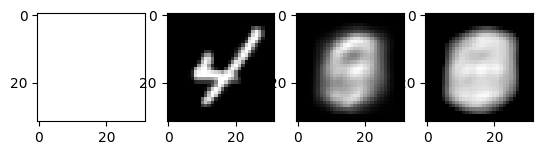

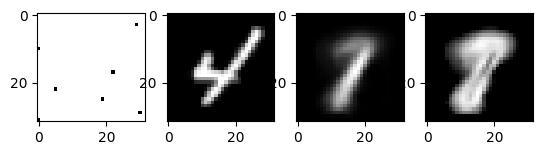

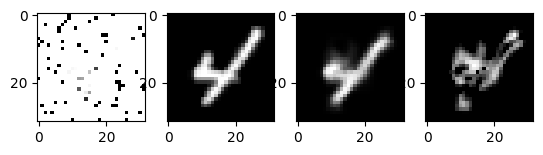

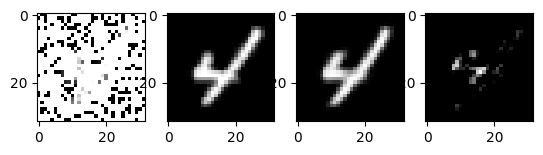

Loss at epoch 17: -1.2590553969144822
Loss at epoch 18: -1.275071382522583
Loss at epoch 18: -1.2428551864544417


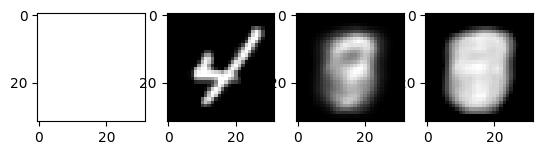

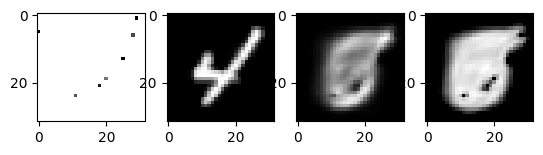

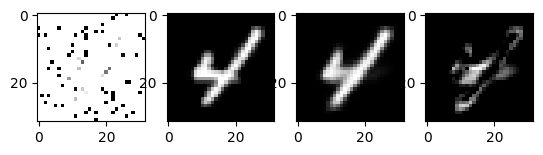

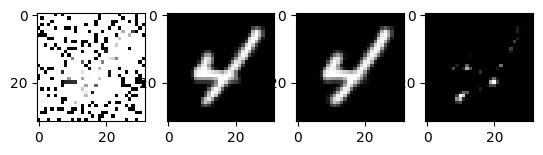

Loss at epoch 18: -1.2560606881976129
Loss at epoch 19: -1.2455351769924163
Loss at epoch 19: -1.241418030703804


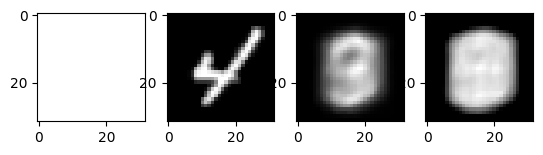

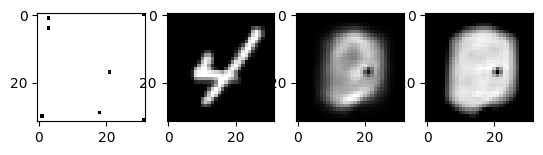

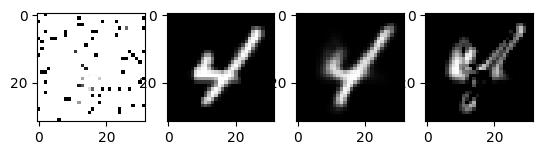

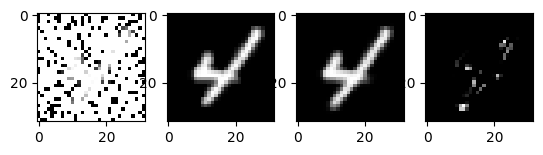

Loss at epoch 19: -1.2659584924578666
Loss at epoch 20: -1.2180423080921172
Loss at epoch 20: -1.2446022078303676


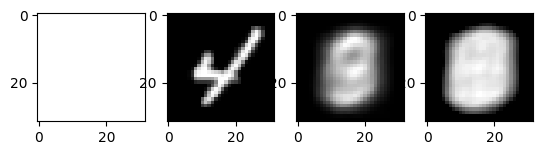

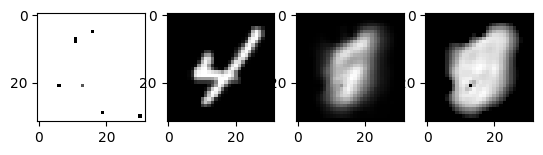

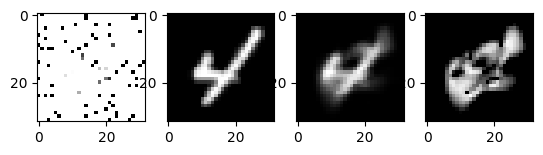

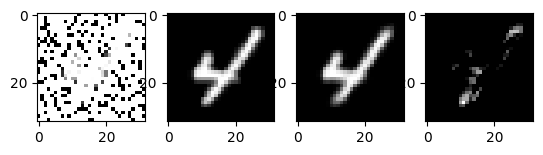

Loss at epoch 20: -1.2654314115643501
Loss at epoch 21: -1.2663404107093812
Loss at epoch 21: -1.2415976924702534


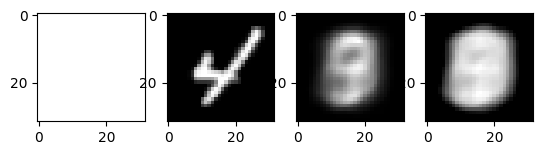

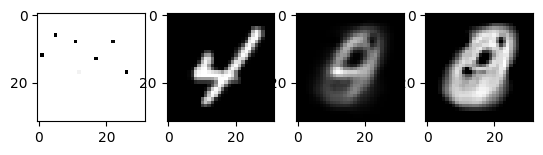

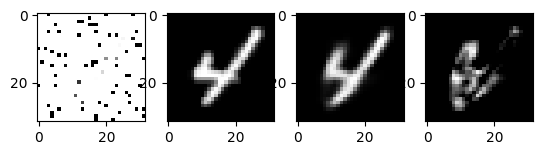

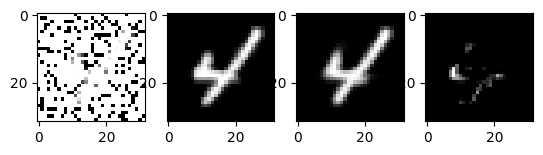

Loss at epoch 21: -1.224085484445095
Loss at epoch 22: -1.2392398774623872
Loss at epoch 22: -1.2327315878158287


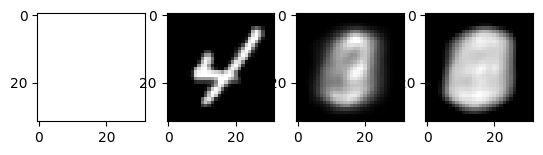

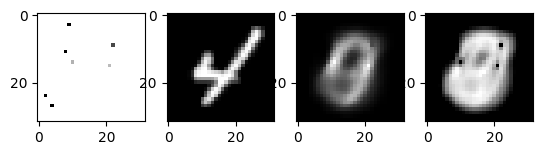

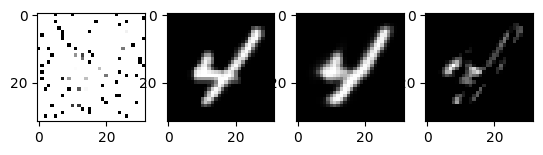

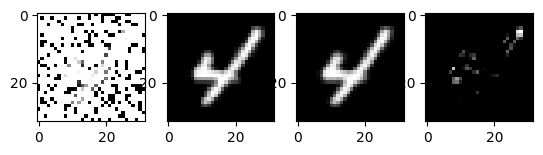

Loss at epoch 22: -1.2528350710868836
Loss at epoch 23: -1.255924916267395
Loss at epoch 23: -1.2427910289203186


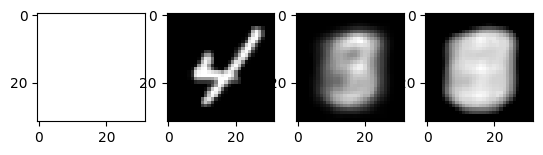

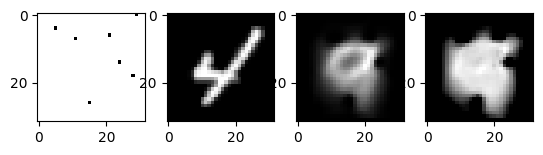

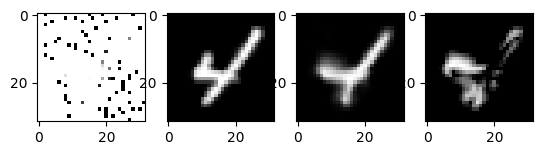

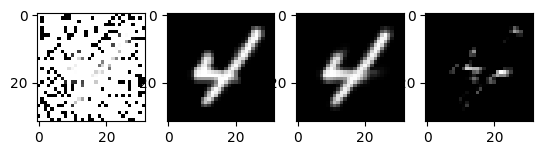

Loss at epoch 23: -1.2959223866462708
Loss at epoch 24: -1.289805519580841
Loss at epoch 24: -1.2480707814379008


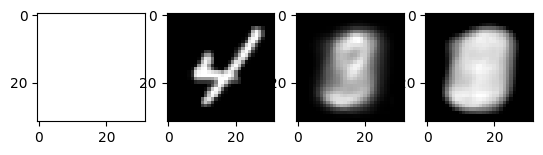

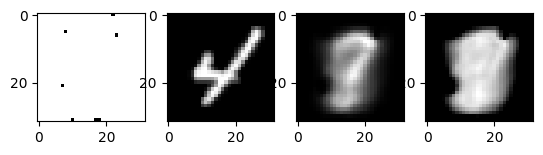

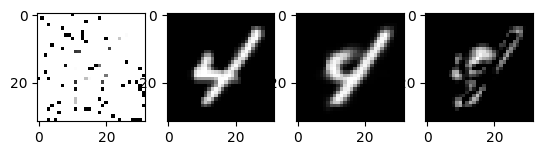

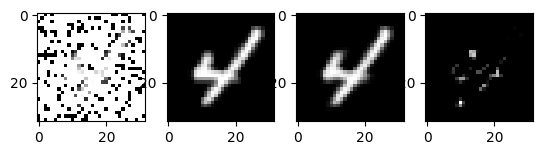

Loss at epoch 24: -1.22614628970623
Loss at epoch 25: -1.2421139121055602
Loss at epoch 25: -1.2397051156064705


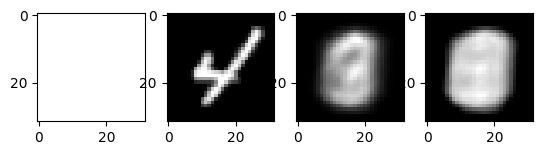

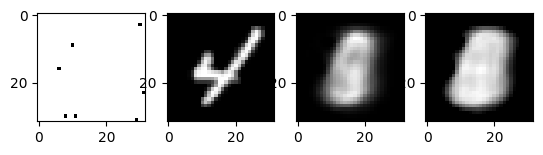

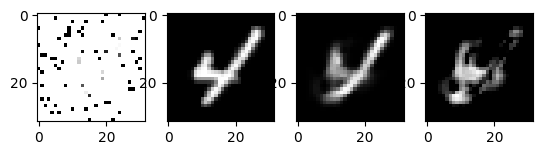

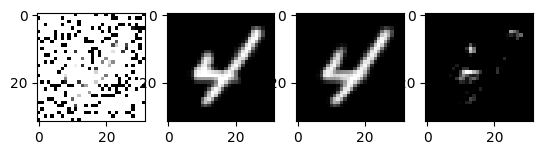

Loss at epoch 25: -1.256718510389328
Loss at epoch 26: -1.280158805847168
Loss at epoch 26: -1.2432602071801888


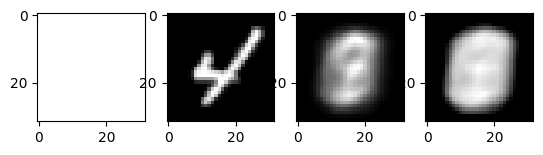

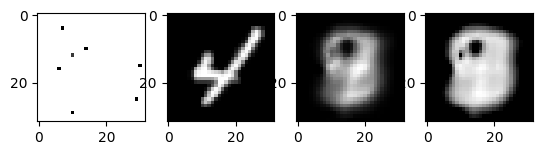

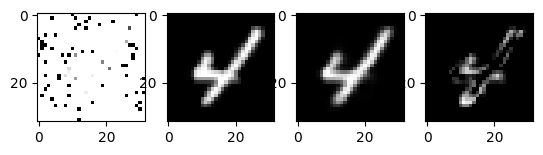

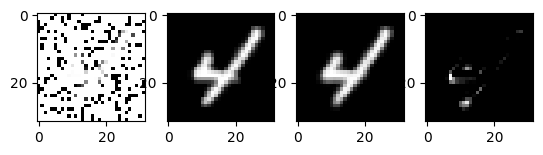

Loss at epoch 26: -1.2485125094652176
Loss at epoch 27: -1.318470585346222
Loss at epoch 27: -1.2513011815187065


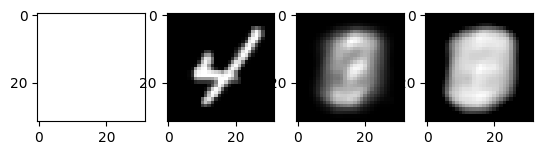

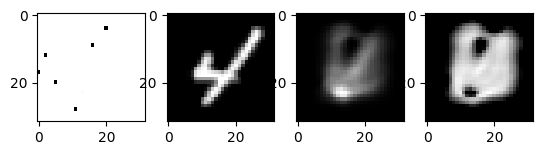

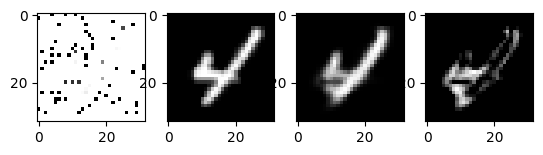

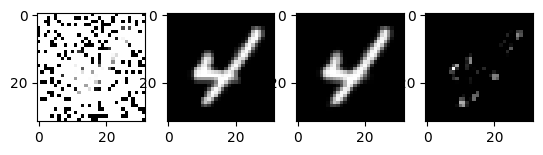

Loss at epoch 27: -1.2383196100592613
Loss at epoch 28: -1.2059858858585357
Loss at epoch 28: -1.2514686929927512


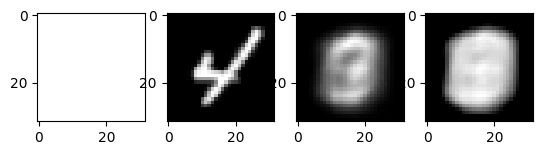

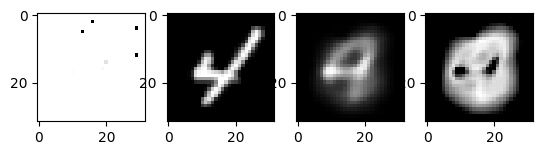

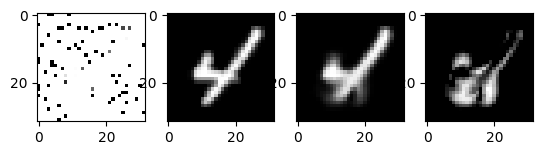

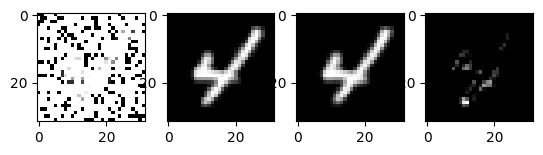

Loss at epoch 28: -1.295354361832142
Loss at epoch 29: -1.286941534280777
Loss at epoch 29: -1.248555048893874


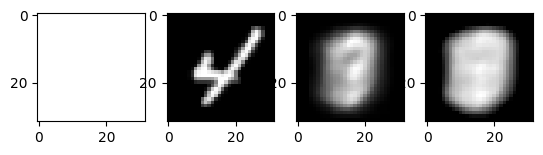

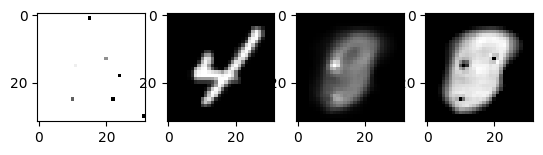

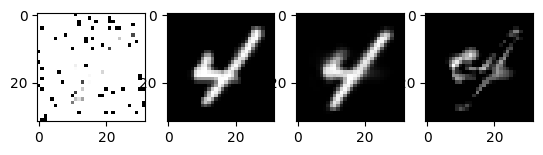

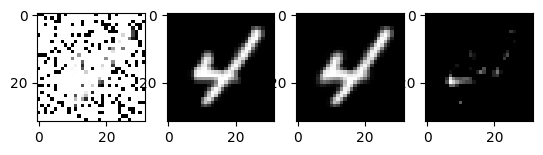

Loss at epoch 29: -1.2377266123890878
Loss at epoch 30: -1.3014497399330138
Loss at epoch 30: -1.2433039527769942


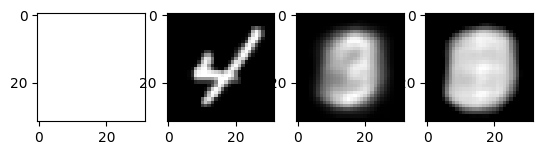

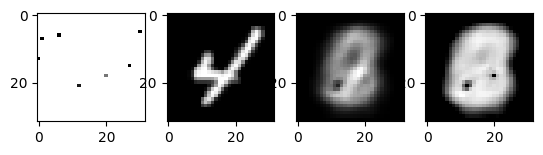

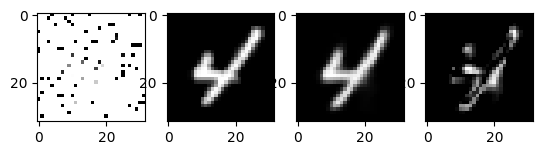

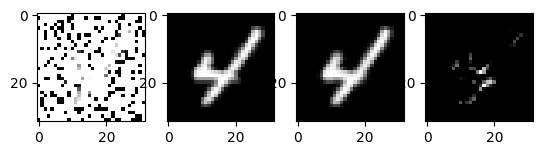

Loss at epoch 30: -1.2699506372213363
Loss at epoch 31: -1.1691365182399749
Loss at epoch 31: -1.2496396436516153


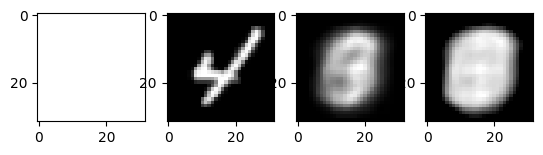

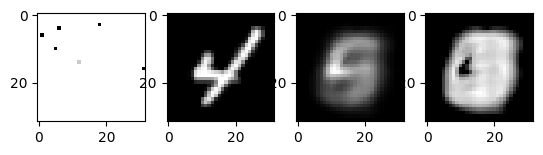

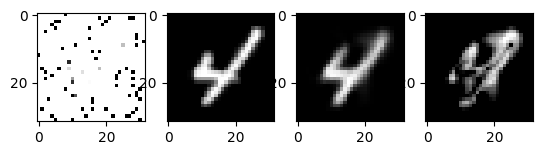

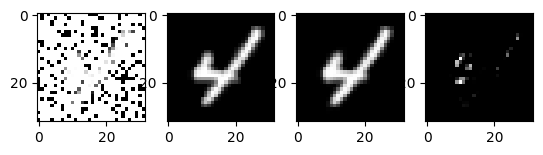

Loss at epoch 31: -1.242744591832161
Loss at epoch 32: -1.2089314699172973
Loss at epoch 32: -1.2542545684822148


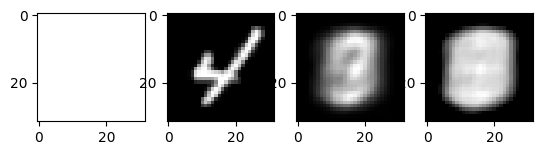

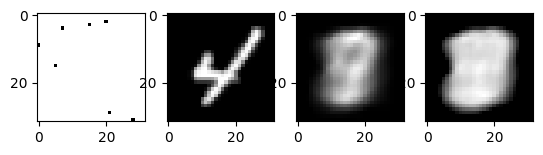

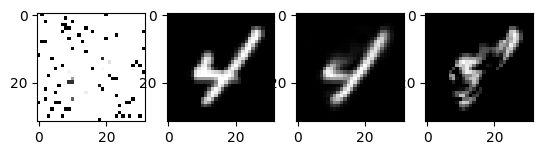

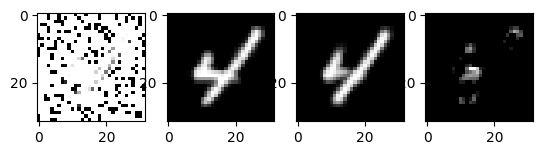

Loss at epoch 32: -1.2685904636979104
Loss at epoch 33: -1.3053358793258667
Loss at epoch 33: -1.2516187536232195


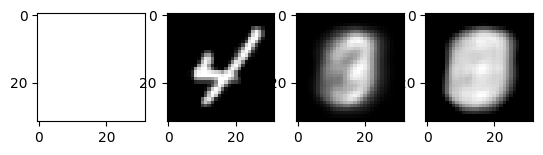

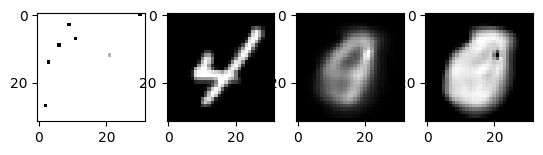

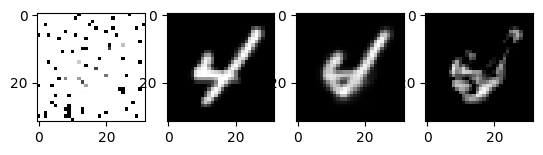

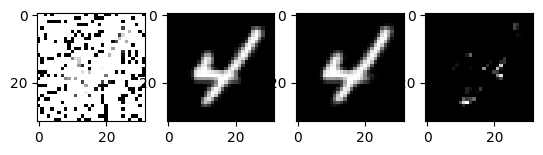

Loss at epoch 33: -1.2798641577363015
Loss at epoch 34: -1.2548621416091919
Loss at epoch 34: -1.2468285445179883


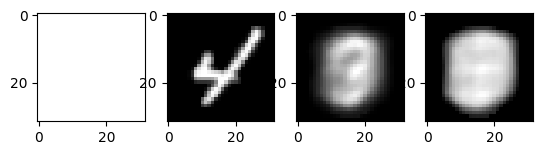

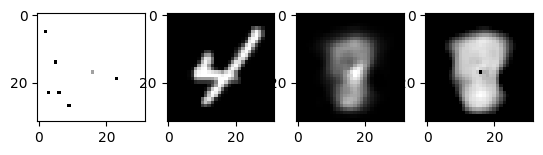

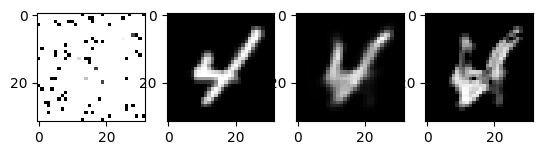

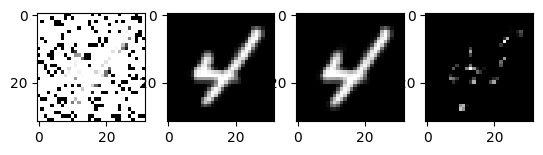

Loss at epoch 34: -1.2660665020346642
Loss at epoch 35: -1.2578084945678711
Loss at epoch 35: -1.257128698996988


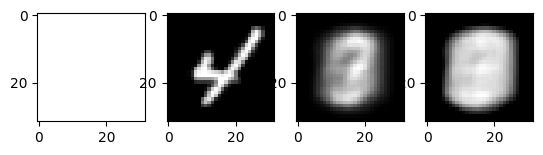

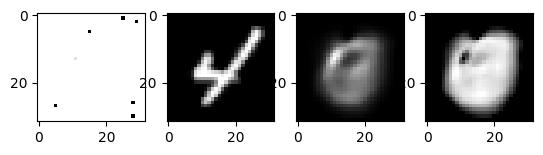

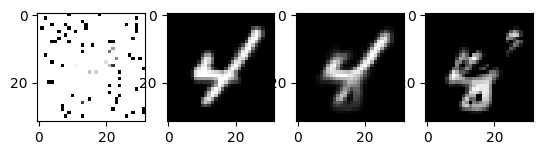

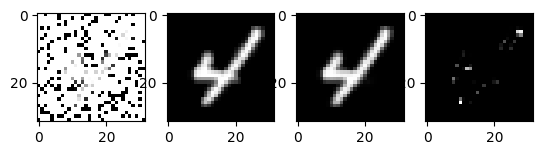

Loss at epoch 35: -1.2919719964265823
Loss at epoch 36: -1.25686217546463
Loss at epoch 36: -1.2511757629310414


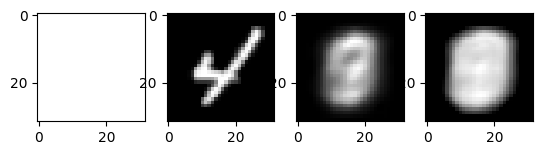

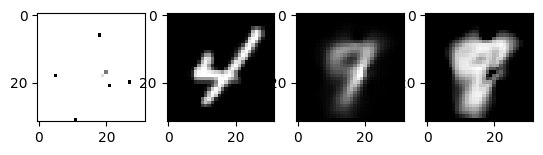

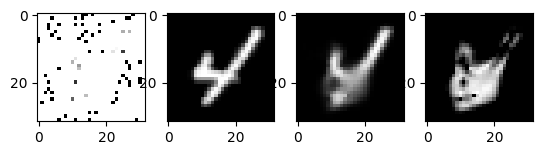

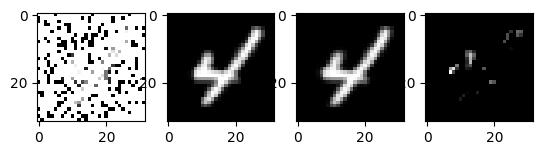

Loss at epoch 36: -1.2290019661188125
Loss at epoch 37: -1.2505987405776977
Loss at epoch 37: -1.2566119308894916


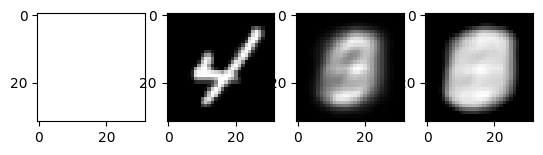

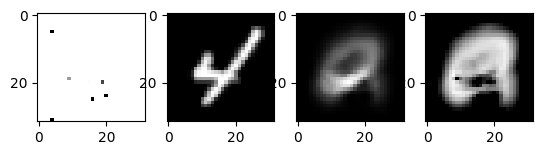

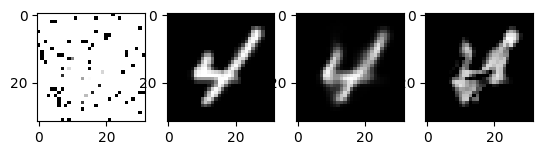

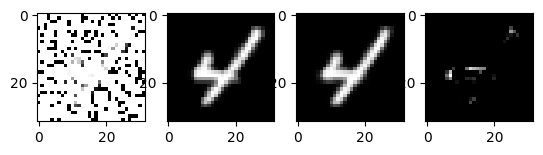

Loss at epoch 37: -1.2834401965141295
Loss at epoch 38: -1.3018563032150268
Loss at epoch 38: -1.2487003820666884


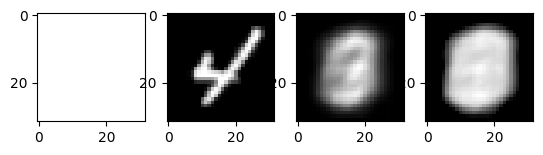

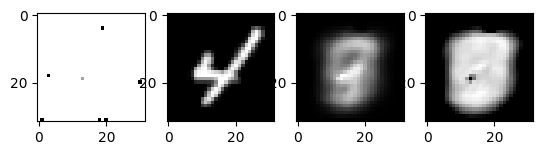

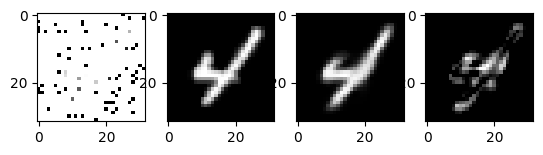

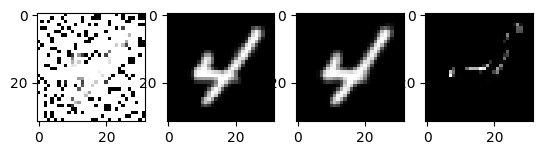

Loss at epoch 38: -1.2938566938042642
Loss at epoch 39: -1.2862751722335815
Loss at epoch 39: -1.2551037392220898


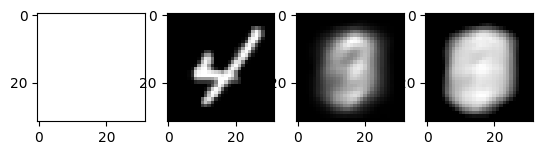

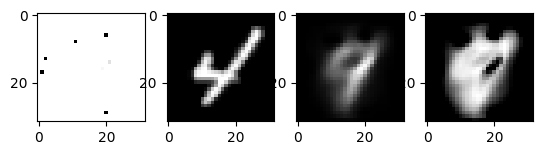

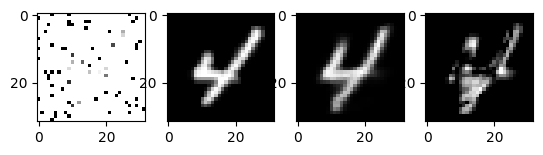

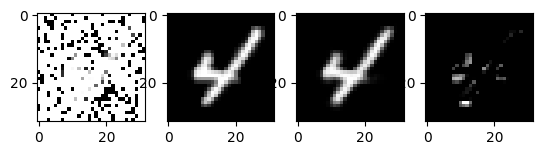

Loss at epoch 39: -1.2490358725190163
Loss at epoch 40: -1.2143281817436218
Loss at epoch 40: -1.2568100260474249


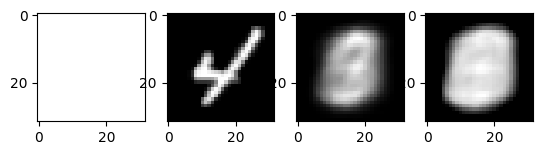

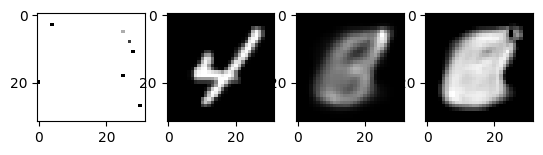

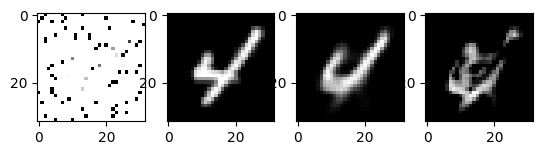

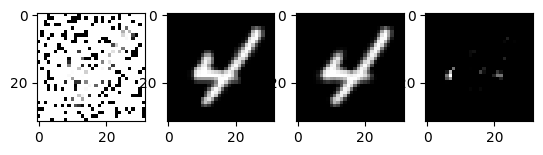

Loss at epoch 40: -1.2546919867396356
Loss at epoch 41: -1.307513380050659
Loss at epoch 41: -1.2471553926077827


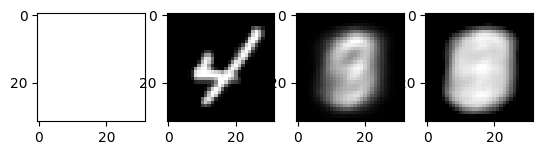

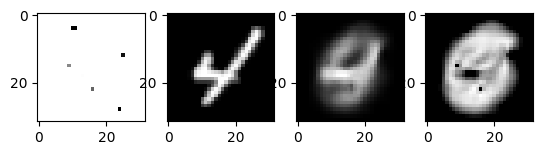

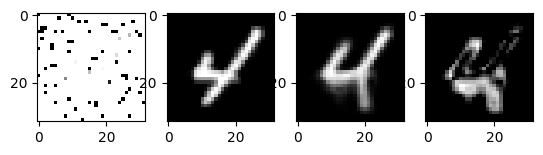

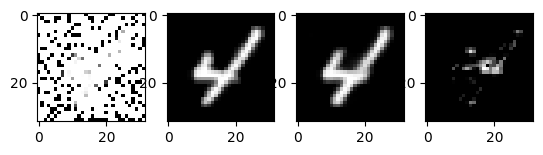

Loss at epoch 41: -1.2373598605394363
Loss at epoch 42: -1.2973977684974671
Loss at epoch 42: -1.252139466815215


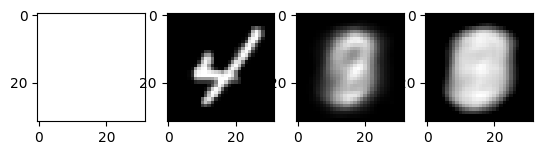

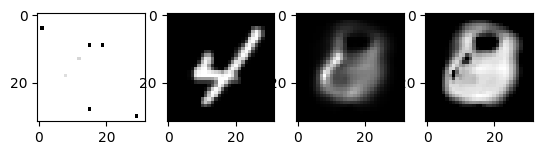

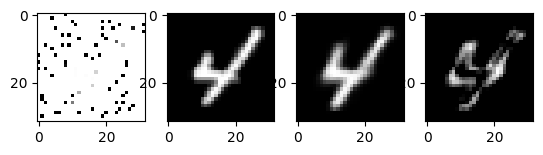

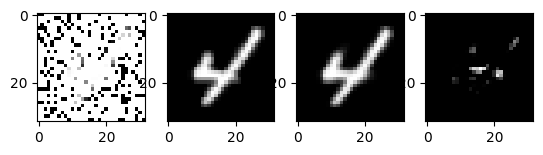

Loss at epoch 42: -1.2732608899474145
Loss at epoch 43: -1.331706666946411
Loss at epoch 43: -1.2575852361299888


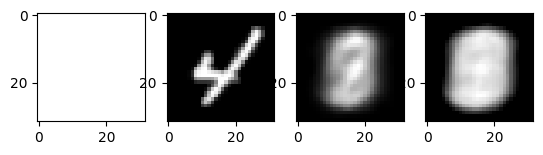

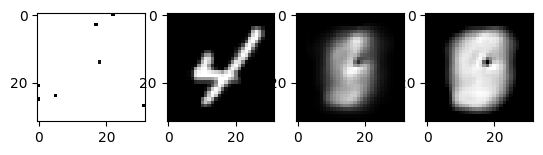

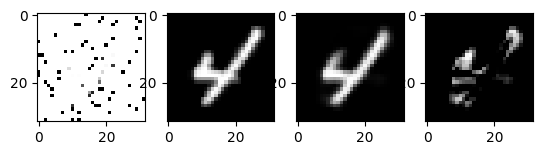

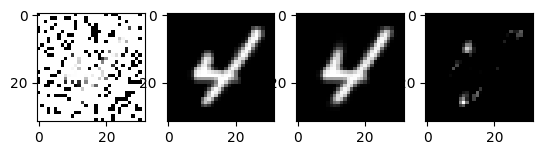

Loss at epoch 43: -1.2515593349933625
Loss at epoch 44: -1.2936995029449463
Loss at epoch 44: -1.2513230166371556


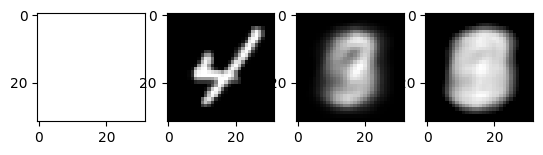

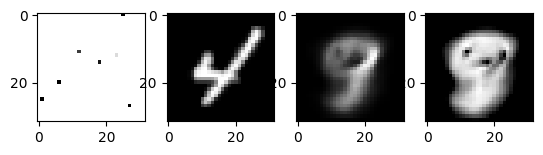

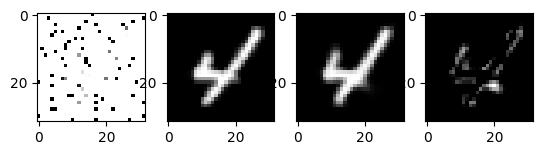

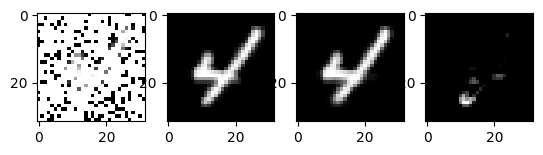

Loss at epoch 44: -1.2687694221735
Loss at epoch 45: -1.2910216331481934
Loss at epoch 45: -1.263733851823398


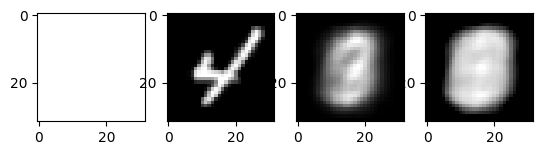

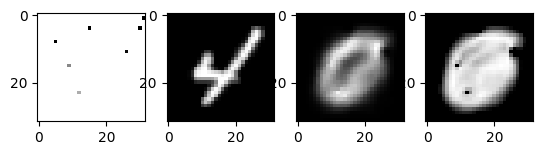

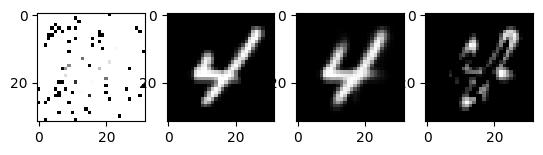

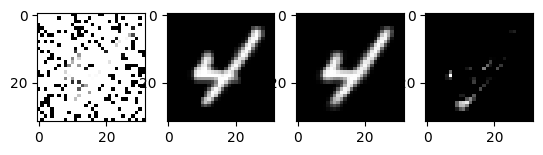

Loss at epoch 45: -1.2976210221648217
Loss at epoch 46: -1.311434841156006
Loss at epoch 46: -1.260974954168997


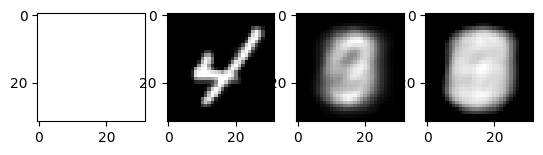

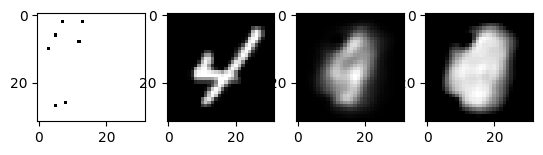

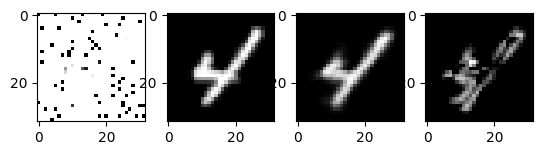

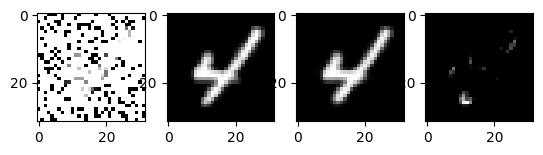

Loss at epoch 46: -1.2564717143774033
Loss at epoch 47: -1.325594437122345
Loss at epoch 47: -1.2564985221070453


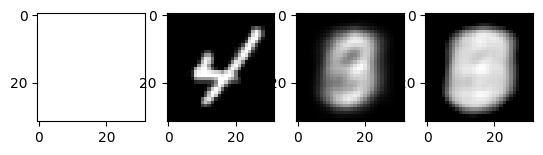

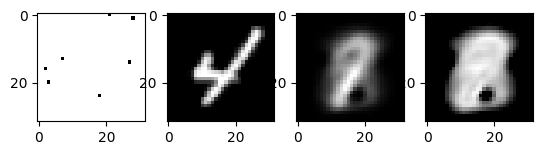

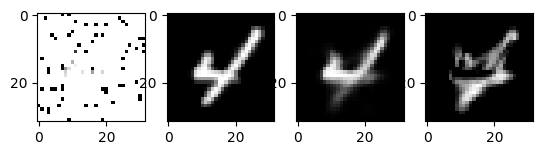

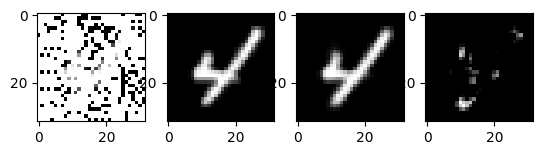

Loss at epoch 47: -1.2632651835680009


KeyboardInterrupt: 

In [ ]:
num_epochs = 50
n_context_low = 0
n_context_high = len(coords) // 2
best_val_loss = 100
patience_count = 0

for epoch in range(num_epochs):
    running_loss = 0
    for (imgs, labs) in mnist_trainloader:

        n_context = torch.randint(low=n_context_low, high=n_context_high, size=(1,)).item()
        xs = coords[torch.randperm(coords.shape[0])[:n_context],:]
        imgs = imgs.to(device)
        y_t = imgs.permute(0,2,3,1)

        optimiser.zero_grad()
        mu_t, sigma_t = model(imgs, xs)
        loss = - torch.distributions.normal.Normal(mu_t, sigma_t).log_prob(value=y_t).mean()
        running_loss += loss.item()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), clip_value)
        optimiser.step()

    sched.step()
    if epoch % 1 == 0:
      running_val_loss = 0
      for (imgs, labs) in mnist_valloader:
          n_context = torch.randint(low=len(coords)//100, high=len(coords)//2, size=(1,)).item()
          xs = coords[torch.randperm(coords.shape[0])[:n_context],:]
          imgs = imgs.to(device)
          y_t = imgs.permute(0,2,3,1)
          mu_t, sigma_t = model(imgs, xs)
          loss = - torch.distributions.normal.Normal(mu_t, sigma_t).log_prob(value=y_t).mean()
          running_val_loss += loss.item()
      print(f"Loss at epoch {epoch}:", running_val_loss/len(mnist_valloader))

    if epoch % 1 == 0:
        print(f"Loss at epoch {epoch}:", running_loss/len(mnist_trainloader))
        plot_mnist_data_range(imgs, model, [0, 7, 70, 210])

    if running_val_loss < best_val_loss:
      PATH = f"/content/gdrive/My Drive/neural_processes/models/mnistconv/epoch_{epoch}.pt"
      torch.save(model.state_dict(), PATH)
      best_val_loss = running_val_loss

    running_val_loss = 0
    for (imgs, labs) in mnist_testloader:
        n_context = torch.randint(low=len(coords)//100, high=len(coords)//2, size=(1,)).item()
        xs = coords[torch.randperm(coords.shape[0])[:n_context],:]
        imgs = imgs.to(device)
        y_t = imgs.permute(0,2,3,1)
        mu_t, sigma_t = model(imgs, xs)
        loss = - torch.distributions.normal.Normal(mu_t, sigma_t).log_prob(value=y_t).mean()
        running_val_loss += loss.item()
    print(f"Loss at epoch {epoch}:", running_val_loss/len(mnist_testloader))

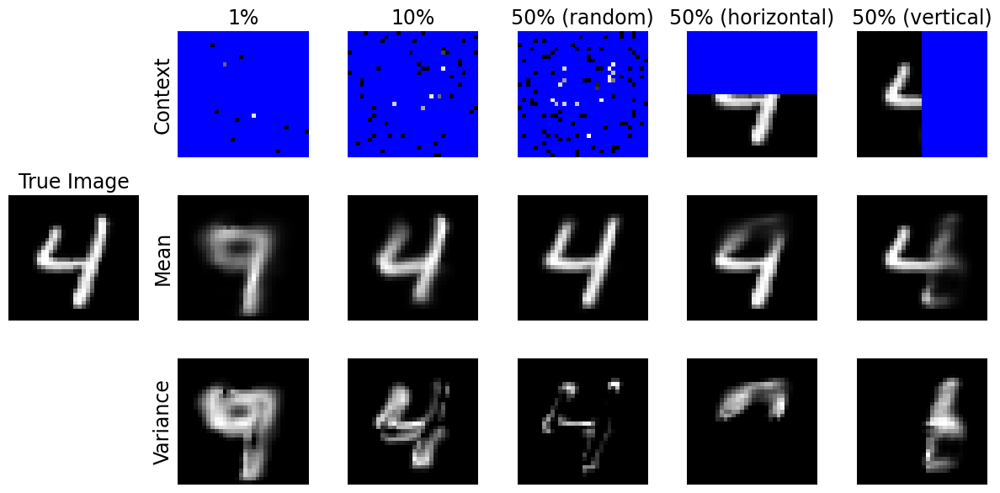

In [ ]:
fig, axs = plt.subplots(nrows=3,ncols=6, figsize=(15,7))

img_num = 15
for i, c in enumerate([len(coords)//100, len(coords)//20, len(coords)//10]):
  xs = coords[torch.randperm(coords.shape[0])[:c],:]
  x1s, x2s = xs[:,0], xs[:,1]
  imgs = imgs.to(device)
  mu_t, sigma_t = model(imgs, xs)
  background = torch.zeros((32,32, 3))
  background[:,:,-1] = 255
  imgs=imgs.to("cpu")
  background[x1s, x2s, :] = imgs[img_num,:,x1s, x2s].transpose(0,1)
  axs[0][i+1].imshow(background, cmap="gray", aspect = "auto")
  axs[1][i+1].imshow(mu_t.cpu().detach().view(imgs.shape[0], 32,32, 1)[img_num,:,:,:], cmap="gray", aspect = "auto")
  axs[2][i+1].imshow(sigma_t.cpu().detach().view(imgs.shape[0], 32,32, 1)[img_num,:,:,:]**2, cmap="gray", aspect = "auto")

coords = torch.tensor([(x1, x2) for x1 in range(32) for x2 in range(32)])
xs = torch.tensor([(x,y) for (x,y) in coords if x >=16])
x1s, x2s = xs[:,0], xs[:,1]
imgs = imgs.to(device)
mu_t, sigma_t = model(imgs, xs)
background = torch.zeros((32,32, 3))
background[:,:,-1] = 255
background[x1s, x2s, :] = imgs[img_num,:,x1s, x2s].to("cpu").transpose(0,1)
axs[0][4].imshow(background, cmap="gray", aspect = "auto")
axs[1][4].imshow(mu_t.cpu().detach().view(imgs.shape[0], 32,32, 1)[img_num,:,:,:], cmap="gray", aspect = "auto")
axs[2][4].imshow(sigma_t.cpu().detach().view(imgs.shape[0], 32,32, 1)[img_num,:,:,:]**2, cmap="gray", aspect = "auto")

coords = torch.tensor([(x1, x2) for x1 in range(32) for x2 in range(32)])
xs = torch.tensor([(x,y) for (x,y) in coords if y <=15])
x1s, x2s = xs[:,0], xs[:,1]
imgs = imgs.to(device)
mu_t, sigma_t = model(imgs, xs)
background = torch.zeros((32,32, 3))
background[:,:,-1] = 255
background[x1s, x2s, :] = imgs[img_num,:,x1s, x2s].to("cpu").transpose(0,1)
axs[0][5].imshow(background, cmap="gray", aspect = "auto")
axs[1][5].imshow(mu_t.cpu().detach().view(imgs.shape[0], 32,32, 1)[img_num,:,:,:], cmap="gray", aspect = "auto")
axs[2][5].imshow(sigma_t.cpu().detach().view(imgs.shape[0], 32,32, 1)[img_num,:,:,:]**2, cmap="gray", aspect = "auto")

for i in range(3):
  for j in range(6):
    axs[i][j].get_xaxis().set_ticks([])
    axs[i][j].get_yaxis().set_ticks([])
    axs[i][j].spines['left'].set_visible(False)
    axs[i][j].spines['right'].set_visible(False)
    axs[i][j].spines['top'].set_visible(False)
    axs[i][j].spines['bottom'].set_visible(False)

f = 17
axs[0][1].set_ylabel("Context", fontsize=f)
axs[1][1].set_ylabel("Mean", fontsize=f)
axs[2][1].set_ylabel("Variance", fontsize=f)

axs[0][1].set_title("1%", fontsize=f)
axs[0][2].set_title("10%", fontsize=f)
axs[0][3].set_title("50% (random)", fontsize=f)
axs[0][4].set_title("50% (horizontal)", fontsize=f)
axs[0][5].set_title("50% (vertical)", fontsize=f)

axs[1][0].imshow(imgs.to("cpu")[img_num,:,:,:].permute(1,2,0), cmap="gray", aspect="auto")
axs[1][0].set_title("True Image", fontsize=f)

plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.show()

IndexError: index 30 is out of bounds for dimension 0 with size 28

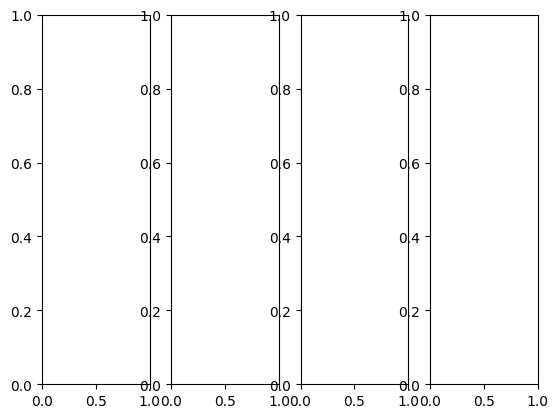

In [ ]:
n_context = 200
xs = coords[torch.randperm(coords.shape[0])[:n_context],:]
imgs = imgs.to(device)
y_t = imgs.permute(0,2,3,1)

mu_t, sigma_t = model(imgs, xs)
loss = - torch.distributions.normal.Normal(mu_t, sigma_t).log_prob(value=y_t).mean()
running_loss += loss.item()
plot_mnist_data(imgs[-9:,:,:,:], xs[:,0], xs[:,1], mu_t[-9:,:,:,:], sigma_t[-9:,:,:,:])

### ZSMM

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
COLOUR_BLACK = torch.tensor([0.0, 0.0, 0.0])
COLOUR_WHITE = torch.tensor([1.0, 1.0, 1.0])
COLOUR_BLUE = torch.tensor([0.0, 0.0, 1.0])

In [ ]:
class ZeroShotMultiMNIST(torch.utils.data.Dataset):
    """ZeroShotMultiMNIST dataset. The test set consists of multiple digits (by default 2).
    The training set consists of mnist digits with added black borders such that the image
    size is the same as in the test set, but the digits are of the same scale.

    Parameters
    ----------
    root : string
        Root directory of dataset.

    split : {'train', 'test'}, optional
        According dataset is selected.

    n_test_digits : int, optional
        Number of digits per test image.

    final_size : int, optional
        Final size of the images (square of that shape). If `None` uses `n_test_digits*2`.

    seed : int, optional

    logger : logging.Logger

    kwargs:
        Additional arguments to the dataset data generation process `make_multi_mnist_*`.
    """

    missing_px_color = COLOUR_BLUE
    n_classes = 0
    shape = (1, 56, 56)
    files = {"train": "train", "test": "test"}
    name = "ZeroShotMultiMNIST"

    def __init__(
        self,
        root="zsmm",
        split="train",
        n_test_digits=2,
        final_size=None,
        seed=123,
        translation=0,
        **kwargs
    ):
        self.translation = translation
        self.split = split

        if split == "train":
            if self.translation:
                transforms_list = [
                    transforms.ToPILImage(),
                    transforms.RandomCrop(
                        (self.shape[1], self.shape[2]), padding=self.translation
                    ),
                    transforms.ToTensor(),
                ]
            else:
                transforms_list = [transforms.ToPILImage(), transforms.ToTensor()]
        elif split == "test":
            transforms_list = [transforms.ToPILImage(), transforms.ToTensor()]
        else:
            raise ValueError("Unkown `split = {}`".format(split))

        self.dir = os.path.join(root, self.name)
        self.transforms = transforms.Compose(transforms_list)
        self.n_test_digits = n_test_digits
        self.seed = seed
        self.final_size = final_size
        self._init_size = 28

        saved_data = os.path.join(
            self.dir,
            "{}_seed{}_digits{}.pt".format(self.files[split], seed, n_test_digits),
        )

        try:
            self.data = torch.load(saved_data)
        except FileNotFoundError:
            if not os.path.exists(self.dir):
                os.mkdir(self.dir)
            mnist = torchvision.datasets.MNIST(root=root, train=split == "train", download=True)
            if split == "train":
                self.data = self.make_multi_mnist_train(mnist.data, **kwargs)
            elif split == "test":
                self.data = self.make_multi_mnist_test(mnist.data, **kwargs)
            torch.save(self.data, saved_data)

        self.data = self.data.float() / 255
        if self.final_size is not None:
            self.data = torch.nn.functional.interpolate(
                self.data.unsqueeze(1).float(),
                size=self.final_size,
                mode="bilinear",
                align_corners=True,
            ).squeeze(1)

    def __len__(self):
        return self.data.size(0)

    def make_multi_mnist_train(self, train_dataset):
        """Train set of multi mnist by taking mnist and adding borders to be the correct scale."""
        #set_seed(self.seed)
        fin_img_size = self._init_size * self.n_test_digits
        init_img_size = train_dataset.shape[1:]
        background = np.zeros(
            (train_dataset.size(0), fin_img_size, fin_img_size)
        ).astype(np.uint8)
        borders = (np.array((fin_img_size, fin_img_size)) - init_img_size) // 2
        background[
            :, borders[0] : -borders[0], borders[1] : -borders[1]
        ] = train_dataset
        return torch.from_numpy(background)

    def make_multi_mnist_test(
        self, test_dataset, varying_axis=None, n_test_digits=None
    ):
        """
        Test set of multi mnist by concatenating moving digits around `varying_axis`
        (both axis if `None`) and concatenating them over the other. `n_test_digits` is th enumber
        of digits per test image (default `self.n_test_digits`).
        """
        #set_seed(self.seed)

        n_test = test_dataset.size(0)

        if n_test_digits is None:
            n_test_digits = self.n_test_digits

        if varying_axis is None:
            out_axis0 = self.make_multi_mnist_test(
                test_dataset[: n_test // 2], varying_axis=0, n_test_digits=n_test_digits
            )
            out_axis1 = self.make_multi_mnist_test(
                test_dataset[: n_test // 2], varying_axis=1, n_test_digits=n_test_digits
            )
            return torch.cat((out_axis0, out_axis1), dim=0)[torch.randperm(n_test)]

        fin_img_size = self._init_size * self.n_test_digits
        n_tmp = self.n_test_digits * n_test
        init_img_size = test_dataset.shape[1:]

        tmp_img_size = list(test_dataset.shape[1:])
        tmp_img_size[varying_axis] = fin_img_size
        tmp_background = torch.from_numpy(
            np.zeros((n_tmp, *tmp_img_size)).astype(np.uint8)
        )

        max_shift = fin_img_size - init_img_size[varying_axis]
        shifts = np.random.randint(max_shift, size=n_test_digits * n_test)

        test_dataset = test_dataset.repeat(self.n_test_digits, 1, 1)[
            torch.randperm(n_tmp)
        ]

        for i, shift in enumerate(shifts):
            slices = [slice(None), slice(None)]
            slices[varying_axis] = slice(shift, shift + self._init_size)
            tmp_background[i, slices[0], slices[1]] = test_dataset[i, ...]

        out = torch.cat(tmp_background.split(n_test, 0), dim=1 + 1 - varying_axis)
        return out

    def __getitem__(self, idx):
        """Get the image of `idx`

        Return
        ------
        sample : torch.Tensor
            Tensor in [0.,1.] of shape `shape`.

        placeholder :
            Placeholder value as their are no targets.
        """
        # put each pixel in [0.,1.] and reshape to (C x H x W)
        img = self.transforms(self.data[idx]).float()

        # no label so return 0 (note that can't return None because)
        # dataloaders requires so
        return img, 0


In [ ]:
class ZeroShotMultiMNISTtrnslt(ZeroShotMultiMNIST):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, translation=14, **kwargs)


class ZeroShotMultiMNISTscale(ZeroShotMultiMNIST):
    name = "ZeroShotMultiMNISTscale"
    shape = (1, 32, 32)
    shape_test = (1, 56, 56)

    def __init__(self, *args, **kwargs):
        super().__init__(*args, translation=5, **kwargs)

        if self.split == "test":
            self.shape = self.shape_test

    def make_multi_mnist_train(self, train_dataset):
        """Train set of multi mnist by taking mnist and adding borders to be the correct scale."""
        return train_dataset

In [ ]:
class ZeroShotMNIST(ZeroShotMultiMNIST):
    """ZeroShotMNIST dataset. The test set consists of a single translated digit in a larger canvas.
    The training set consists of mnist digits with added black borders such that the image
    size is the same as in the test set, but the digits are of the same scale.

    Parameters
    ----------
    root : string
        Root directory of dataset.

    transforms_list : list
        List of `torch.vision.transforms` to apply to the data when loading it.

    split : {'train', 'test'}, optional
        According dataset is selected.

    final_size : int, optional
        Final size of the images (square of that shape). If `None` uses `n_test_digits*2`.

    seed : int, optional

    logger : logging.Logger

    kwargs:
        Additional arguments to the dataset data generation process `make_multi_mnist_*`.
    """

    missing_px_color = COLOUR_BLUE
    n_classes = 0
    shape = (1, 56, 56)
    files = {"train": "train", "test": "test"}
    name = "ZeroShotMNIST"

    def make_multi_mnist_test(
        self, test_dataset, varying_axis=None, n_test_digits=None
    ):
        """
        Like multi mnist but only shows a single digit.
        """
        return super().make_multi_mnist_test(
            test_dataset, varying_axis=varying_axis, n_test_digits=1
        )

In [ ]:
DATASETS_DICT = {
    "mnist": "MNIST",
    "svhn": "SVHN",
    "celeba32": "CelebA32",
    "celeba64": "CelebA64",
    "zs-multi-mnist": "ZeroShotMultiMNIST",
    "zsmm": "ZeroShotMultiMNIST",  # shorthand
    "zsmmt": "ZeroShotMultiMNISTtrnslt",
    "zsmms": "ZeroShotMultiMNISTscale",
    "zs-mnist": "ZeroShotMNIST",
    "celeba": "CelebA",
    "celeba128": "CelebA128",
}

def get_train_test_img_dataset(dataset):
    """Return the correct instantiated train and test datasets."""
    try:
        train_dataset = get_dataset(dataset)(split="train")
        test_dataset = get_dataset(dataset)(split="test")
    except TypeError as e:
        train_dataset, test_dataset = train_dev_split(
            get_dataset(dataset)(), dev_size=0.1, is_stratify=False
        )

    return train_dataset, test_dataset


def get_dataset(dataset):
    """Return the correct uninstantiated datasets."""
    dataset = dataset.lower()
    try:
        # eval because stores name as string in order to put it at top of file
        return eval(DATASETS_DICT[dataset])
    except KeyError:
        raise ValueError("Unkown dataset: {}".format(dataset))


def get_img_size(dataset):
    """Return the correct image size."""
    return get_dataset(dataset).shape


def get_test_upscale_factor(dataset):
    """Return the correct image size."""
    try:
        dataset = get_dataset(dataset)
        return dataset.shape_test[-1] / dataset.shape[-1]
    except (AttributeError, ValueError):
        return 1

In [ ]:
datasets_zsmm = dict()
os.mkdir("zsmm")
datasets_zsmm["ZSMM Train"], datasets_zsmm["ZSMM Test"] = get_train_test_img_dataset("zsmms")

100%|██████████| 9912422/9912422 [00:00<00:00, 44171540.14it/s]


Extracting zsmm/MNIST/raw/train-images-idx3-ubyte.gz to zsmm/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 30013799.26it/s]


Extracting zsmm/MNIST/raw/train-labels-idx1-ubyte.gz to zsmm/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 86496215.38it/s]

Extracting zsmm/MNIST/raw/t10k-images-idx3-ubyte.gz to zsmm/MNIST/raw




100%|██████████| 4542/4542 [00:00<00:00, 5679942.98it/s]


Extracting zsmm/MNIST/raw/t10k-labels-idx1-ubyte.gz to zsmm/MNIST/raw



In [ ]:
batch_size = 16
train_subset, val_subset = torch.utils.data.random_split(
        datasets_zsmm["ZSMM Train"], [57500, 2500], generator=torch.Generator().manual_seed(1))
mnist_trainloader = torch.utils.data.DataLoader(dataset=train_subset, shuffle=True, batch_size=batch_size)
mnist_valloader = torch.utils.data.DataLoader(dataset=val_subset, shuffle=False, batch_size=batch_size)
mnist_testloader = torch.utils.data.DataLoader(dataset=datasets_zsmm["ZSMM Test"], shuffle=False, batch_size=batch_size)
zsmm_iter = iter(mnist_testloader)

In [ ]:
def get_exponential_decay_gamma(scheduling_factor, max_epochs):
    return (1 / scheduling_factor) ** (1 / max_epochs)

In [ ]:
def plot_mnist_data(imgs, xs, mu_t, sigma_t, dims):
  x1s, x2s = xs[:,0], xs[:,1]
  fig, axs = plt.subplots(1, 4)
  imgs = imgs.to("cpu")
  background = torch.ones((dims,dims,3)).to(imgs.device)
  background[x1s, x2s, :] = imgs[0,:,x1s, x2s].transpose(0,1)
  axs[0].imshow(background)
  axs[1].imshow(imgs[0,:,:,:].permute(1, 2, 0), cmap="gray")
  axs[2].imshow(mu_t.cpu().detach()[0,:,:,:], cmap="gray")
  axs[3].imshow(sigma_t.cpu().detach()[0,:,:,:], cmap="gray")
  for ax in axs:
    ax.set_axis_off()
  plt.show()

def plot_mnist_data_range(imgs, model, ns, dims):
  coords = torch.tensor([(x1, x2) for x1 in range(dims) for x2 in range(dims)])
  for n in ns:
    xs = coords[torch.randperm(coords.shape[0])[:n],:]
    imgs = imgs.to(device)
    y_t = imgs.permute(0,2,3,1)
    mu_t, sigma_t = model(imgs, xs)
    plot_mnist_data(imgs, xs, mu_t, sigma_t, dims)

In [21]:
coords = torch.tensor([(x1, x2) for x1 in range(32) for x2 in range(32)])
model = GridConvCNP(1, 1, 128, 5, 128, 4, 0.1, coords)
optimiser = torch.optim.Adam(model.parameters(), lr=5e-5)
clip_value = 10
sched = torch.optim.lr_scheduler.ExponentialLR(optimiser, get_exponential_decay_gamma(10,50))
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
model = model.to(device)
sum(p.numel() for p in model.parameters())

339451

Loss at epoch 1: -0.8406752973958709


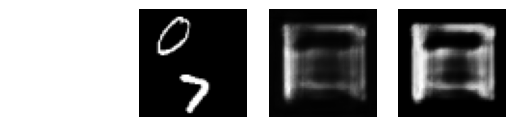

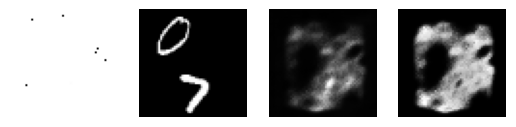

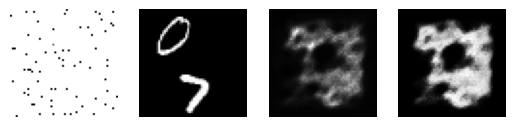

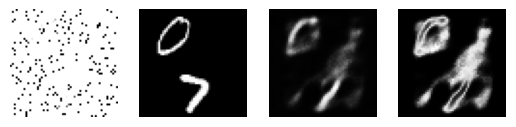

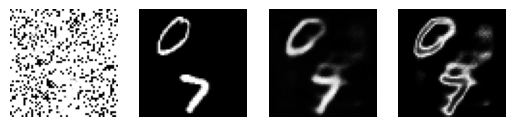

Val loss at epoch 1: -0.9966142363609023
Test loss at epoch 1: -0.5272931990429759
Loss at epoch 2: -1.019695295245865


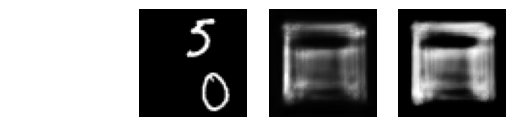

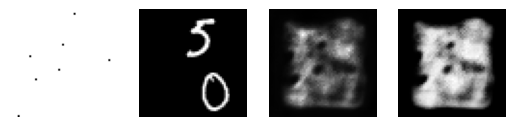

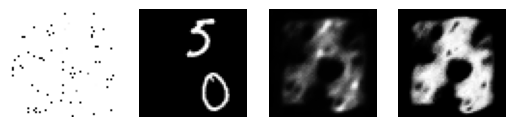

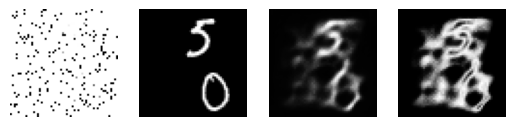

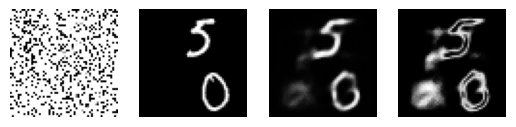

Val loss at epoch 2: -1.0457859472104698
Test loss at epoch 2: -0.5698866630077362
Loss at epoch 3: -1.046875972240649


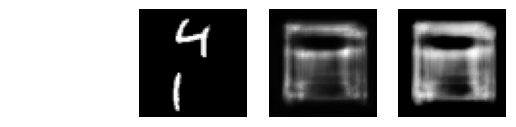

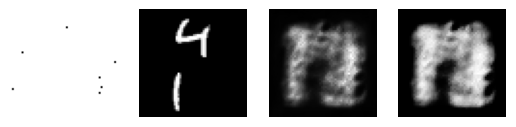

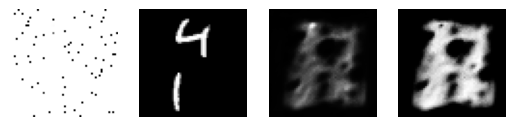

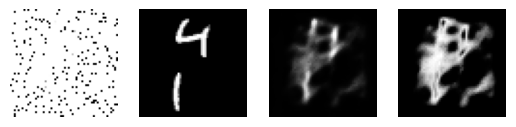

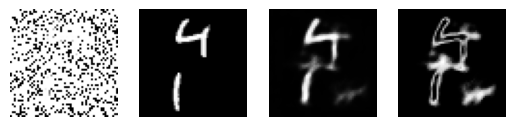

Val loss at epoch 3: -1.0660563737723479
Test loss at epoch 3: -0.583081667137146
Loss at epoch 4: -1.062062389340146


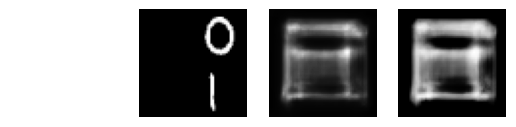

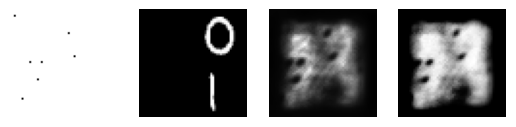

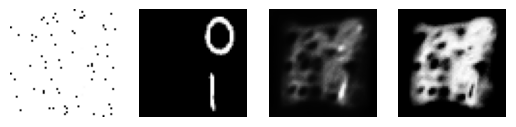

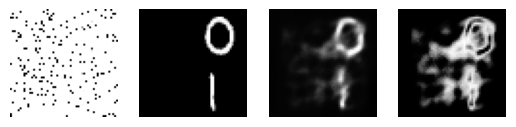

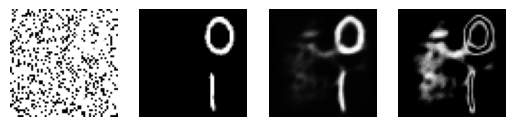

Val loss at epoch 4: -1.0848954088368994
Test loss at epoch 4: -0.5315815848112107
Loss at epoch 5: -1.0710644610951725


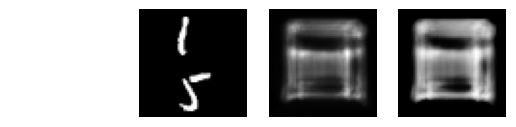

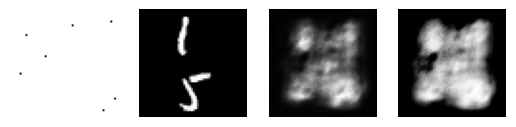

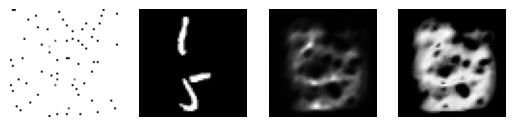

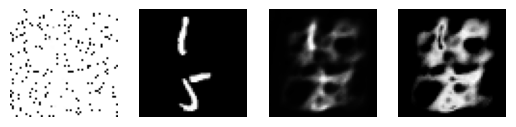

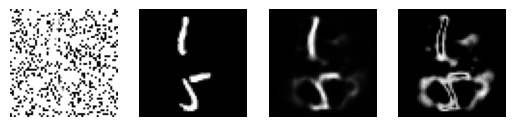

Val loss at epoch 5: -1.1013426765514787
Test loss at epoch 5: -0.5699260465621948
Loss at epoch 6: -1.0759265153115831


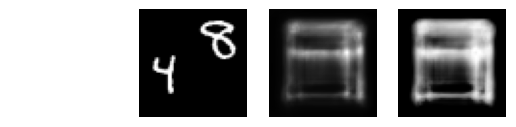

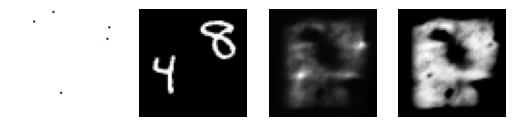

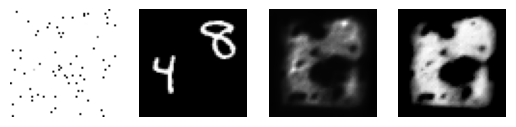

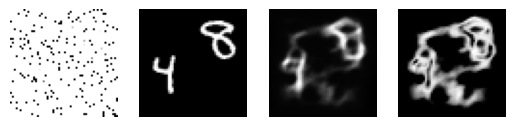

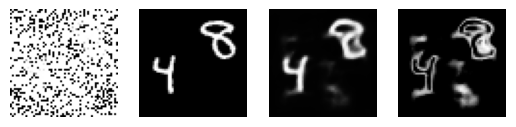

Val loss at epoch 6: -1.0753352680024069
Test loss at epoch 6: -0.537791289281845
Loss at epoch 7: -1.0851810573951097


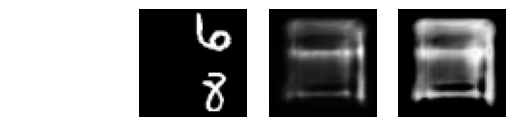

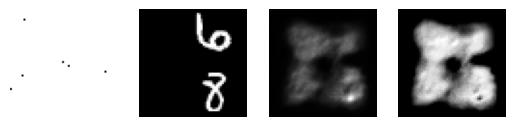

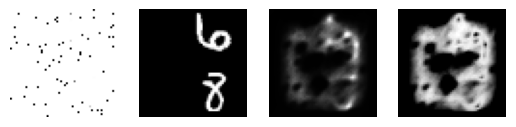

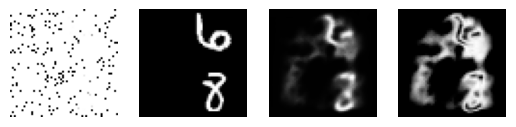

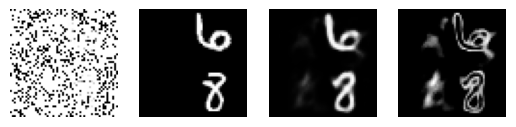

Val loss at epoch 7: -1.0973315398404553
Test loss at epoch 7: -0.564960085606575
Loss at epoch 8: -1.0889813907042303


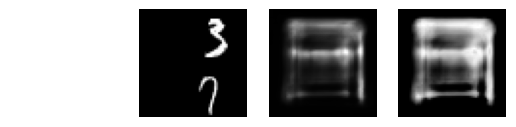

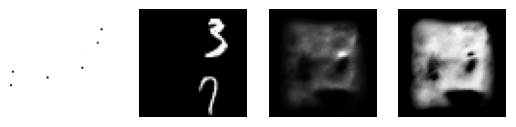

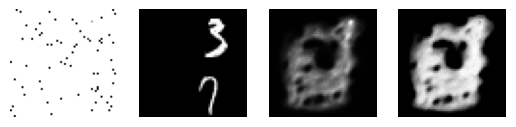

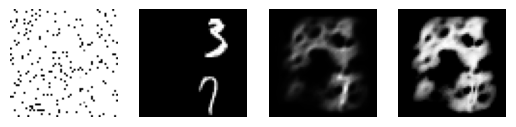

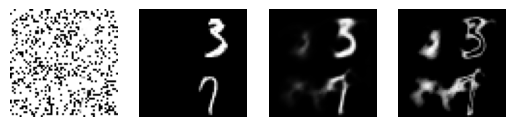

Val loss at epoch 8: -1.1234757619298947
Test loss at epoch 8: -0.5760563476324081
Loss at epoch 9: -1.0885448360781438


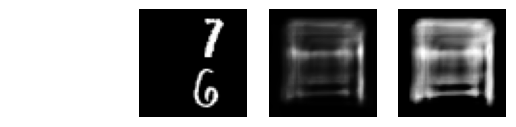

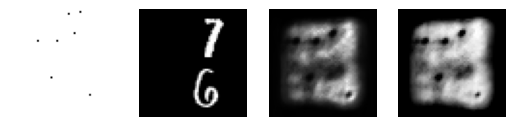

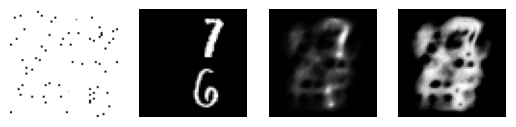

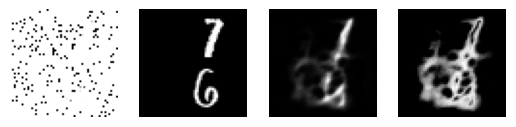

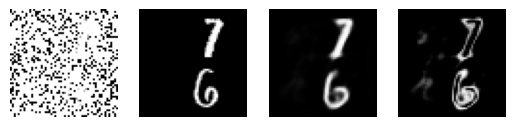

Val loss at epoch 9: -1.0966927581911634
Test loss at epoch 9: -0.5438487885475158
Loss at epoch 10: -1.0977574322760337


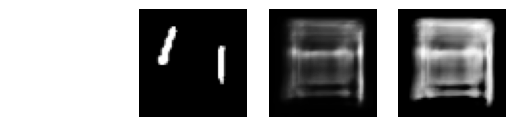

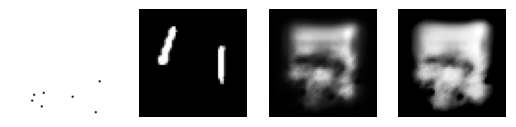

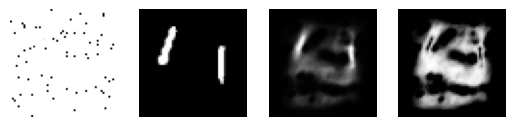

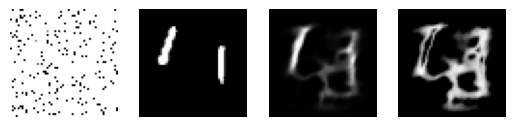

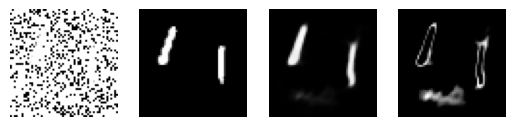

Val loss at epoch 10: -1.1135917996904652
Test loss at epoch 10: -0.5967499329090118
Loss at epoch 11: -1.100167873639429


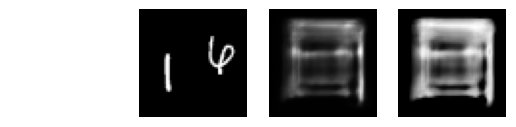

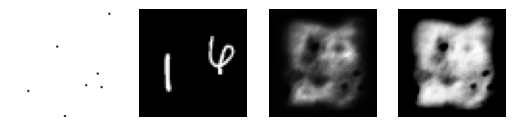

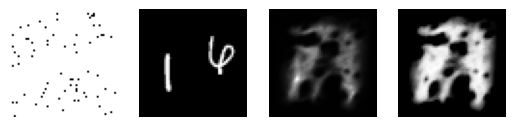

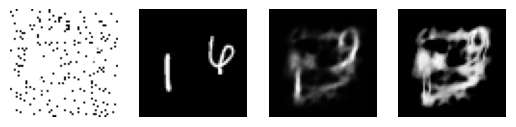

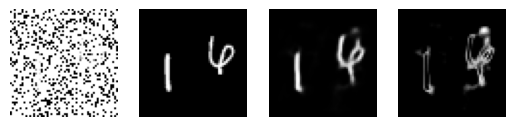

Val loss at epoch 11: -1.109847910464949
Test loss at epoch 11: -0.5324745687961578
Loss at epoch 12: -1.104133541459963


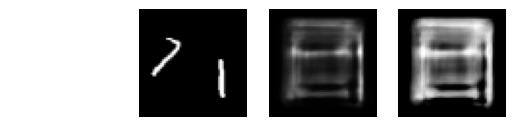

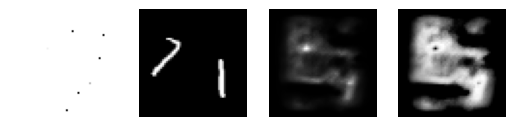

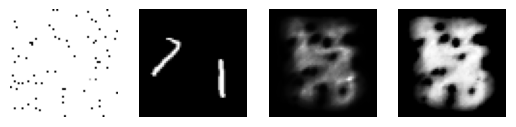

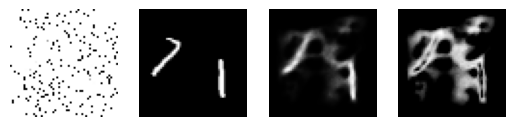

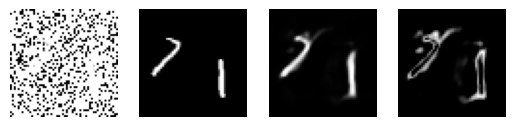

Val loss at epoch 12: -1.11856274657948
Test loss at epoch 12: -0.6000042193412781
Loss at epoch 13: -1.1040649581897504


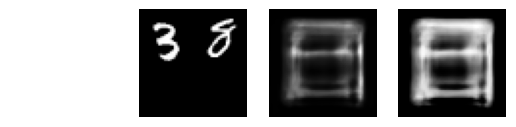

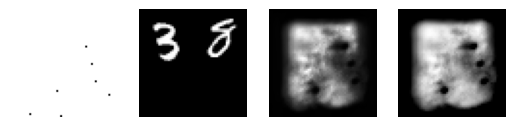

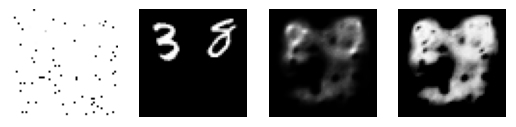

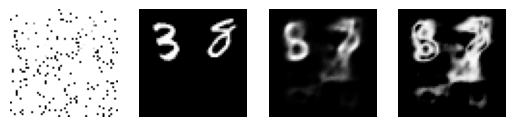

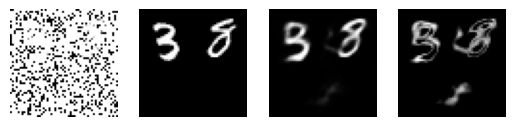

Val loss at epoch 13: -1.1137270608525367
Test loss at epoch 13: -0.5597588557720184
Loss at epoch 14: -1.1108806254088248


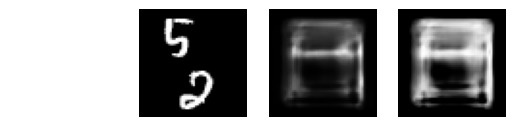

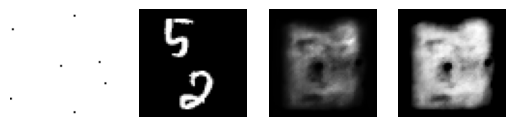

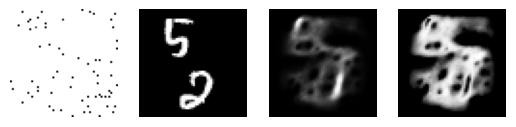

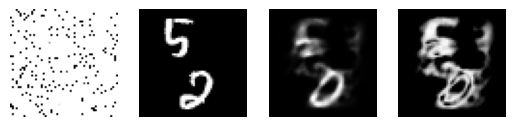

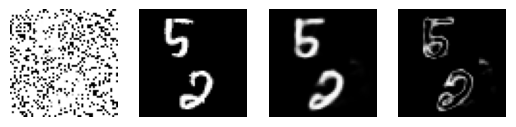

Val loss at epoch 14: -1.122998880732591
Test loss at epoch 14: -0.5466141793251038
Loss at epoch 15: -1.1107486618032838


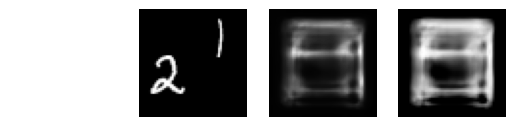

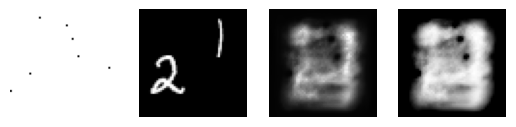

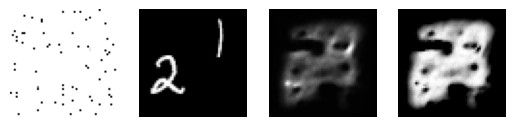

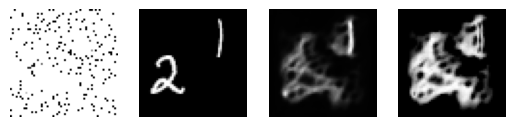

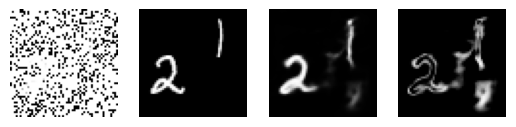

Val loss at epoch 15: -1.1326786332828984
Test loss at epoch 15: -0.5238567292928695
Loss at epoch 16: -1.1099540020236056


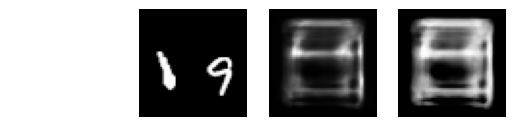

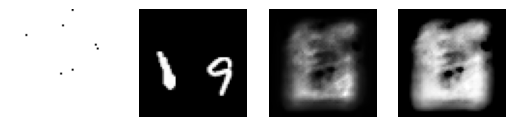

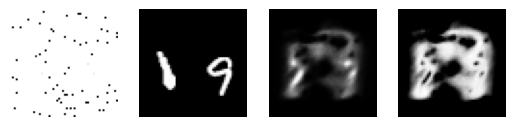

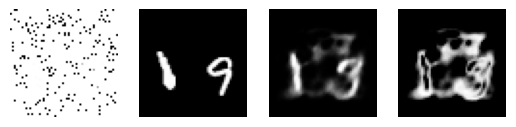

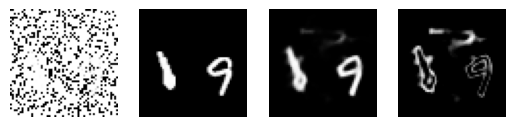

Val loss at epoch 16: -1.1256861569015844
Test loss at epoch 16: -0.5577205566883087
Loss at epoch 17: -1.1104658640087746


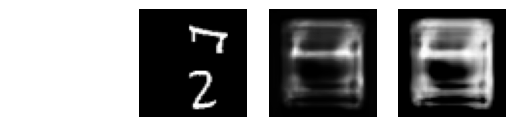

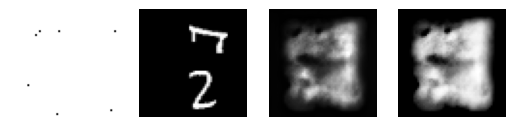

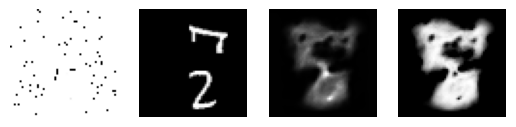

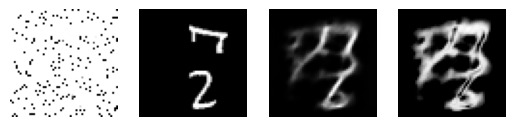

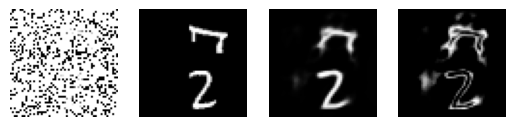

Val loss at epoch 17: -1.1398296314439955
Test loss at epoch 17: -0.5858918895483017
Loss at epoch 18: -1.1171846648820187


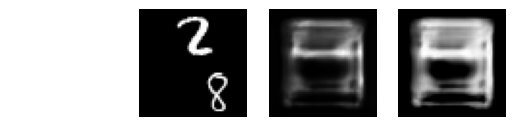

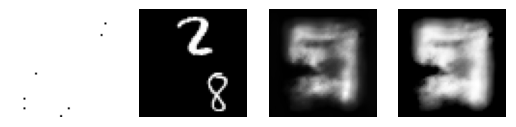

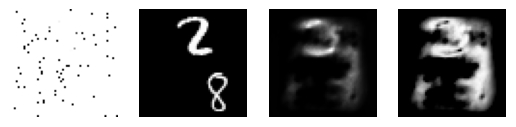

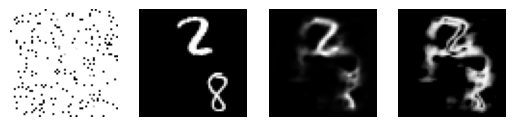

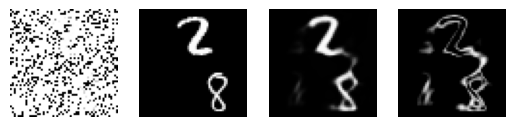

Val loss at epoch 18: -1.1249103215849323
Test loss at epoch 18: -0.5416051481962204
Loss at epoch 19: -1.1128173227700249


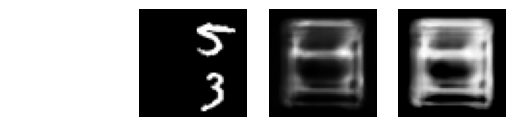

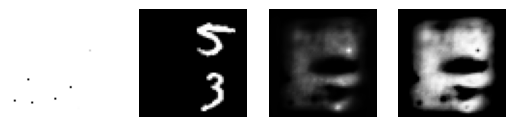

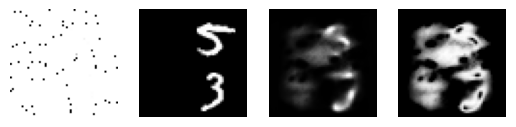

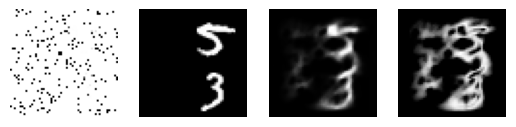

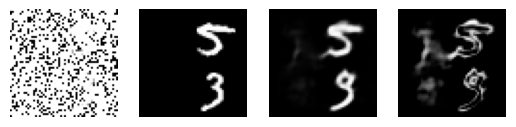

Val loss at epoch 19: -1.1253075964131933
Test loss at epoch 19: -0.5031859405517578
Loss at epoch 20: -1.1179895973165763


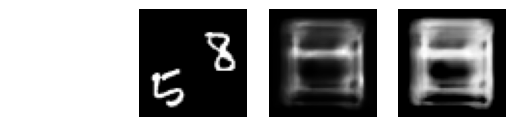

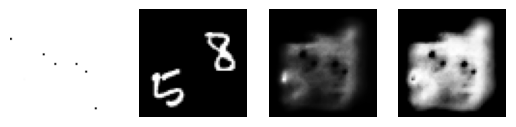

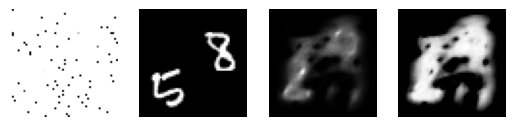

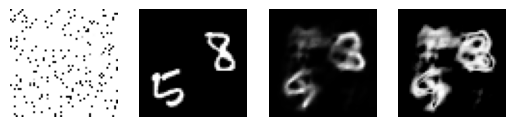

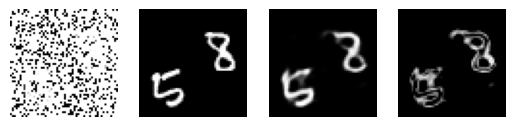

Val loss at epoch 20: -1.1335182896085605
Test loss at epoch 20: -0.512611429142952
Loss at epoch 21: -1.1203802568702215


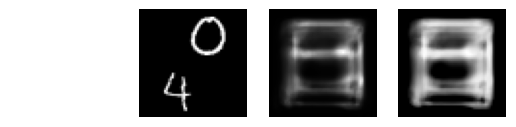

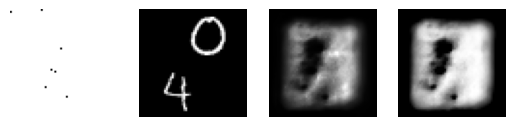

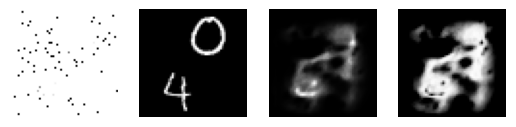

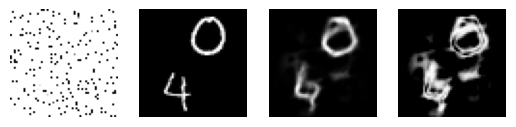

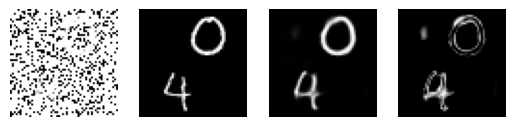

Val loss at epoch 21: -1.1309426935615055
Test loss at epoch 21: -0.5112933270692825


KeyboardInterrupt: 

In [22]:
num_epochs = 50
n_context_low = 1
n_context_high = len(coords) // 2
best_val_loss = 100
patience_count = 0

for epoch in range(1, num_epochs):
    running_loss = 0
    #model.train(True)
    for (imgs, labs) in mnist_trainloader:

        n_context = torch.randint(low=n_context_low, high=n_context_high, size=(1,)).item()
        xs = coords[torch.randperm(coords.shape[0])[:n_context],:]
        imgs = imgs.to(device)
        y_t = imgs.permute(0,2,3,1)

        optimiser.zero_grad()
        mu_t, sigma_t = model(imgs, xs)
        loss = - torch.distributions.normal.Normal(mu_t, sigma_t).log_prob(value=y_t).mean()
        running_loss += loss.item()
        loss.backward()
        #torch.nn.utils.clip_grad_norm_(model.parameters(), clip_value)
        optimiser.step()

    #sched.step()
    #model.train(False)
    if epoch % 1 == 0:
        print(f"Loss at epoch {epoch}:", running_loss/len(mnist_trainloader))
        imgs, _ = next(zsmm_iter)
        plot_mnist_data_range(imgs, model, [0, 7, 70, 210, 700], 56)

    if epoch % 1 == 0:
        running_val_loss = 0
        for (imgs, labs) in mnist_valloader:
            n_context = torch.randint(low=len(coords)//100, high=len(coords)//2, size=(1,)).item()
            xs = coords[torch.randperm(coords.shape[0])[:n_context],:]
            imgs = imgs.to(device)
            y_t = imgs.permute(0,2,3,1)
            mu_t, sigma_t = model(imgs, xs)
            loss = - torch.distributions.normal.Normal(mu_t, sigma_t).log_prob(value=y_t).mean()
            running_val_loss += loss.item()
        print(f"Val loss at epoch {epoch}:", running_val_loss/len(mnist_valloader))
        running_test_loss = 0
        for (imgs, labs) in mnist_testloader:
            n_context = torch.randint(low=len(coords)//100, high=len(coords)//2, size=(1,)).item()
            xs = coords[torch.randperm(coords.shape[0])[:n_context],:]
            imgs = imgs.to(device)
            y_t = imgs.permute(0,2,3,1)
            mu_t, sigma_t = model(imgs, xs)
            loss = - torch.distributions.normal.Normal(mu_t, sigma_t).log_prob(value=y_t).mean()
            running_test_loss += loss.item()
        print(f"Test loss at epoch {epoch}:", running_test_loss/len(mnist_testloader))
        if running_val_loss < best_val_loss:
          PATH = f"/content/gdrive/My Drive/neural_processes/models/zsmmconv2/nepoch_{epoch}.pt"
          torch.save(model.state_dict(), PATH)
          best_val_loss = running_val_loss
          patience_count = 0
        else:
          patience_count += 1

        if patience_count == 10:
              break

In [ ]:
for (imgs, labs) in mnist_testloader:
    n_context = torch.randint(low=len(coords)//100, high=len(coords)//2, size=(1,)).item()
    xs = coords[torch.randperm(coords.shape[0])[:n_context],:]
    imgs = imgs.to(device)
    y_t = imgs.permute(0,2,3,1)
    mu_t, sigma_t = model(imgs, xs)
    loss = - torch.distributions.normal.Normal(mu_t, sigma_t).log_prob(value=y_t).mean()
    running_val_loss += loss.item()
print(f"Loss at epoch {epoch}:", running_val_loss/len(mnist_valloader))

Loss at epoch 49: -6.4331546780789735


In [ ]:
imgs, _ = next(zsmm_iter)

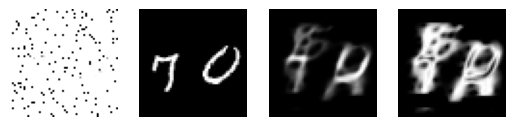

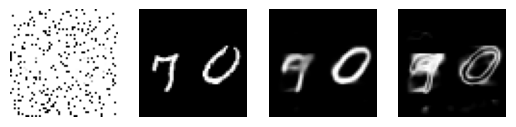

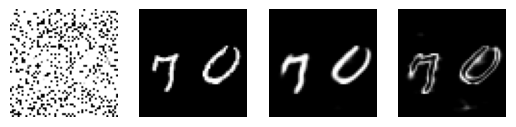

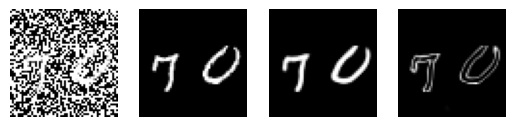

In [ ]:
coords = torch.tensor([(x1, x2) for x1 in range(56) for x2 in range(56)])
for n in [len(coords)//20, len(coords)//10, (len(coords)*2)//10, (len(coords)*5)//10]:
  xs = coords[torch.randperm(coords.shape[0])[:n],:]
  imgs = imgs.to(device)
  y_t = imgs.permute(0,2,3,1)
  mu_t, sigma_t = model(imgs, xs)
  plot_mnist_data(imgs, xs, mu_t, sigma_t, 56)

In [30]:
imgs, labs = next(iter(mnist_testloader))

In [28]:
imgs.shape

torch.Size([16, 1, 56, 56])

TypeError: CNP.forward() missing 1 required positional argument: 'x_t'

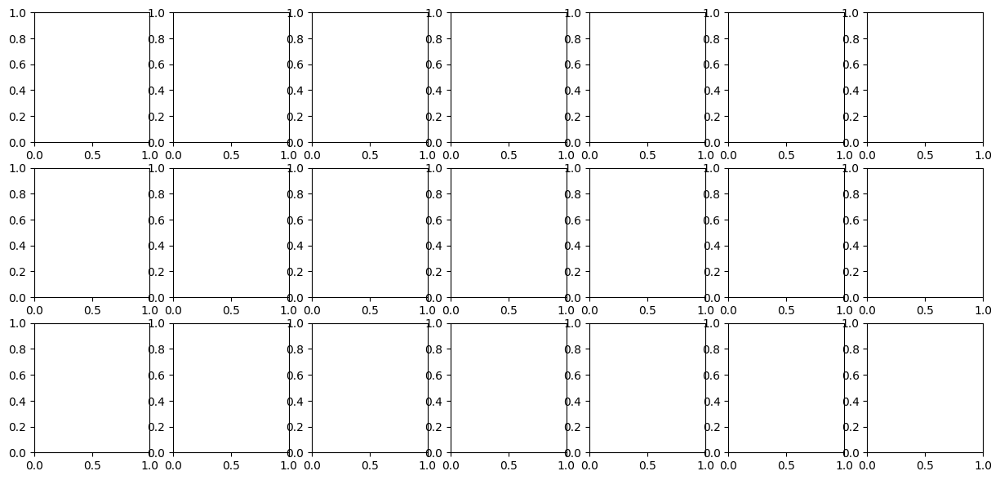

In [58]:
fig, axs = plt.subplots(nrows=3,ncols=7, figsize=(15,7))
model.train(False)
img_num = 3
coords = torch.tensor([(x1, x2) for x1 in range(56) for x2 in range(56)])
for i, c in enumerate([len(coords)//100, len(coords)//20, len(coords)//10, (len(coords)*2)//10, (len(coords)*3)//10, (len(coords)*5)//10]):

  xs = coords[torch.randperm(coords.shape[0])[:c],:]
  x1s, x2s = xs[:,0], xs[:,1]
  imgs = imgs.to(device)
  y_t = imgs.permute(0,2,3,1)
  mu_t, sigma_t = model(imgs, xs)
  background = torch.zeros((56,56, 3))
  background[:,:,-1] = 255
  imgs=imgs.to("cpu")
  background[x1s, x2s, :] = imgs[img_num,:,x1s, x2s].transpose(0,1)
  axs[0][i+1].imshow(background, cmap="gray", aspect = "auto")
  axs[1][i+1].imshow(mu_t.cpu().detach().view(imgs.shape[0], 56,56, 1)[img_num,:,:,:], cmap="gray", aspect = "auto")
  axs[2][i+1].imshow(sigma_t.cpu().detach().view(imgs.shape[0], 56,56, 1)[img_num,:,:,:]**2, cmap="gray", aspect = "auto")

for i in range(3):
  for j in range(7):
    axs[i][j].get_xaxis().set_ticks([])
    axs[i][j].get_yaxis().set_ticks([])
    axs[i][j].spines['left'].set_visible(False)
    axs[i][j].spines['right'].set_visible(False)
    axs[i][j].spines['top'].set_visible(False)
    axs[i][j].spines['bottom'].set_visible(False)

f = 17
axs[0][1].set_ylabel("Context", fontsize=f)
axs[1][1].set_ylabel("Mean", fontsize=f)
axs[2][1].set_ylabel("Variance", fontsize=f)

axs[0][1].set_title("1%", fontsize=f)
axs[0][2].set_title("5%", fontsize=f)
axs[0][3].set_title("10%", fontsize=f)
axs[0][4].set_title("20%", fontsize=f)
axs[0][5].set_title("30%", fontsize=f)
axs[0][6].set_title("50%", fontsize=f)

axs[1][0].imshow(imgs.to("cpu")[img_num,:,:,:].permute(1,2,0), cmap="gray", aspect="auto")
axs[1][0].set_title("True Image", fontsize=f)

plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.show()

### ZSMM CNP

In [48]:
def plot_mnist_data(imgs, xs, mu_t, sigma_t, dims):
  x1s, x2s = xs[:,0], xs[:,1]
  fig, axs = plt.subplots(1, 4)
  imgs = imgs.to("cpu")
  background = torch.ones((dims,dims,3)).to(imgs.device)
  background[x1s, x2s, :] = imgs[0,:,x1s, x2s].transpose(0,1)
  axs[0].imshow(background)
  axs[1].imshow(imgs[0,:,:,:].permute(1, 2, 0), cmap="gray")
  axs[2].imshow(mu_t.cpu().detach().view(-1,32,32,1)[0,:,:,:], cmap="gray")
  axs[3].imshow(sigma_t.cpu().detach().view(-1,32,32,1)[0,:,:,:], cmap="gray")
  for ax in axs:
    ax.set_axis_off()
  plt.show()

def plot_mnist_zsmm_range(imgs, model, ns, dims):
  coords = torch.tensor([(x1, x2) for x1 in range(dims) for x2 in range(dims)])
  for n in ns:
    xs = coords[torch.randperm(coords.shape[0])[:n],:]
    imgs = imgs.to(device)
    x_c = torch.stack([xs]*imgs.shape[0]) / 32 # normalise inputs
    x_t = torch.stack([coords]*imgs.shape[0]) / 32
    x1s, x2s = xs[:,0], xs[:,1]
    y_c = imgs[:,:,x1s,x2s].transpose(1,2)
    y_t = imgs[:,:,coords[:,0], coords[:,1]].transpose(1,2)
    x_c, x_t, y_c, y_t = x_c.to(device), x_t.to(device), y_c.to(device), y_t.to(device)
    mu_t, sigma_t = model(x_c, y_c, x_t)
    plot_mnist_data(imgs, xs, mu_t, sigma_t, dims)

In [49]:
def plot_mnist_data(imgs, x1s, x2s, mu_t, sigma_t, dims):
  fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4)
  imgs = imgs.to("cpu")
  background = torch.zeros((dims,dims,3)).to(imgs.device)
  background[x1s, x2s, :] = imgs[0,:,x1s, x2s].transpose(0,1)
  ax1.imshow(background, cmap="gray")
  ax2.imshow(imgs[0,:,:,:].permute(1, 2, 0), cmap="gray")
  ax3.imshow(mu_t.cpu().detach().view(imgs.shape[0], dims, dims, 1)[0,:,:,:], cmap="gray")
  ax4.imshow(sigma_t.cpu().detach().view(imgs.shape[0], dims, dims, 1)[0,:,:,:], cmap="gray")
  plt.show()

def plot_mnist_zsmm_range(imgs, model, ns):
  coords = torch.tensor([(x1, x2) for x1 in range(56) for x2 in range(56)])
  for n in ns:
    xs = coords[torch.randperm(coords.shape[0])[:n],:]
    imgs = imgs.to(device)
    x_c = (torch.stack([xs]*imgs.shape[0]) - 28)/ 16 # normalise inputs
    x_t = (torch.stack([coords]*imgs.shape[0]) -28) / 16
    x1s, x2s = xs[:,0], xs[:,1]
    y_c = imgs[:,:,x1s,x2s].transpose(1,2)
    y_t = imgs[:,:,coords[:,0], coords[:,1]].transpose(1,2)
    x_c, x_t, y_c, y_t = x_c.to(device), x_t.to(device), y_c.to(device), y_t.to(device)
    mu_t, sigma_t = model(x_c, y_c, x_t)
    plot_mnist_data(imgs, x1s, x2s, mu_t, sigma_t, 56)

In [52]:
cnp = CNP(x_dim=2, y_dim=1, encoder_dim=128, encoder_layers=3, decoder_dim=64, decoder_layers=5, sigma_min=0.1)
optimiser = torch.optim.Adam(cnp.parameters(), lr=5e-4)
clip_value = 1
sched = torch.optim.lr_scheduler.ExponentialLR(optimiser, get_exponential_decay_gamma(10,50))
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
model = cnp.to(device)
sum(p.numel() for p in cnp.parameters())

54530

Loss at epoch 0: -0.47908204329279386


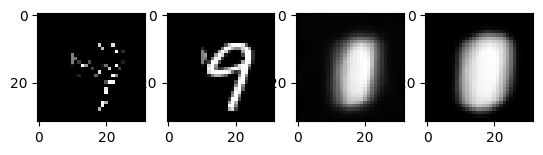

Loss at epoch 0: -0.630936037155853
Loss at epoch 0: 0.74613118724823


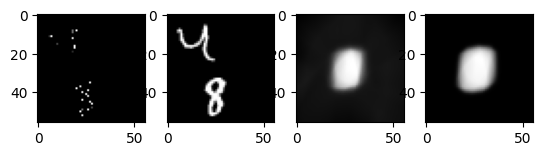

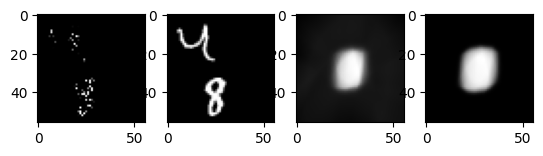

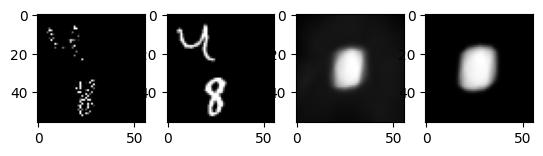

Loss at epoch 1: -0.644932880491831


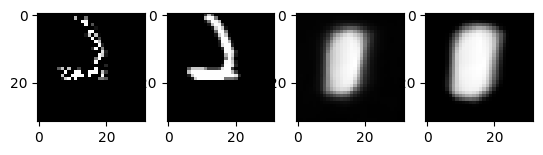

Loss at epoch 1: -0.6615039254212456
Loss at epoch 1: 0.7545705807685852


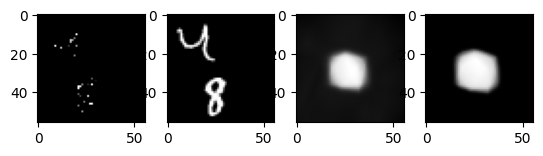

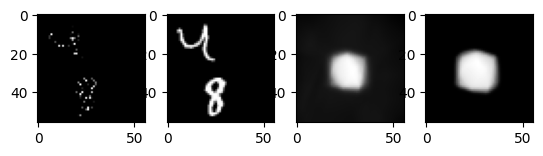

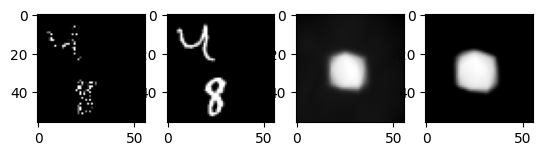

Loss at epoch 2: -0.6868485160385511


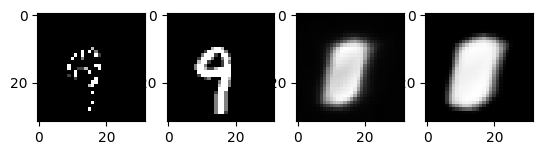

Loss at epoch 2: -0.7045300119811562
Loss at epoch 2: 0.4676298251867294


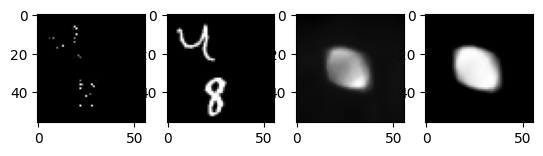

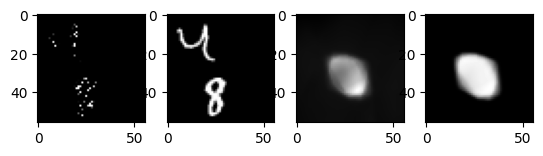

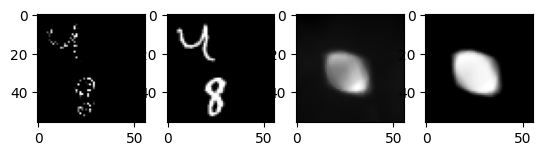

Loss at epoch 3: -0.7243734035588092


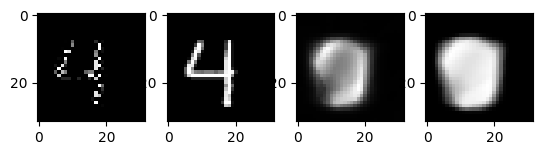

Loss at epoch 3: -0.7475801412087337
Loss at epoch 3: 0.30440567348487674


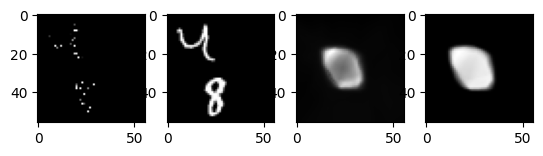

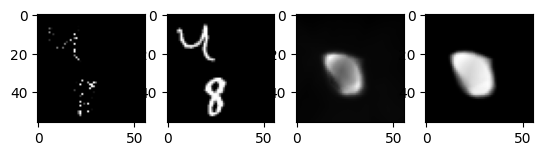

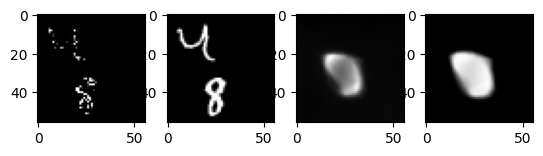

Loss at epoch 4: -0.7456255787921345


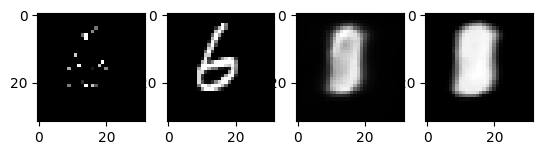

Loss at epoch 4: -0.7518242811131629
Loss at epoch 4: 0.2919052554294467


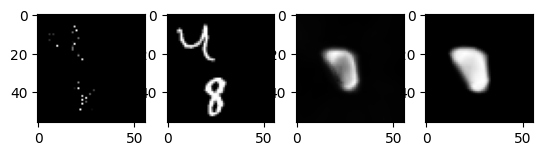

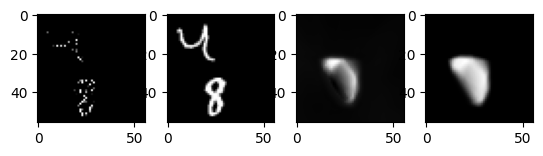

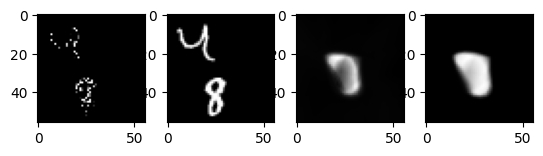

Loss at epoch 5: -0.754009968145612


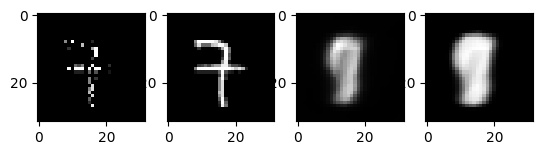

Loss at epoch 5: -0.7625256560410664
Loss at epoch 5: 0.31229589957240966


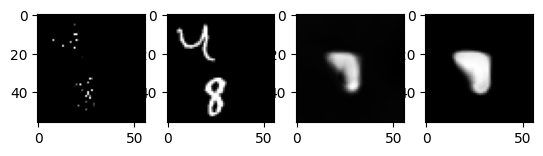

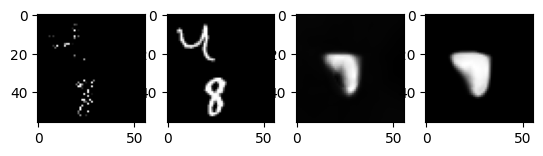

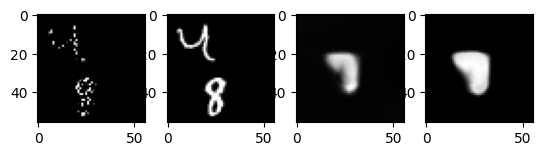

Loss at epoch 6: -0.7726858719150989


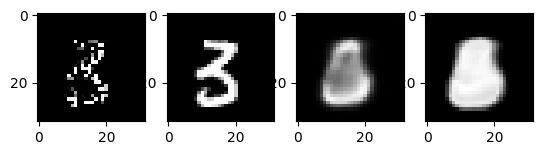

Loss at epoch 6: -0.7904806250030068
Loss at epoch 6: 0.639212670660019


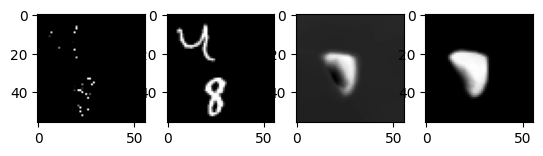

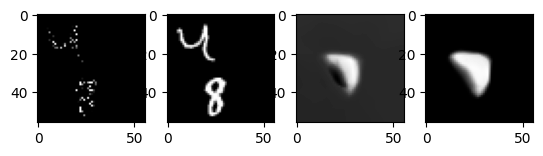

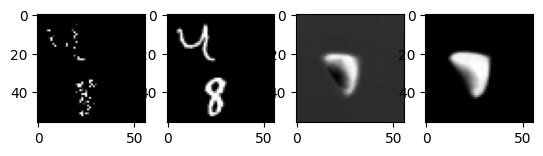

Loss at epoch 7: -0.7885354412683329


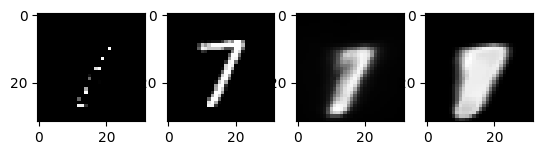

Loss at epoch 7: -0.8191644670856986
Loss at epoch 7: 0.7251577505111695


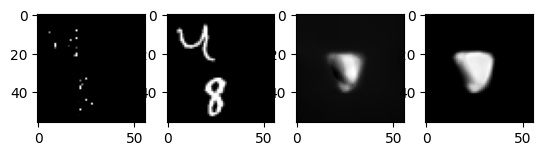

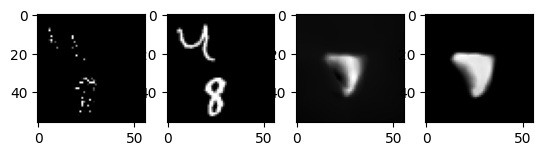

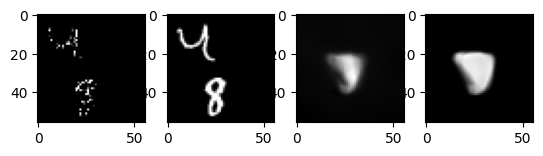

Loss at epoch 8: -0.7978924112016118


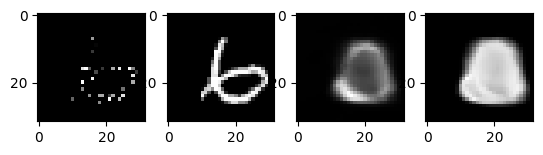

Loss at epoch 8: -0.7864755628879663
Loss at epoch 8: 0.9005539618015289


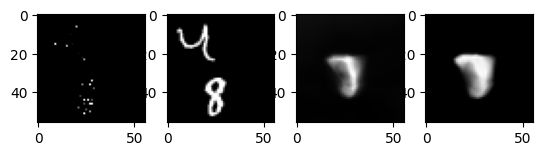

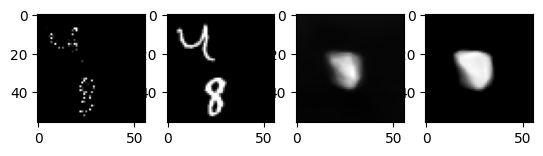

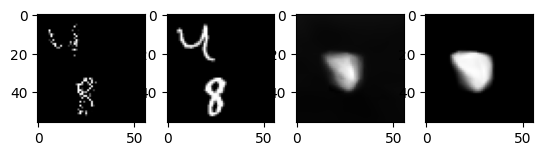

Loss at epoch 9: -0.8092602170240932


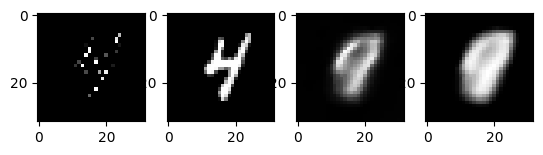

Loss at epoch 9: -0.8213378666502655
Loss at epoch 9: 0.6478994597434997


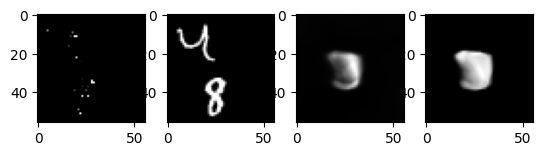

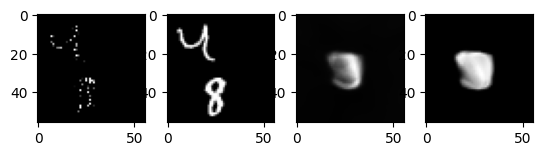

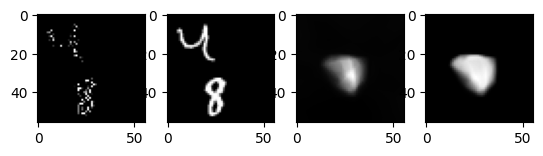

Loss at epoch 10: -0.8166402430420262


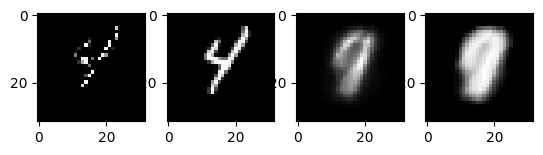

Loss at epoch 10: -0.8050289081919725
Loss at epoch 10: 0.6007325401782989


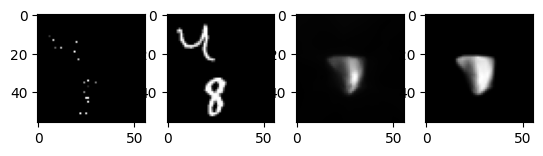

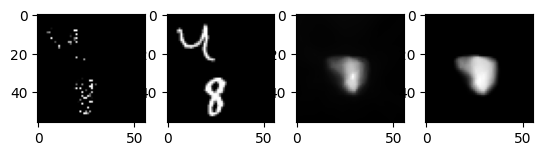

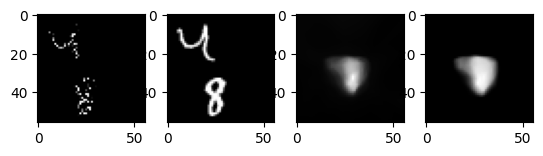

Loss at epoch 11: -0.8171211748146056


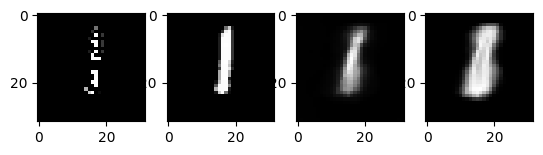

Loss at epoch 11: -0.8148232888264261
Loss at epoch 11: 0.3086692553299945


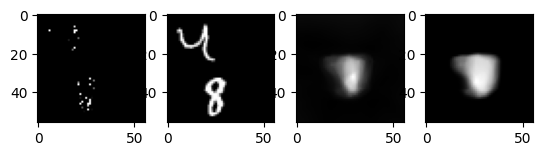

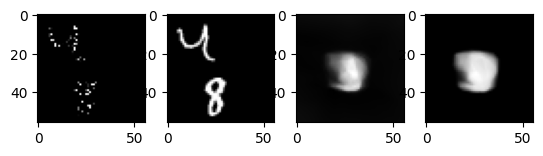

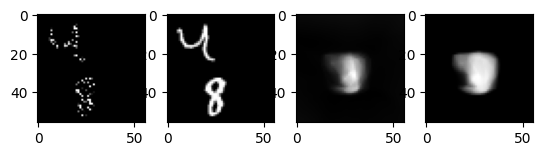

Loss at epoch 12: -0.8252093933396245


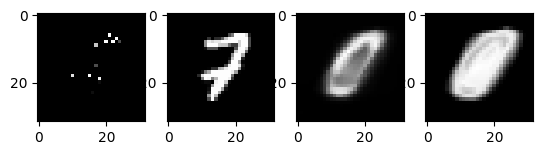

Loss at epoch 12: -0.8242939725802962
Loss at epoch 12: 0.7005050308704376


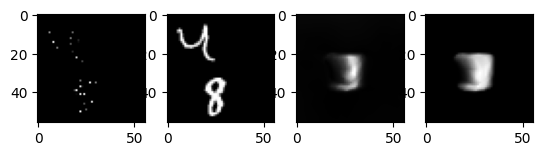

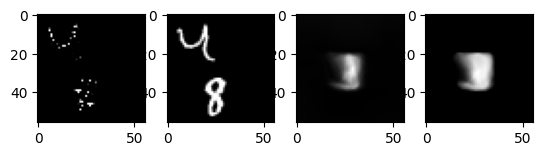

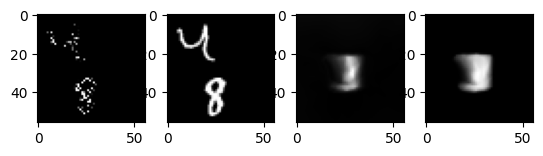

Loss at epoch 13: -0.8280782643912913


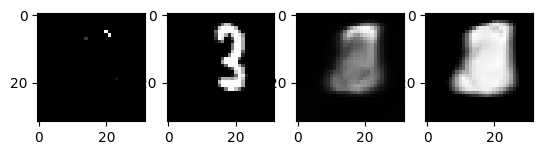

Loss at epoch 13: -0.8347527217713131
Loss at epoch 13: 0.7252019640445709


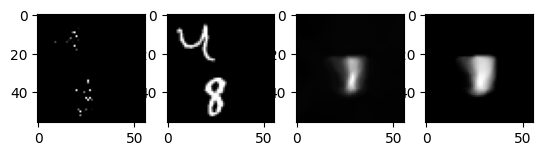

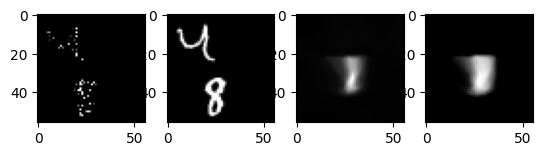

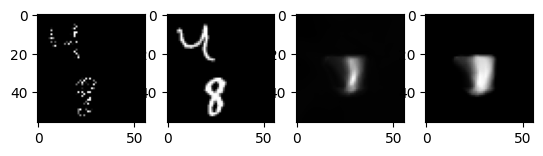

Loss at epoch 14: -0.8352021178770676


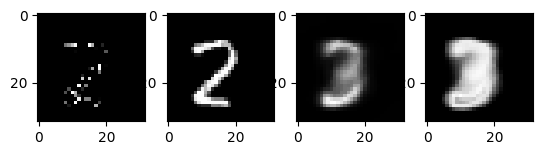

Loss at epoch 14: -0.8476290049826264
Loss at epoch 14: 0.5730642910242081


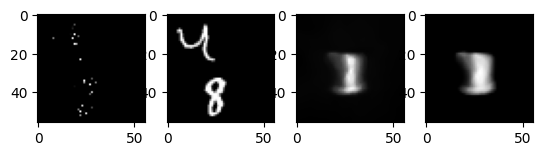

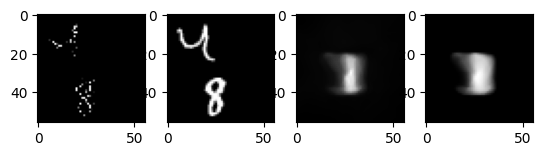

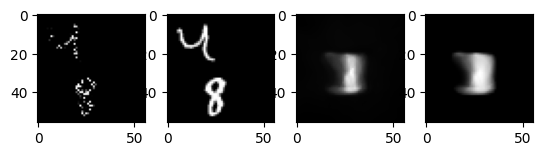

Loss at epoch 15: -0.8422997167368166


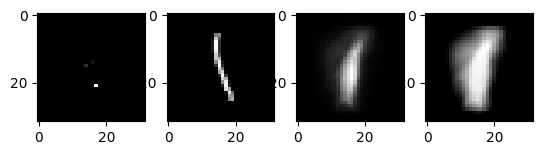

Loss at epoch 15: -0.8412939501795799
Loss at epoch 15: 0.5284356010437011


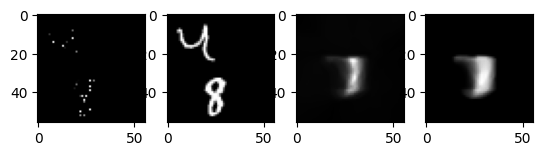

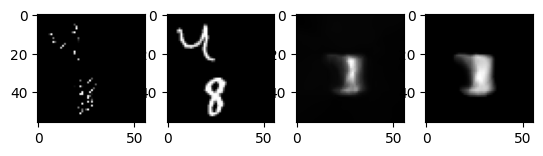

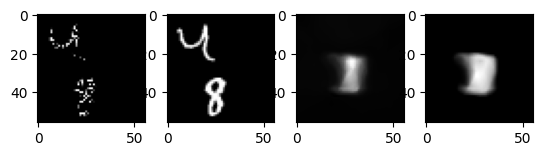

Loss at epoch 16: -0.8436791579880164


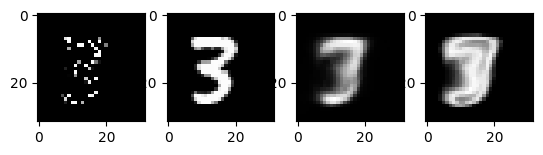

Loss at epoch 16: -0.8376781570303972
Loss at epoch 16: 0.804213340806961


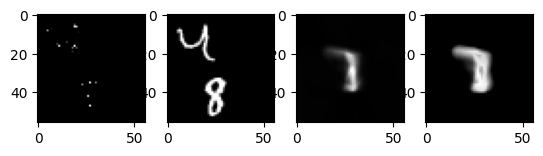

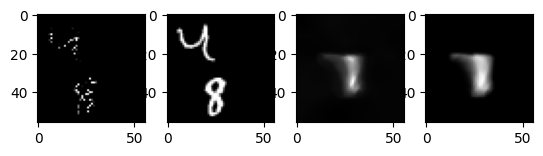

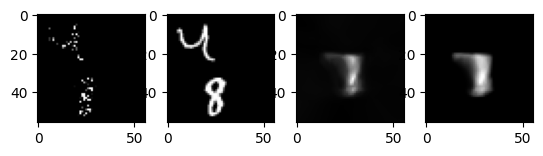

Loss at epoch 17: -0.847320372689646


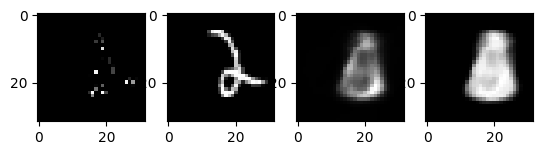

Loss at epoch 17: -0.845362864482175
Loss at epoch 17: 0.8095878675937652


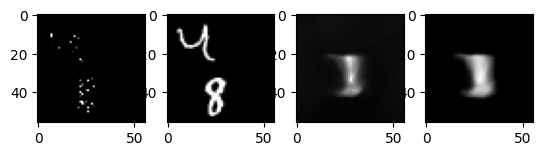

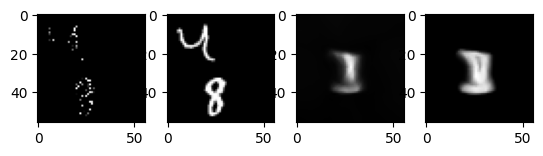

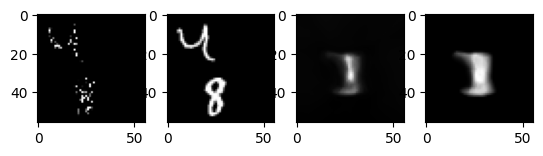

Loss at epoch 18: -0.8503437621490983


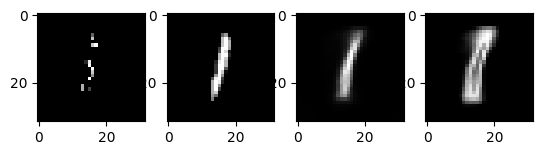

Loss at epoch 18: -0.8458719027649825
Loss at epoch 18: 0.7365559529781341


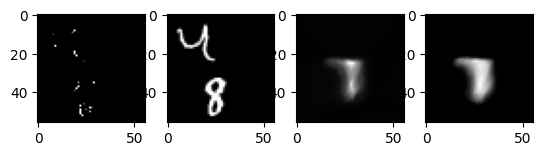

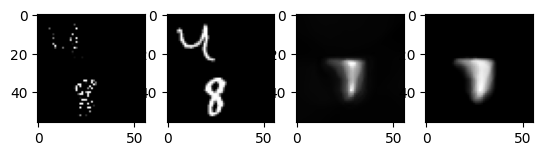

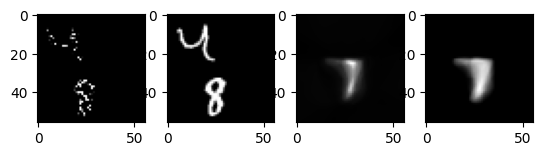

Loss at epoch 19: -0.8527125810616601


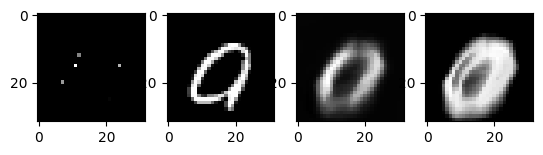

Loss at epoch 19: -0.8674672164355114
Loss at epoch 19: 0.32060958090424535


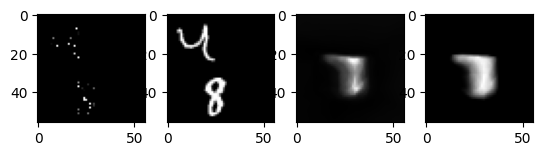

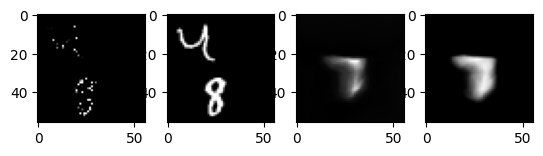

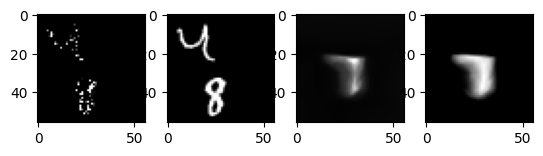

Loss at epoch 20: -0.8528103048627617


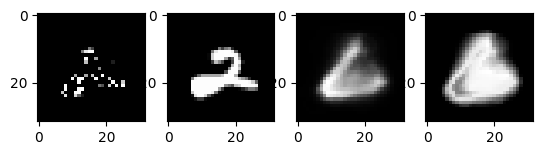

Loss at epoch 20: -0.8531008672182727
Loss at epoch 20: 0.13597863559671677


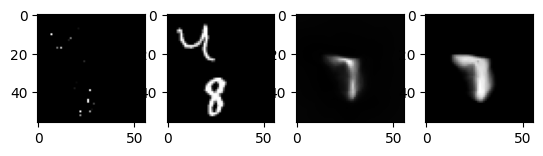

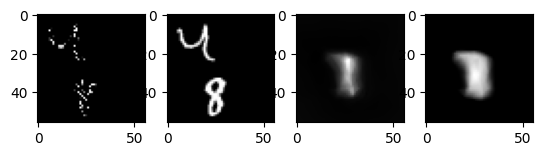

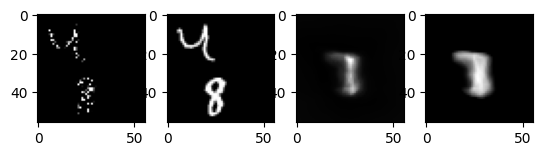

Loss at epoch 21: -0.8567524885237383


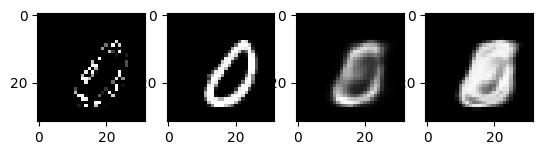

Loss at epoch 21: -0.8556854071890473
Loss at epoch 21: 0.43980185520648957


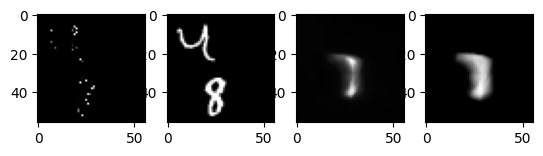

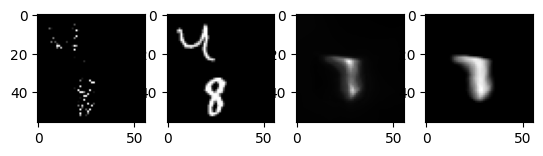

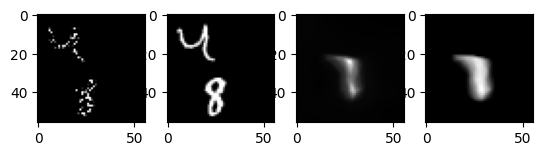

Loss at epoch 22: -0.8625874586997302


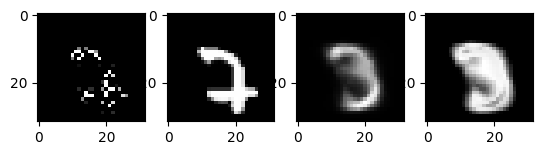

Loss at epoch 22: -0.8738614856057866
Loss at epoch 22: 0.5082878563374281


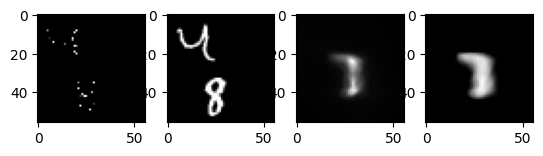

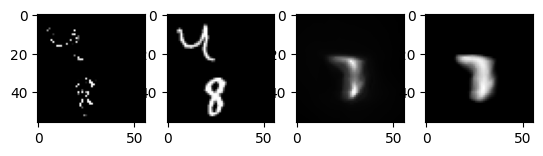

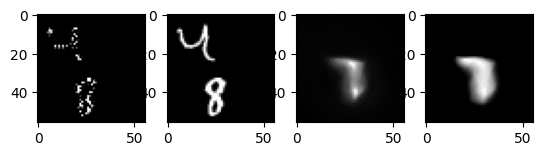

Loss at epoch 23: -0.8639369143808492


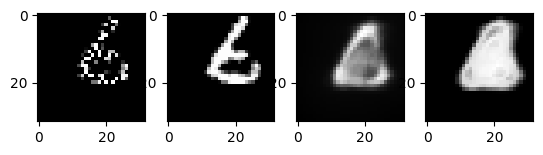

Loss at epoch 23: -0.848204315847652
Loss at epoch 23: 0.127872618071374


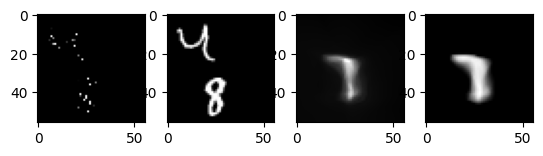

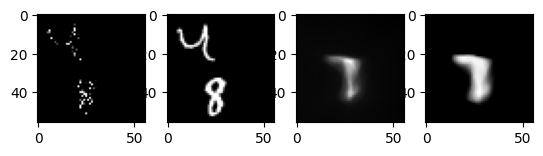

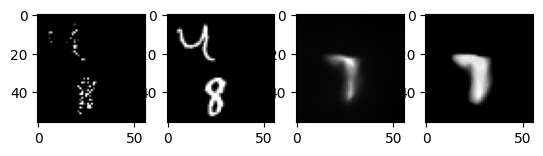

Loss at epoch 24: -0.8664160240223889


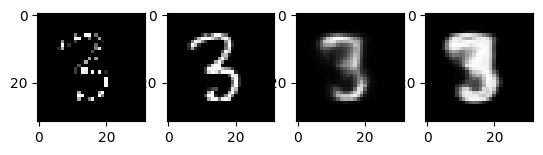

Loss at epoch 24: -0.8607498242217264
Loss at epoch 24: 0.3420896605789661


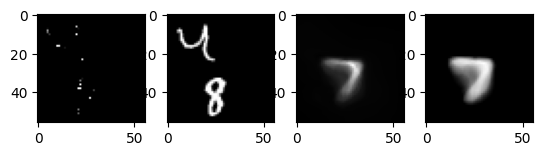

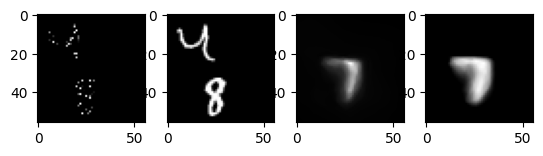

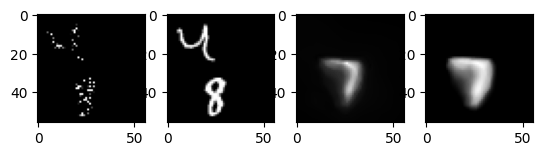

Loss at epoch 25: -0.8645757772339405


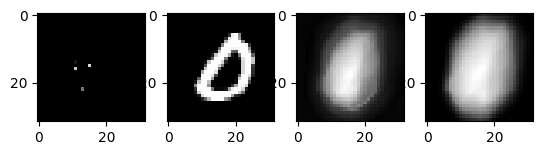

Loss at epoch 25: -0.8763925575526657
Loss at epoch 25: 0.5527798351168632


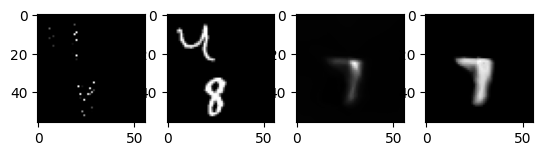

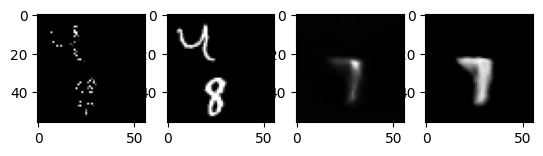

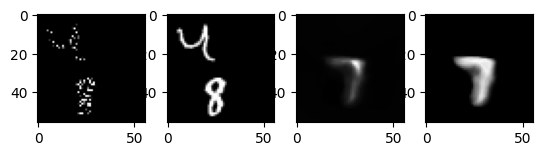

Loss at epoch 26: -0.8731695893503058


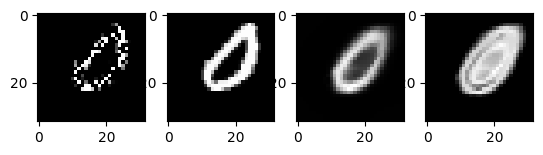

Loss at epoch 26: -0.8844368600161971
Loss at epoch 26: 0.37005094484090806


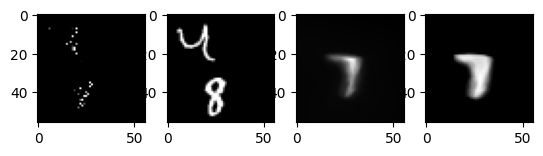

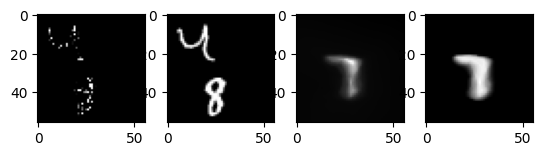

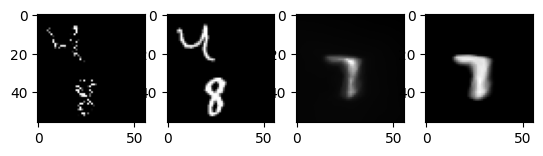

Loss at epoch 27: -0.8742925216696232


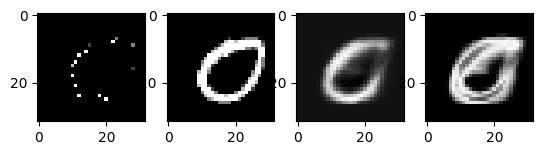

Loss at epoch 27: -0.8933355396340608
Loss at epoch 27: 0.5158623837769032


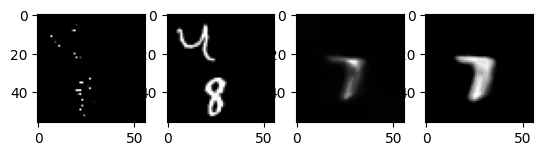

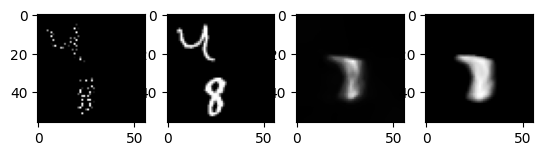

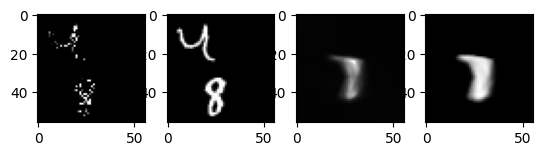

Loss at epoch 28: -0.8734451177704646


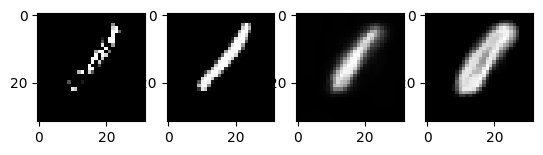

Loss at epoch 28: -0.8794650078579119
Loss at epoch 28: 0.5059316146910191


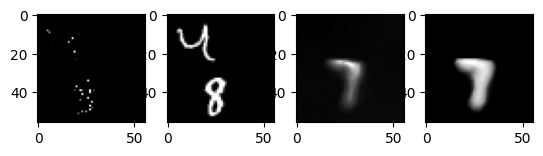

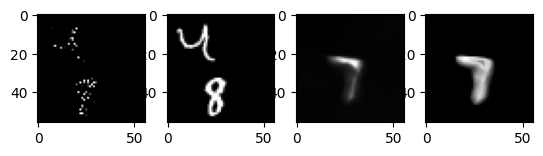

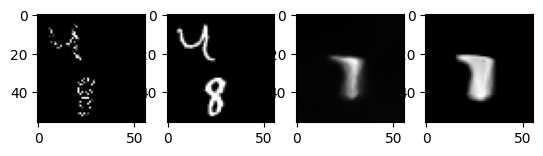

Loss at epoch 29: -0.8785463998101457


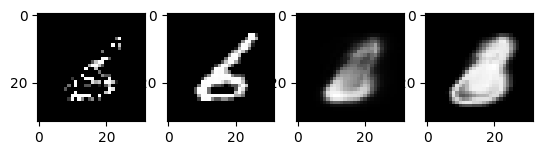

Loss at epoch 29: -0.8870263970961236
Loss at epoch 29: 0.6549891341507434


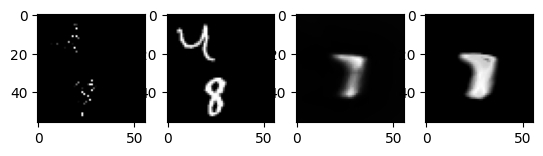

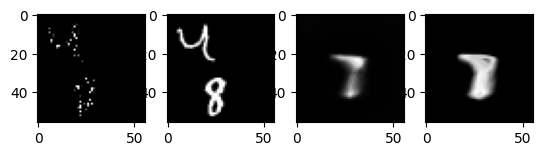

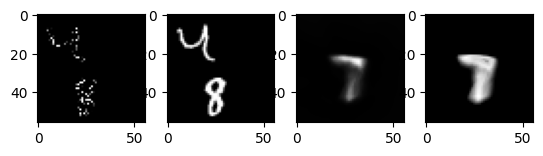

Loss at epoch 30: -0.8803175140999394


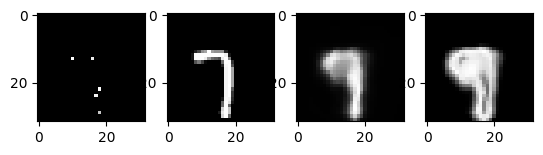

Loss at epoch 30: -0.8778757785156275
Loss at epoch 30: 0.5746592707335949


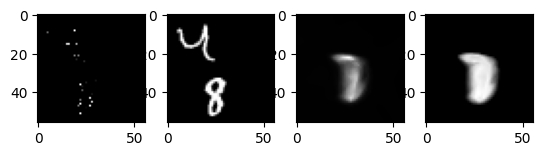

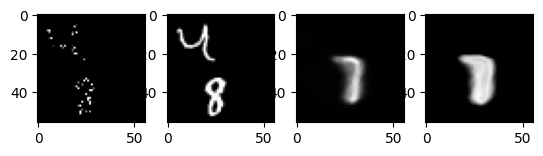

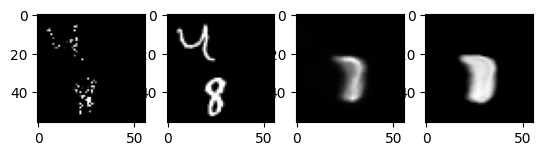

Loss at epoch 31: -0.8781996590059933


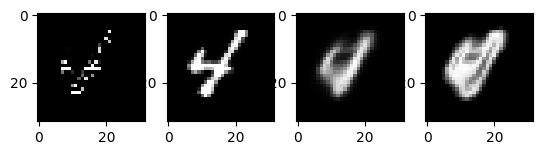

Loss at epoch 31: -0.8919466023991822
Loss at epoch 31: 0.6952189751006663


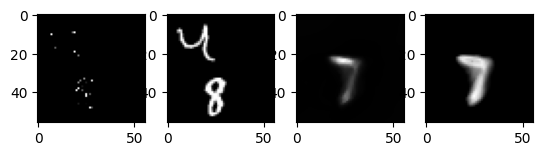

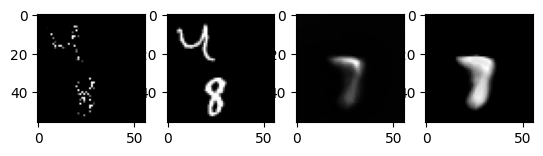

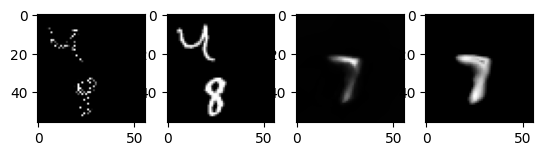

Loss at epoch 32: -0.8841237666693805


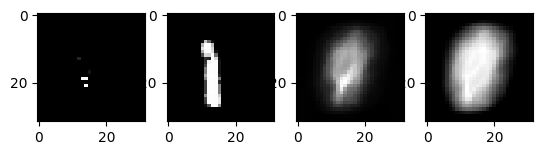

Loss at epoch 32: -0.8728267597924372
Loss at epoch 32: 0.6245754498779774


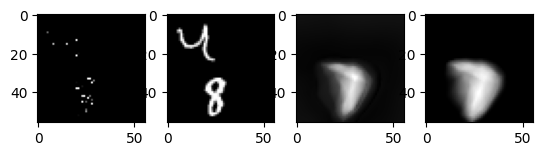

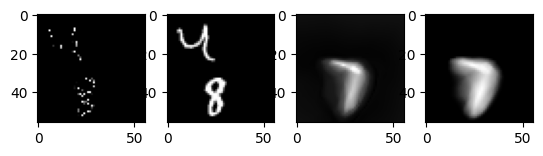

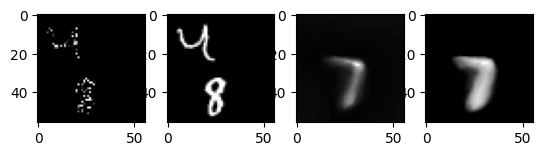

Loss at epoch 33: -0.8839454488247285


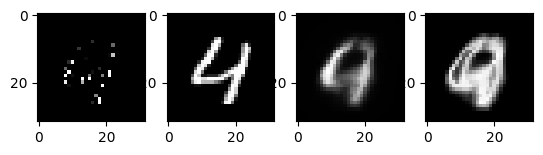

Loss at epoch 33: -0.9144623871821507
Loss at epoch 33: 0.4290770597577095


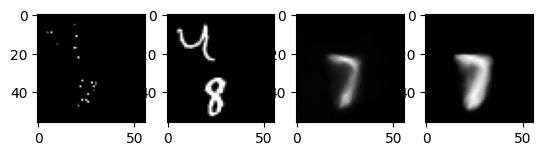

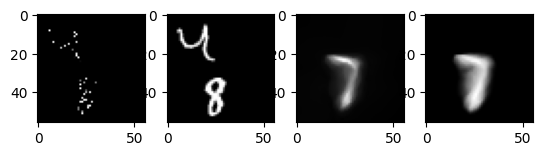

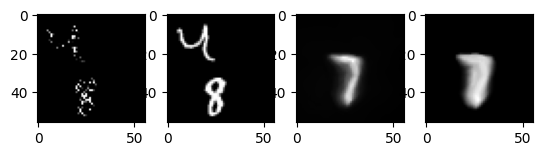

Loss at epoch 34: -0.890105186877114


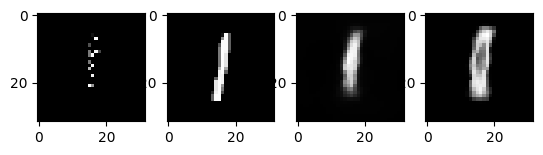

Loss at epoch 34: -0.8814191782170799
Loss at epoch 34: 0.5177788501441478


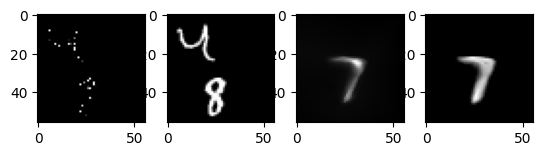

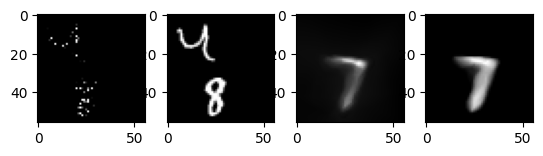

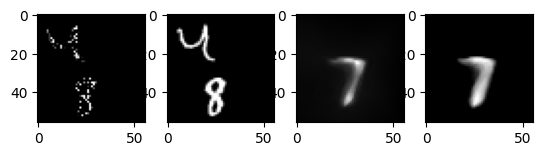

Loss at epoch 35: -0.8895889650978476


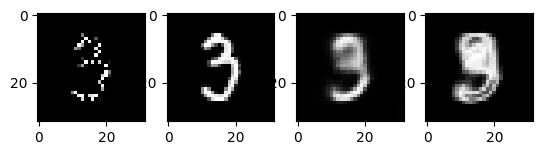

Loss at epoch 35: -0.8760448386714716
Loss at epoch 35: 0.5676427940547466


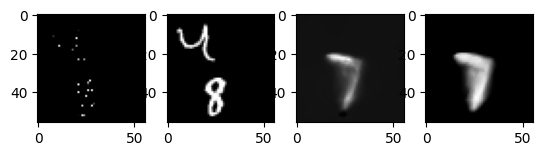

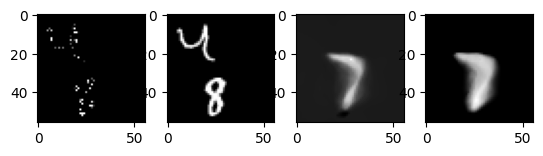

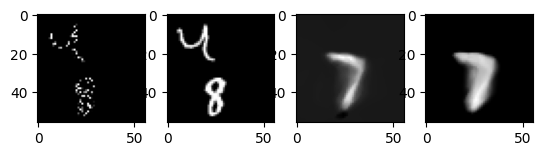

Loss at epoch 36: -0.8935174026594404


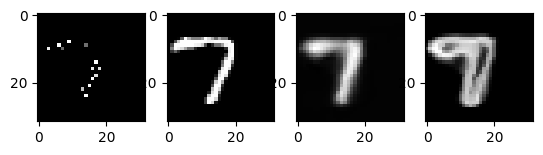

Loss at epoch 36: -0.906945309061913
Loss at epoch 36: 0.4037889331378043


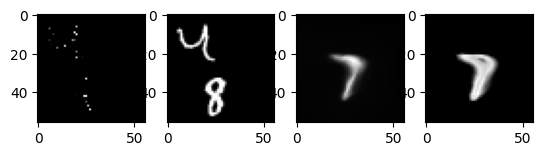

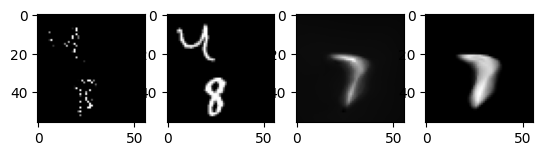

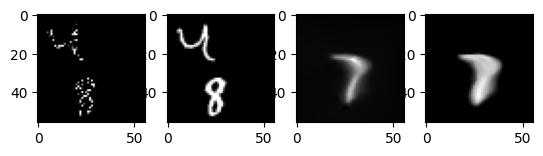

Loss at epoch 37: -0.8915978615806046


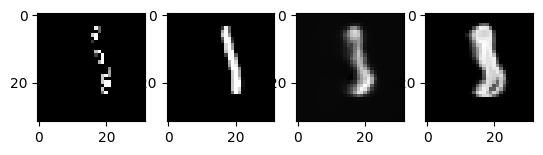

Loss at epoch 37: -0.8954545954230485
Loss at epoch 37: 0.502850055487454


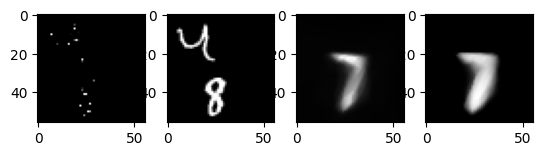

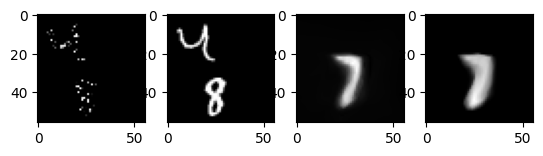

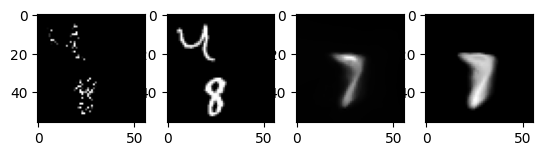

Loss at epoch 38: -0.8924847655019033


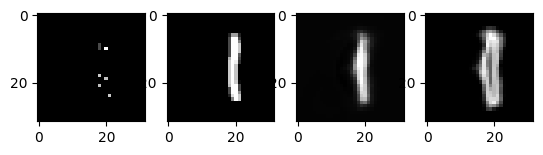

Loss at epoch 38: -0.9062536858069669
Loss at epoch 38: 0.532937638168037


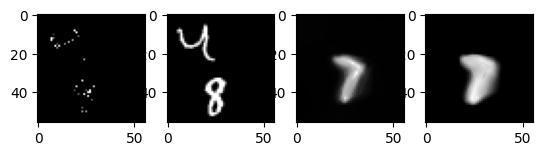

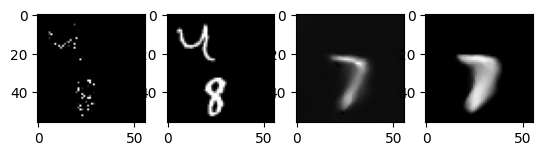

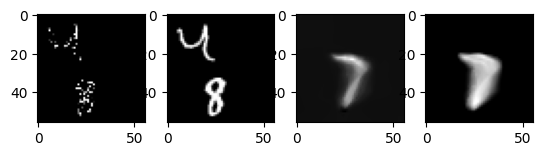

Loss at epoch 39: -0.8926143931576326


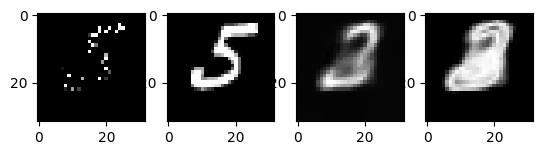

Loss at epoch 39: -0.9166182044205392
Loss at epoch 39: 0.38199848392326385


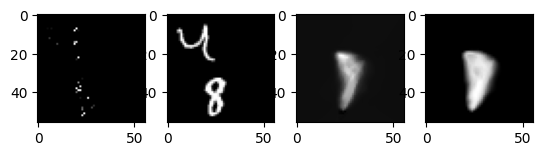

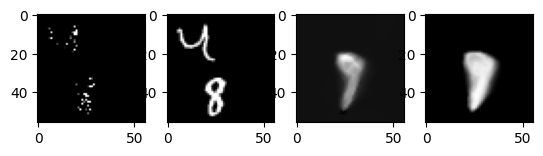

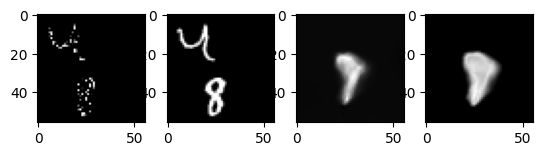

Loss at epoch 40: -0.8998855096378722


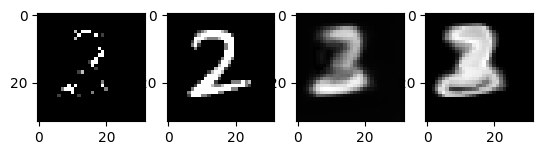

Loss at epoch 40: -0.8833205210175484
Loss at epoch 40: 0.27777181825917213


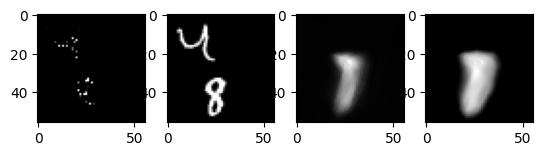

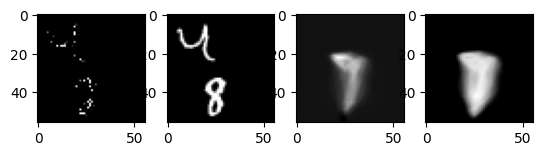

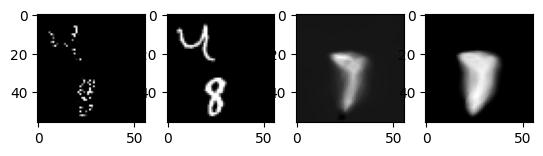

Loss at epoch 41: -0.8985763174374409


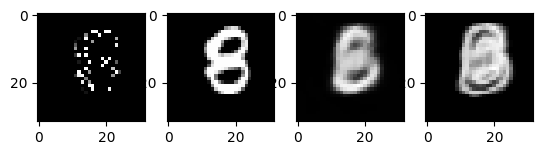

Loss at epoch 41: -0.9046345244927011
Loss at epoch 41: 0.3112446073066443


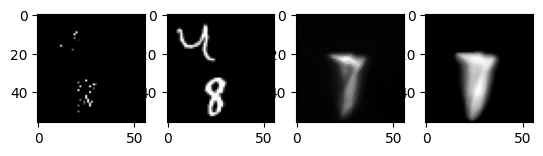

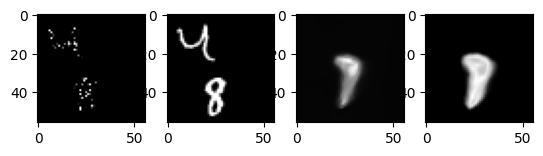

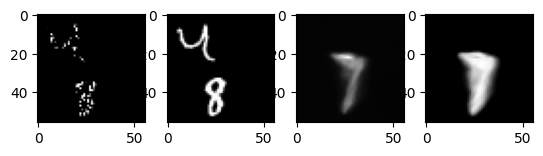

Loss at epoch 42: -0.9010406438765024


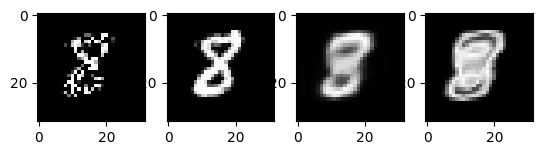

Loss at epoch 42: -0.9052546145809683
Loss at epoch 42: 0.3966065108940005


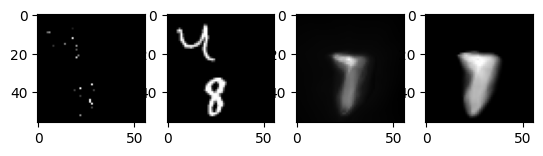

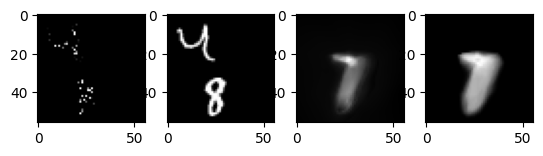

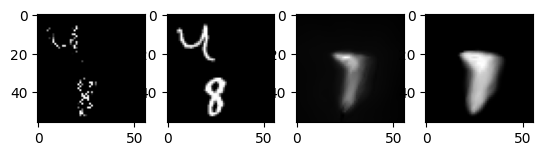

Loss at epoch 43: -0.8980715236334782


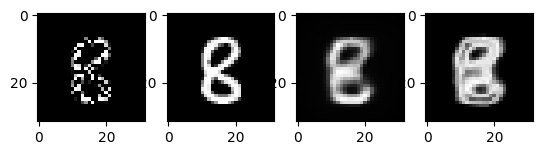

Loss at epoch 43: -0.895019778210646
Loss at epoch 43: 0.46364755686502906


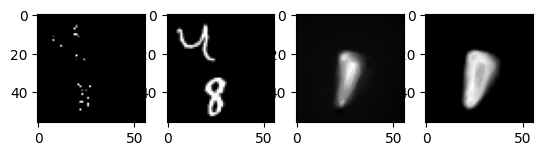

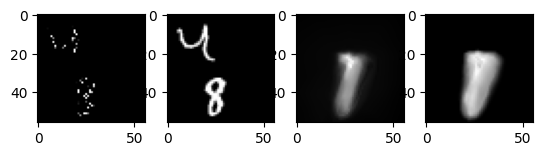

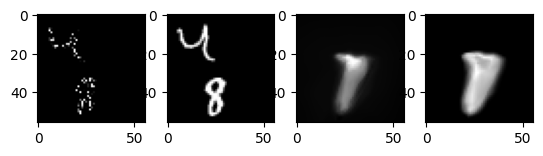

Loss at epoch 44: -0.9011466683914214


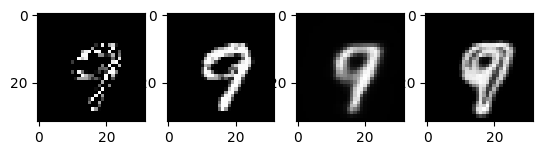

Loss at epoch 44: -0.9077643493937838
Loss at epoch 44: 0.1943339454136556


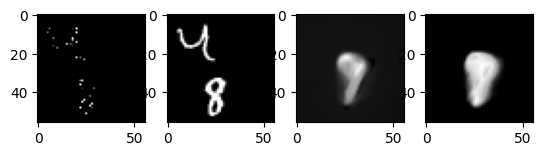

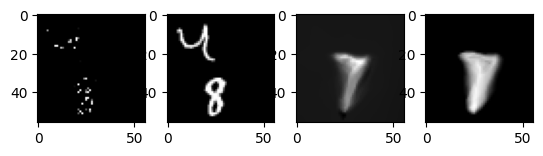

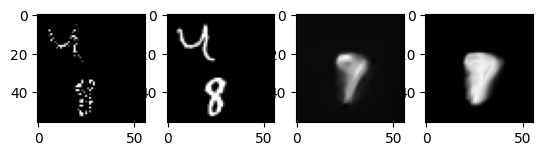

Loss at epoch 45: -0.8994871339790261


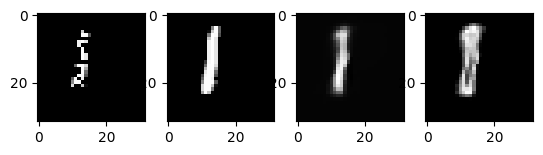

Loss at epoch 45: -0.8957111488102348
Loss at epoch 45: 0.3259589655932039


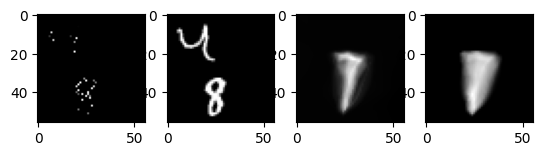

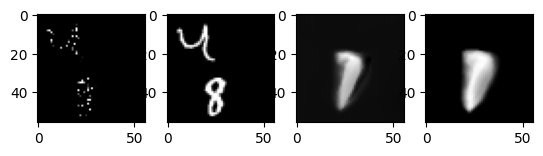

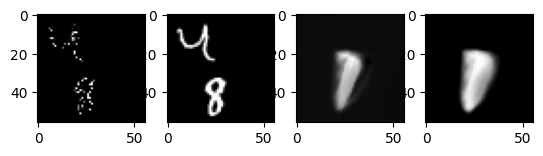

Loss at epoch 46: -0.9040265829158811


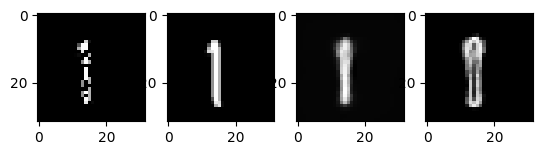

Loss at epoch 46: -0.9061602566652237
Loss at epoch 46: 0.2916455364881083


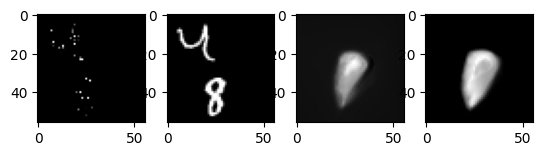

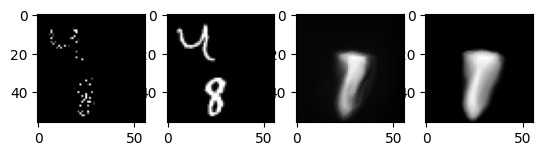

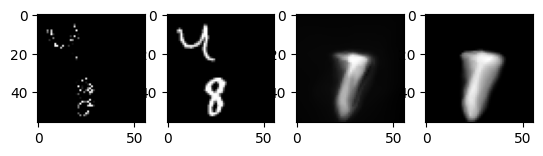

Loss at epoch 47: -0.9031525055650346


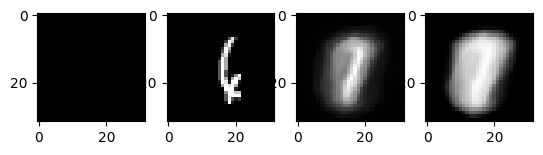

Loss at epoch 47: -0.9167667327413134
Loss at epoch 47: 0.2916110354304314


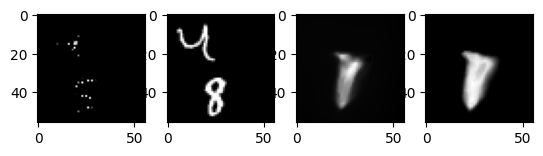

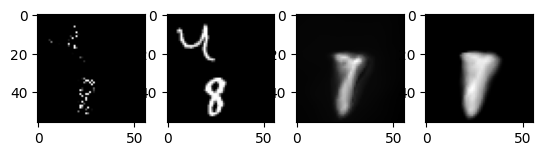

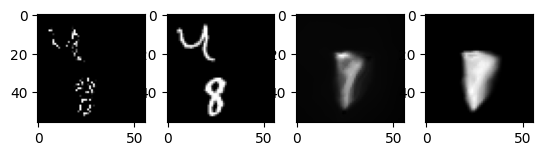

Loss at epoch 48: -0.9046295066682842


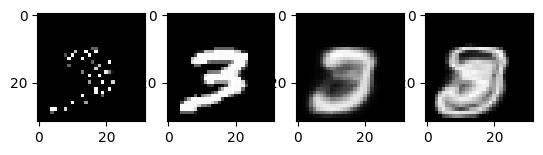

Loss at epoch 48: -0.9060634815009536
Loss at epoch 48: 0.2661227861525491


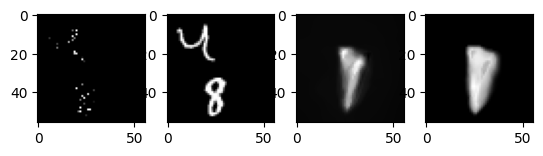

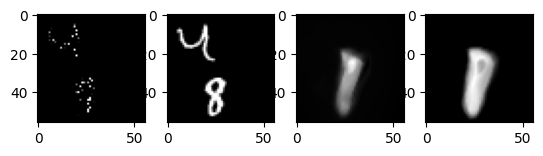

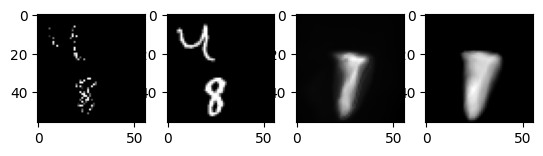

Loss at epoch 49: -0.905922941220888


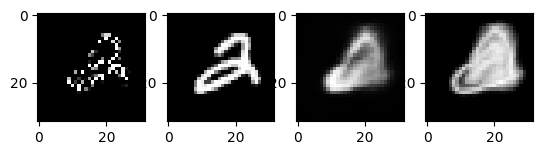

Loss at epoch 49: -0.9017736824454775
Loss at epoch 49: 0.1677386014211923


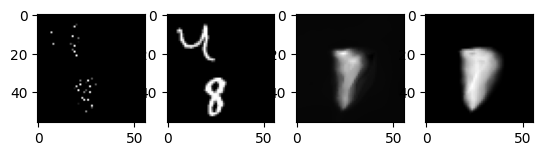

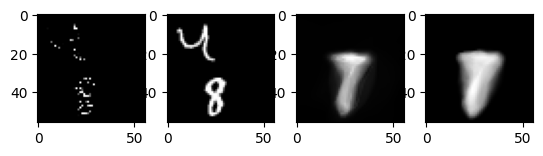

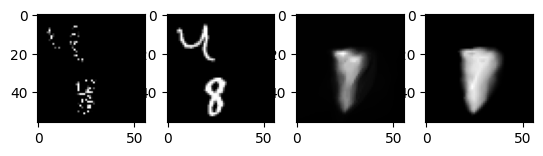

In [53]:
num_epochs = 50
coords = torch.tensor([(x1, x2) for x1 in range(32) for x2 in range(32)])
n_context_low = 1
n_context_high = len(coords) // 2
best_val_loss = 100

coords = torch.tensor([(x1, x2) for x1 in range(32) for x2 in range(32)])
n_context_low = 1
n_context_high = len(coords) // 2

for epoch in range(num_epochs):
    running_loss = 0
    coords = torch.tensor([(x1, x2) for x1 in range(32) for x2 in range(32)])
    for (imgs, labs) in mnist_trainloader:
        n_context = torch.randint(low=n_context_low, high=n_context_high, size=(1,)).item()
        xs = coords[torch.randperm(coords.shape[0])[:n_context],:]
        x_c = (torch.stack([xs]*imgs.shape[0]) - 16)/ 16 # normalise inputs
        x_t = (torch.stack([coords]*imgs.shape[0]) - 16) / 16
        x1s, x2s = xs[:,0], xs[:,1]
        y_c = imgs[:,:,x1s,x2s].transpose(1,2)
        y_t = imgs[:,:,coords[:,0], coords[:,1]].transpose(1,2)
        x_c, x_t, y_c, y_t = x_c.to(device), x_t.to(device), y_c.to(device), y_t.to(device)
        optimiser.zero_grad()
        mu_t, sigma_t = cnp(x_c, y_c, x_t)
        loss = - torch.distributions.normal.Normal(mu_t, sigma_t).log_prob(value=y_t).mean()
        running_loss += loss.item()
        loss.backward()
        optimiser.step()
    if epoch % 1 == 0:
        print(f"Loss at epoch {epoch}:", running_loss/len(mnist_trainloader))
        plot_mnist_data(imgs, x1s, x2s, mu_t, sigma_t, 32)
    val_loss = 0
    for (imgs, labs) in mnist_valloader:
        n_context = torch.randint(low=n_context_low, high=n_context_high, size=(1,)).item()
        xs = coords[torch.randperm(coords.shape[0])[:n_context],:]
        x_c = (torch.stack([xs]*imgs.shape[0]) - 16)/ 16 # normalise inputs
        x_t = (torch.stack([coords]*imgs.shape[0]) - 16) / 16
        x1s, x2s = xs[:,0], xs[:,1]
        y_c = imgs[:,:,x1s,x2s].transpose(1,2)
        y_t = imgs[:,:,coords[:,0], coords[:,1]].transpose(1,2)
        x_c, x_t, y_c, y_t = x_c.to(device), x_t.to(device), y_c.to(device), y_t.to(device)
        mu_t, sigma_t = cnp(x_c, y_c, x_t)
        loss = - torch.distributions.normal.Normal(mu_t, sigma_t).log_prob(value=y_t).mean()
        val_loss += loss.item()
    print(f"Loss at epoch {epoch}:", val_loss/len(mnist_valloader))
    coords = torch.tensor([(x1, x2) for x1 in range(56) for x2 in range(56)])
    train_loss = 0
    for (imgs, labs) in mnist_testloader:
        n_context = torch.randint(low=n_context_low, high=n_context_high, size=(1,)).item()
        xs = coords[torch.randperm(coords.shape[0])[:n_context],:]
        x_c = (torch.stack([xs]*imgs.shape[0]) - 16)/ 16 # normalise inputs
        x_t = (torch.stack([coords]*imgs.shape[0]) - 16) / 16
        x1s, x2s = xs[:,0], xs[:,1]
        y_c = imgs[:,:,x1s,x2s].transpose(1,2)
        y_t = imgs[:,:,coords[:,0], coords[:,1]].transpose(1,2)
        x_c, x_t, y_c, y_t = x_c.to(device), x_t.to(device), y_c.to(device), y_t.to(device)
        mu_t, sigma_t = cnp(x_c, y_c, x_t)
        loss = - torch.distributions.normal.Normal(mu_t, sigma_t).log_prob(value=y_t).mean()
        train_loss += loss.item()
    print(f"Loss at epoch {epoch}:", train_loss/len(mnist_testloader))
    plot_mnist_zsmm_range(imgs, cnp, [300, 600, 900])

In [ ]:
(imgs, labs) = next(iter(mnist_testloader))

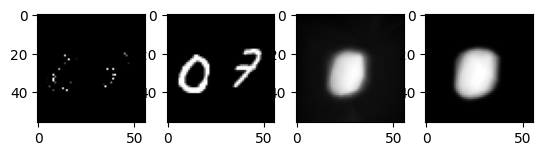

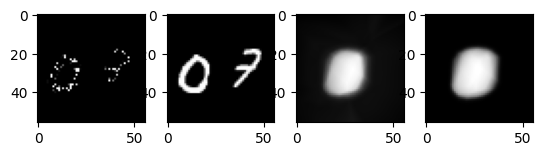

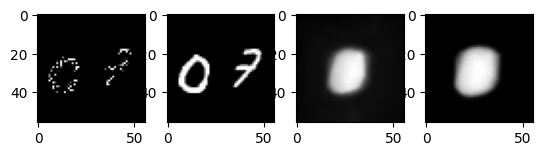

In [ ]:
plot_mnist_zsmm_range(imgs, cnp, [300, 600, 900])

In [ ]:
coords = torch.tensor([(x1, x2) for x1 in range(56) for x2 in range(56)])

In [ ]:
x_t = (torch.stack([coords]*imgs.shape[0]) - 28) / 16

In [ ]:
x_t.min()

tensor(-1.7500)

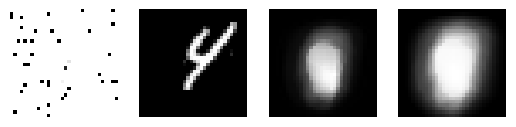

In [ ]:
plot_mnist_data(imgs, xs, mu_t, sigma_t, 32)

In [ ]:
running_val_loss = 0
for (imgs, labs) in mnist_valloader:

    n_context = torch.randint(low=n_context_low, high=n_context_high, size=(1,)).item()
    xs = coords[torch.randperm(coords.shape[0])[:n_context],:]
    x_c = torch.stack([xs]*imgs.shape[0]) / 32 # normalise inputs
    x_t = torch.stack([coords]*imgs.shape[0]) / 32
    x1s, x2s = xs[:,0], xs[:,1]
    y_c = imgs[:,:,x1s,x2s].transpose(1,2)
    y_t = imgs[:,:,coords[:,0], coords[:,1]].transpose(1,2)
    x_c, x_t, y_c, y_t = x_c.to(device), x_t.to(device), y_c.to(device), y_t.to(device)

    optimiser.zero_grad()
    mu_t, sigma_t = cnp(x_c, y_c, x_t)
    loss = - torch.distributions.normal.Normal(mu_t, sigma_t).log_prob(value=y_t).mean()
    running_val_loss += loss.item()

print(f"Loss at epoch {epoch}:", running_val_loss/len(mnist_valloader))

Loss at epoch 49: -1.867075494573086


In [ ]:
running_val_loss = 0
for (imgs, labs) in mnist_testloader:

    n_context = torch.randint(low=n_context_low, high=n_context_high, size=(1,)).item()
    xs = coords[torch.randperm(coords.shape[0])[:n_context],:]
    x_c = torch.stack([xs]*imgs.shape[0]) / 32 # normalise inputs
    x_t = torch.stack([coords]*imgs.shape[0]) / 32
    x1s, x2s = xs[:,0], xs[:,1]
    y_c = imgs[:,:,x1s,x2s].transpose(1,2)
    y_t = imgs[:,:,coords[:,0], coords[:,1]].transpose(1,2)
    x_c, x_t, y_c, y_t = x_c.to(device), x_t.to(device), y_c.to(device), y_t.to(device)

    optimiser.zero_grad()
    mu_t, sigma_t = cnp(x_c, y_c, x_t)
    loss = - torch.distributions.normal.Normal(mu_t, sigma_t).log_prob(value=y_t).mean()
    running_val_loss += loss.item()

print(f"Loss at epoch {epoch}:", running_val_loss/len(mnist_valloader))

Loss at epoch 49: 0.10153170137465754


IndexError: index 6 is out of bounds for axis 0 with size 6

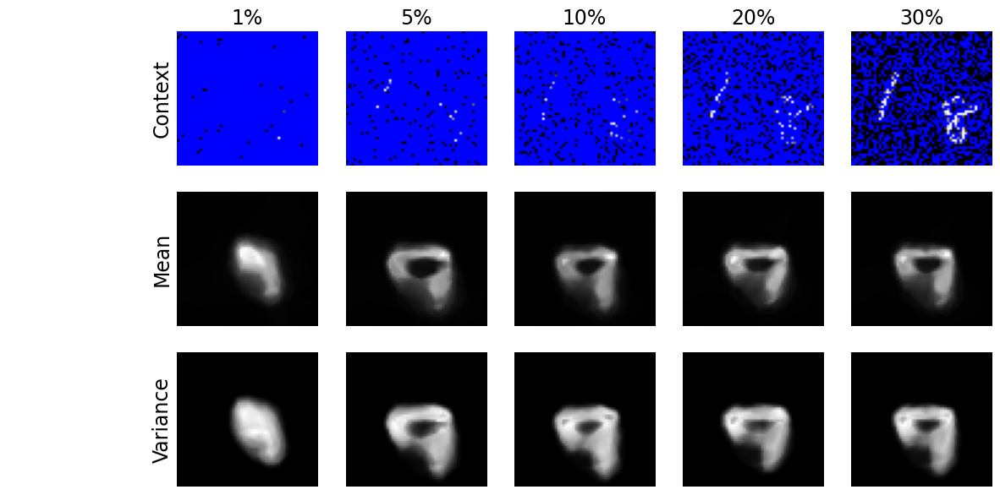

In [57]:
fig, axs = plt.subplots(nrows=3,ncols=6, figsize=(15,7))
model.train(False)
img_num = 3
coords = torch.tensor([(x1, x2) for x1 in range(56) for x2 in range(56)])
for i, c in enumerate([len(coords)//100, len(coords)//20, len(coords)//10, (len(coords)*2)//10, (len(coords)*5)//10]):

  xs = coords[torch.randperm(coords.shape[0])[:c],:]
  x1s, x2s = xs[:,0], xs[:,1]
  x_c = (torch.stack([xs]*imgs.shape[0]) - 28)/ 16 # normalise inputs
  x_t = (torch.stack([coords]*imgs.shape[0]) - 28) / 16
  x1s, x2s = xs[:,0], xs[:,1]
  y_c = imgs[:,:,x1s,x2s].transpose(1,2)
  y_t = imgs[:,:,coords[:,0], coords[:,1]].transpose(1,2)
  x_c, x_t, y_c, y_t = x_c.to(device), x_t.to(device), y_c.to(device), y_t.to(device)
  mu_t, sigma_t = cnp(x_c, y_c, x_t)
  background = torch.zeros((56,56, 3))
  background[:,:,-1] = 255
  imgs=imgs.to("cpu")
  background[x1s, x2s, :] = imgs[img_num,:,x1s, x2s].transpose(0,1)
  axs[0][i+1].imshow(background, cmap="gray", aspect = "auto")
  axs[1][i+1].imshow(mu_t.cpu().detach().view(imgs.shape[0], 56,56, 1)[img_num,:,:,:], cmap="gray", aspect = "auto")
  axs[2][i+1].imshow(sigma_t.cpu().detach().view(imgs.shape[0], 56,56, 1)[img_num,:,:,:]**2, cmap="gray", aspect = "auto")

for i in range(3):
  for j in range(6):
    axs[i][j].get_xaxis().set_ticks([])
    axs[i][j].get_yaxis().set_ticks([])
    axs[i][j].spines['left'].set_visible(False)
    axs[i][j].spines['right'].set_visible(False)
    axs[i][j].spines['top'].set_visible(False)
    axs[i][j].spines['bottom'].set_visible(False)

f = 17
axs[0][1].set_ylabel("Context", fontsize=f)
axs[1][1].set_ylabel("Mean", fontsize=f)
axs[2][1].set_ylabel("Variance", fontsize=f)

axs[0][1].set_title("1%", fontsize=f)
axs[0][2].set_title("5%", fontsize=f)
axs[0][3].set_title("10%", fontsize=f)
axs[0][4].set_title("20%", fontsize=f)
axs[0][5].set_title("30%", fontsize=f)
axs[0][6].set_title("50%", fontsize=f)

axs[1][0].imshow(imgs.to("cpu")[img_num,:,:,:].permute(1,2,0), cmap="gray", aspect="auto")
axs[1][0].set_title("True Image", fontsize=f)

plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.show()

### ConvCNP CelebA

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!pip install wget
import os
import wget
import zipfile
data_root = "datasets"

base_url = "https://graal.ift.ulaval.ca/public/celeba/"

file_list = [
    "img_align_celeba.zip",
    "list_attr_celeba.txt",
    "identity_CelebA.txt",
    "list_bbox_celeba.txt",
    "list_landmarks_align_celeba.txt",
    "list_eval_partition.txt",
]

# Path to folder with the dataset
dataset_folder = f"{data_root}/celeba"
os.makedirs(dataset_folder, exist_ok=True)

for file in file_list:
    url = f"{base_url}/{file}"
    if not os.path.exists(f"{dataset_folder}/{file}"):
        wget.download(url, f"{dataset_folder}/{file}")

with zipfile.ZipFile(f"{dataset_folder}/img_align_celeba.zip", "r") as ziphandler:
    ziphandler.extractall(dataset_folder)

  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9656 sha256=8235df694ee850d99ff9deb0fcfe12928accda27bfe6b0936bd1d073b7b12105
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget


In [ ]:
transforms = torchvision.transforms.Compose(
    [
        torchvision.transforms.Resize((32,32)),
        torchvision.transforms.ToTensor()
    ]
)
train_dataset = torchvision.datasets.CelebA(data_root, split="train", target_type=["attr", "landmarks"], transform=transforms)
valid_dataset = torchvision.datasets.CelebA(data_root, split="valid", target_type=["attr", "landmarks"], transform=transforms)
test_dataset = torchvision.datasets.CelebA(data_root, split="test", target_type=["attr", "landmarks"], transform=transforms)

In [ ]:
batch_size = 16
celeb_trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
celeb_testloader = torch.utils.data.DataLoader(test_dataset, batch_size=128, shuffle=False)
celeb_valloader = torch.utils.data.DataLoader(test_dataset, batch_size=256, shuffle=False)

In [ ]:
def plot_celeb_data(imgs, xs, mu_t, sigma_t):
  x1s, x2s = xs[:,0], xs[:,1]
  fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4)
  imgs = imgs.to("cpu")
  background = torch.ones((32,32,3)).to(imgs.device)
  background[x1s, x2s, :] = imgs[0,:,x1s, x2s].transpose(0,1)
  ax1.imshow(background)
  ax2.imshow(imgs[0,:,:,:].permute(1, 2, 0), cmap="gray")
  ax3.imshow(mu_t.cpu().detach()[0,:,:,:], cmap="gray")
  ax4.imshow(sigma_t.cpu().detach()[0,:,:,:], cmap="gray")
  plt.show()

In [ ]:
def plot_celeb_data_range(imgs, model, ns):
  for n in ns:
    xs = coords[torch.randperm(coords.shape[0])[:n],:]
    imgs = imgs.to(device)
    y_t = imgs.permute(0,2,3,1)
    mu_t, sigma_t = model(imgs, xs)
    plot_celeb_data(imgs, xs, mu_t, sigma_t)

In [ ]:
def get_exponential_decay_gamma(scheduling_factor, max_epochs):
    return (1 / scheduling_factor) ** (1 / max_epochs)

In [ ]:
coords = torch.tensor([(x1, x2) for x1 in range(32) for x2 in range(32)])
model = GridConvCNP(1, 3, 128, 5, 128, 4, 0.01, coords)
optimiser = torch.optim.Adam(model.parameters(), lr=1e-3)
#clip_value = 10
sched = torch.optim.lr_scheduler.ExponentialLR(optimiser, get_exponential_decay_gamma(10,100))
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
model = model.to(device)
sum(p.numel() for p in model.parameters())

340721

Loss at epoch 0: -1.056563754595581


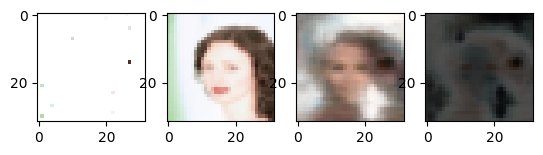

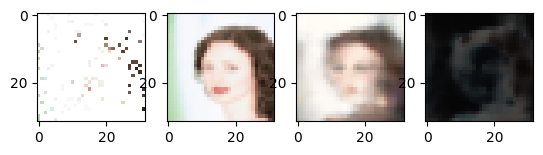

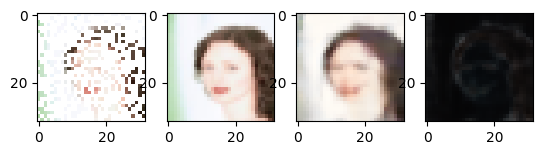

Loss at epoch 0: -1.3657154513475223
Loss at epoch 1: -1.4735059138456417


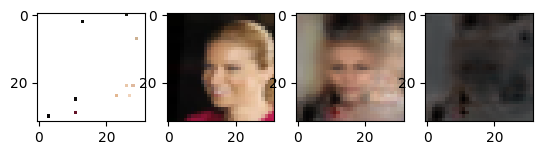

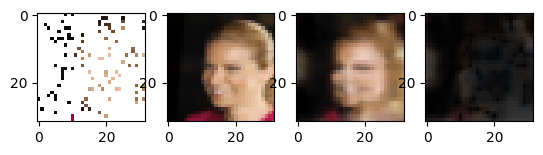

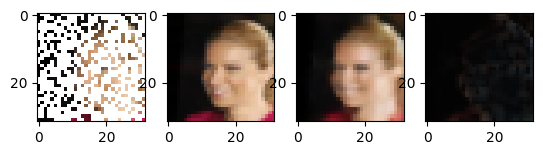

Loss at epoch 1: -1.621658701927234
Loss at epoch 2: -1.6232225432649532


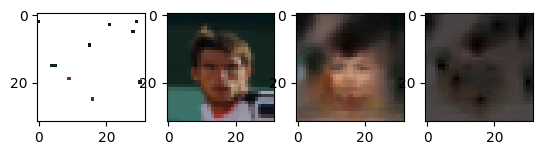

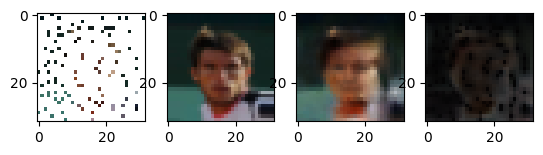

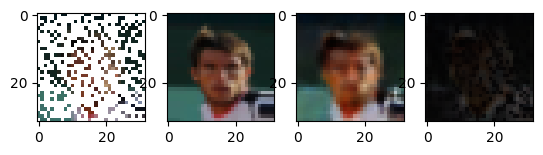

Loss at epoch 2: -1.729370511113069
Loss at epoch 3: -1.7004766794724386


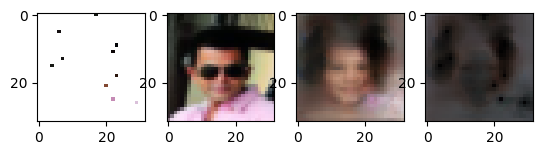

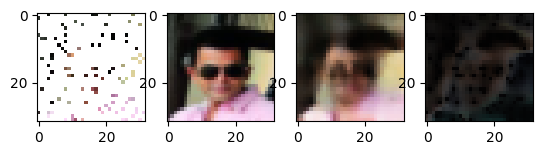

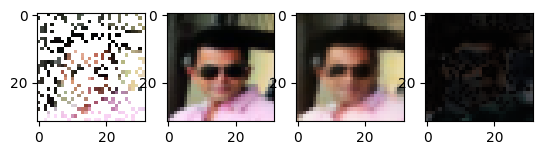

Loss at epoch 3: -1.8143299092084935
Loss at epoch 4: -1.7668639854260257


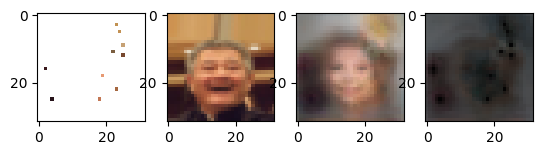

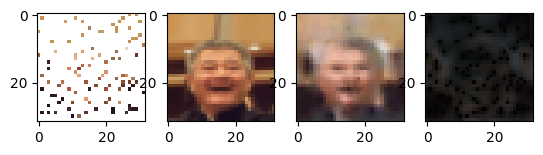

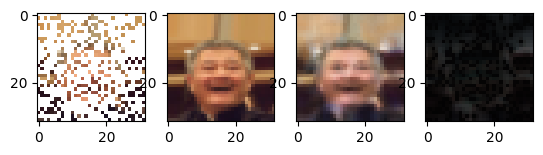

Loss at epoch 4: -1.8394122119897451
Loss at epoch 5: -1.8070042263249322


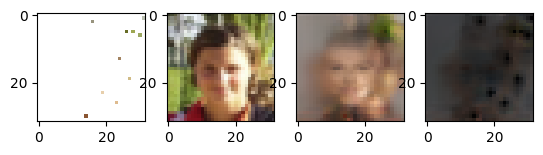

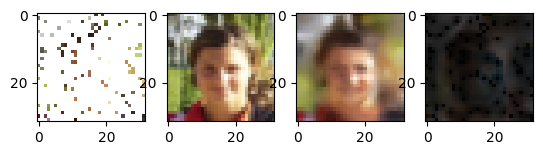

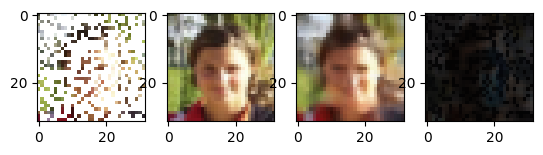

Loss at epoch 5: -1.8431354016065598
Loss at epoch 6: -1.8436569779063552


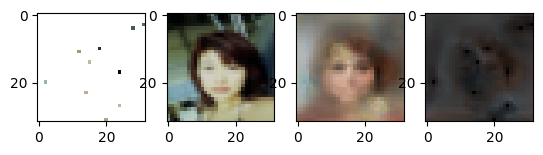

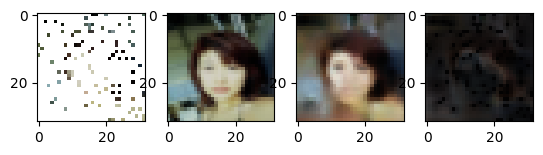

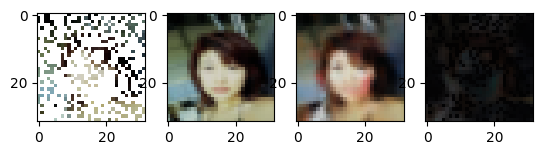

Loss at epoch 6: -1.9878642066166952
Loss at epoch 7: -1.862712417011335


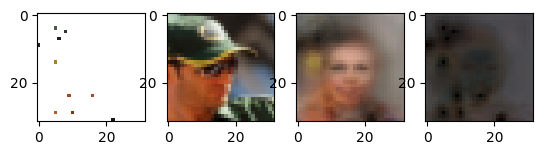

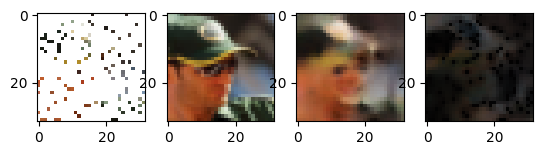

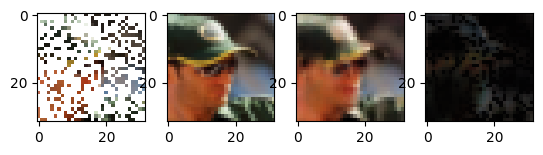

Loss at epoch 7: -2.0073039130522656
Loss at epoch 8: -1.8940944261273716


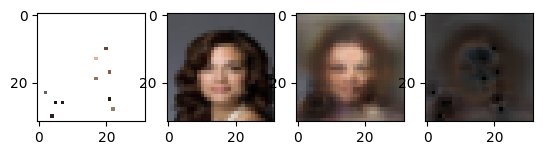

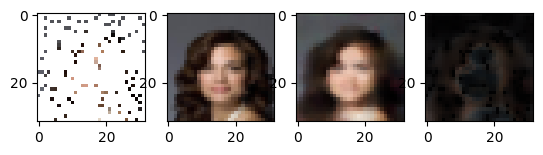

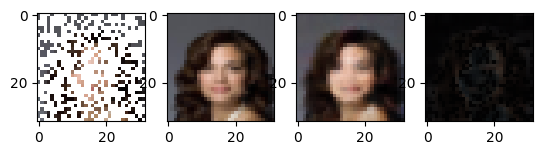

Loss at epoch 8: -1.8636718082886476


KeyboardInterrupt: 

In [ ]:
num_epochs = 100
coords = torch.tensor([(x1, x2) for x1 in range(32) for x2 in range(32)])
n_context_low = 0
n_context_high = len(coords) // 2
best_val_loss = 100
patience_count = 0

for epoch in range(num_epochs):
    running_loss = 0
    for (imgs, labs) in celeb_trainloader:

        n_context = torch.randint(low=n_context_low, high=n_context_high, size=(1,)).item()
        xs = coords[torch.randperm(coords.shape[0])[:n_context],:]
        imgs = imgs.to(device)
        y_t = imgs.permute(0,2,3,1)

        optimiser.zero_grad()
        mu_t, sigma_t = model(imgs, xs)
        loss = - torch.distributions.normal.Normal(mu_t, sigma_t).log_prob(value=y_t).mean()
        running_loss += loss.item()
        loss.backward()
        #torch.nn.utils.clip_grad_norm_(model.parameters(), clip_value)
        optimiser.step()

    sched.step()

    if epoch % 1 == 0:
        print(f"Loss at epoch {epoch}:", running_loss/len(celeb_trainloader))
        plot_celeb_data_range(imgs, model, [10, 100, 300])

    if epoch % 1 == 0:
        running_val_loss = 0
        for (imgs, labs) in celeb_valloader:
            n_context = torch.randint(low=len(coords)//100, high=len(coords)//2, size=(1,)).item()
            xs = coords[torch.randperm(coords.shape[0])[:n_context],:]
            imgs = imgs.to(device)
            y_t = imgs.permute(0,2,3,1)
            mu_t, sigma_t = model(imgs, xs)
            loss = - torch.distributions.normal.Normal(mu_t, sigma_t).log_prob(value=y_t).mean()
            running_val_loss += loss.item()
        print(f"Loss at epoch {epoch}:", running_val_loss/len(celeb_valloader))
        if running_val_loss < best_val_loss:
          PATH = f"/content/gdrive/My Drive/neural_processes/models/celeba32convbatch16/epoch_{epoch}.pt"
          torch.save(model.state_dict(), PATH)
          best_val_loss = running_val_loss
          patience_count = 0
        else:
          patience_count += 1

        #if patience_count == 10:
              #break

In [ ]:
def plot_celeb_data(imgs, xs, mu_t, sigma_t):
  x1s, x2s = xs[:,0], xs[:,1]
  fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4)
  imgs = imgs.to("cpu")
  background = torch.ones((32,32,3)).to(imgs.device)
  background[x1s, x2s, :] = imgs[0,:,x1s, x2s].transpose(0,1)
  ax1.imshow(background)
  ax2.imshow(imgs[0,:,:,:].permute(1, 2, 0), cmap="gray")
  ax3.imshow(mu_t.cpu().detach()[0,:,:,:], cmap="gray")
  ax4.imshow(sigma_t.cpu().detach()[0,:,:,:], cmap="gray")
  plt.show()

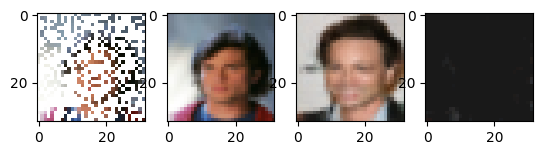

In [ ]:
plot_celeb_data(imgs, xs, mu_t, sigma_t)

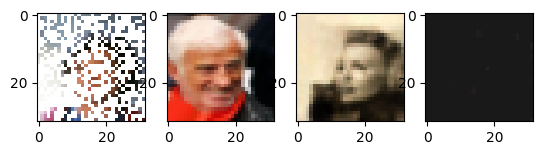

In [ ]:
  x1s, x2s = xs[:,0], xs[:,1]
  fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4)
  imgs = imgs.to("cpu")
  background = torch.ones((32,32,3)).to(imgs.device)
  background[x1s, x2s, :] = imgs[0,:,x1s, x2s].transpose(0,1)
  ax1.imshow(background)
  ax2.imshow(imgs[0,:,:,:].permute(1, 2, 0), cmap="gray")
  ax3.imshow(mu_t.cpu().detach()[0,:,:,:], cmap="gray")
  ax4.imshow(sigma_t.cpu().detach()[0,:,:,:], cmap="gray")
  plt.show()

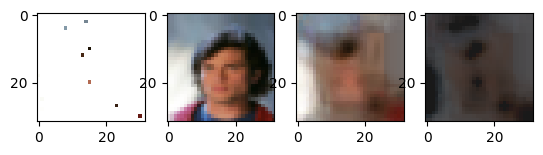

In [ ]:
n_context = len(coords) // 100
xs = coords[torch.randperm(coords.shape[0])[:n_context],:]
imgs = imgs.to(device)
y_t = imgs.permute(0,2,3,1)

mu_t, sigma_t = model(imgs, xs)
plot_celeb_data(imgs, xs, mu_t, sigma_t)